In [1]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
np.seterr(divide='ignore', invalid='ignore');
plt.rcParams.update({'figure.max_open_warning': 0})
import scipy.stats as stats
import astropy.units as u
from astropy.table import Table, Column, MaskedColumn, join
from tqdm import tqdm
from bisect import bisect_left
c = 2.998e10
k = 1.38e-16
h = 6.626e-27
plt.rcParams.update({'font.size': 22})
halpha = 6564.61
hbeta = 4862.68
hgamma = 4341.68
hdelta = 4102.89
plt.rcParams['figure.figsize'] = [15, 10]
from IPython.display import Audio, display
def allDone():
    display(Audio(filename='beep.mp3', autoplay=True))
from scipy.interpolate import interp1d,InterpolatedUnivariateSpline
import lmfit

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
import emcee
import corner
import numdifftools
from scipy.ndimage import interpolation
from scipy.signal import medfilt
from scipy.interpolate import interp1d
from multiprocessing import Pool
import pickle

In [2]:
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize,scale,MinMaxScaler,StandardScaler
import multiprocessing

Using TensorFlow backend.


# Get Data Spectra

In [3]:
wdtable = Table.read('wdtable_sn.fits')

good = (
    (wdtable['centre_beta'] < hbeta + 5)*
    (wdtable['centre_beta'] > hbeta - 5)*
    (wdtable['centre_alpha'] > halpha - 5)*
    (wdtable['centre_alpha'] < halpha + 5) * 
    (~np.isnan(wdtable['loggH']))*
    (~np.isnan(wdtable['TeffH']))*
    (wdtable['TeffH'] > 5000) * 
    (wdtable['TeffH'] < 80000) * 
    (wdtable['subclass'] == 'WD')[:,0].data*
    (wdtable['S2N'] > 2.5)
)
notgoodtable = wdtable[~good]
wdtable = wdtable[good]
len(wdtable)

2166

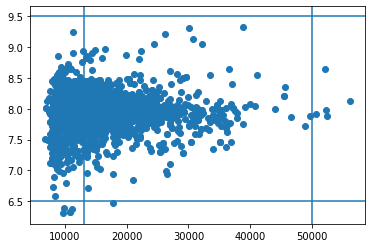

In [4]:
plt.scatter(wdtable['TeffH'],wdtable['loggH'])
plt.axhline(6.5)
plt.axhline(9.5)
plt.axvline(13000)
plt.axvline(50000)

In [6]:
TeffHs = [];
loggHs = [];
specnames = []
spectra = [];

# def rvcorr(spectrum):
#     lamgrid = np.arange(4000,8000)
#     coremask = (lamgrid == 6565)+(lamgrid == 4863)+(lamgrid == 4342)+(lamgrid == 4103)
#     coremask = coremask.astype(int)
#     trans = np.argmax(np.correlate(1-spectrum,coremask,mode='full'))-4000
#     if trans > 5:
#         trans = 5;
#     elif trans < 5:
#         trans = -5;
#     else:
#         ;
#     shiftedspec = interpolation.shift(spectrum,-trans,cval=1)
#     return shiftedspec

searchparameter = list(wdtable['specnames'])
bprps = [];
gs = [];
## Enter search parameter, if needed:
inputPath = "../scratch/spec_old/"

if os.path.exists(inputPath+".DS_Store"):
    os.remove(inputPath+"/.DS_Store")
    
filenames = [i+'.fits' for i in searchparameter]

from scipy.signal import medfilt
from scipy.interpolate import interp1d

len(filenames)

for specname in tqdm(filenames):
    f = fits.open(inputPath+specname)
    loglam = f[1].data['loglam']
    flux = f[1].data['flux']
    lam = 10**loglam
    lam = lam.astype(np.float64)
    flux = flux.astype(np.float64)
    lamgrid = np.arange(4000,8000)
    func = interp1d(lam,flux,kind='cubic',assume_sorted = False,fill_value='extrapolate')
    flux = func(lamgrid)
    spectra.append(flux)
    TeffHs.append(wdtable[wdtable['specnames']==specname[:-5]]['TeffH'][0])
    loggHs.append(wdtable[wdtable['specnames']==specname[:-5]]['loggH'][0])
    bprps.append(wdtable[wdtable['specnames']==specname[:-5]]['bp_rp'][0])
    gs.append(wdtable[wdtable['specnames']==specname[:-5]]['abs_g'][0])
    specnames.append(specname)
spectra = np.asarray(spectra)
TeffHs = np.asarray(TeffHs)
loggHs = np.asarray(loggHs)
bprps = np.asarray(bprps)
gs = np.asarray(gs)

100%|██████████| 2166/2166 [32:01<00:00,  4.85it/s]  


In [7]:
lam = np.arange(4000,8000)
lamgrid = lam
lines = ((lam > hbeta-300) & (lam < hbeta + 300)) | ((lam > halpha-400) & (lam < halpha + 400))\
        | ((lam > hgamma-400) & (lam < hgamma + 200))

mask = ~lines | ((lam > 4010) & (lam < 4050)) | ((lam > 4190) & (lam < 4230))
def quadratic(array,c1,c2,c3,c4):
    return c1 + c2*array + c3*array**2 + c4*array**3

In [8]:
normspec = [];

for i in tqdm(range(len(spectra))):
    p,cov = curve_fit(quadratic,lamgrid[mask],spectra[i][mask],p0=[-25,1e-2,1e-5,1e-10])
    contcorr = (spectra[i]/quadratic(lam,p[0],p[1],p[2],p[3]))
    skylinemask = (lamgrid > 5578.5 - 10)*(lamgrid < 5578.5 + 10) + (lamgrid > 5894.6 - 10)*(lamgrid < 5894.6 + 10)\
        + (lamgrid > 6301.7 - 10)*(lamgrid < 6301.7 + 10) + (lamgrid > 7246.0 - 10)*(lamgrid < 7246.0 + 10)
    contcorr[skylinemask] = 1
    #contcorr = rvcorr(contcorr)
    #contcorr = np.log(contcorr)
    where = np.isnan(contcorr)
    contcorr[where] = 0
    normspec.append(contcorr[0:3000])
normspec = np.asarray(normspec)
len(normspec)

100%|██████████| 2166/2166 [00:05<00:00, 384.19it/s]


2166

# Train Generator

In [9]:
sc = StandardScaler()

X = sc.fit_transform(np.stack((TeffHs,loggHs)).transpose())
t = normspec
X_train,X_test,y_train,y_test = train_test_split(X,t,test_size=0.1,random_state=13)

In [10]:
#import keras
def generator():
    x = Input(shape=(2,))
    y = Dense(25,activation='sigmoid')(x)
    y = Dropout(0.5)(y)
    y = Dense(25,activation='sigmoid')(y)
    y = Dropout(0.5)(y)
    out = Dense(3000,activation = 'linear')(y)
    
    model = Model(inputs = x, outputs = out)
    model.compile(optimizer = Adam(lr=0.001), loss = 'mse', \
                  metrics = ['mean_absolute_percentage_error'])
    return model
model = generator()
print(model.summary())
model.load_weights('ddriven_fitting.h5')

W0810 20:12:22.638176 47702372332864 deprecation_wrapper.py:119] From /home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0810 20:12:22.653179 47702372332864 deprecation_wrapper.py:119] From /home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0810 20:12:22.655566 47702372332864 deprecation_wrapper.py:119] From /home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0810 20:12:22.739386 47702372332864 deprecation_wrapper.py:119] From /home-4/vchandr8@jhu.edu/anaconda/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:133: The name tf.placeholder_with_default is depre

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 25)                75        
_________________________________________________________________
dropout_1 (Dropout)          (None, 25)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 25)                650       
_________________________________________________________________
dropout_2 (Dropout)          (None, 25)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 3000)              78000     
Total params: 78,725
Trainable params: 78,725
Non-trainable params: 0
_________________________________________________________________
None


In [65]:
epoch = 5000
batch = len(X)
history = [];
for i in tqdm(range(epoch)):
    h = model.fit(X,t,epochs=1,verbose=0,batch_size=batch)
    history.append(h.history['loss'][0])













  0%|          | 0/5000 [00:00<?, ?it/s]











  0%|          | 1/5000 [00:00<14:02,  5.94it/s]











  0%|          | 2/5000 [00:00<13:40,  6.09it/s]











  0%|          | 3/5000 [00:00<12:18,  6.77it/s]











  0%|          | 4/5000 [00:00<12:22,  6.73it/s]











  0%|          | 5/5000 [00:00<12:39,  6.58it/s]











  0%|          | 6/5000 [00:00<12:18,  6.77it/s]











  0%|          | 7/5000 [00:00<11:20,  7.34it/s]











  0%|          | 8/5000 [00:01<11:06,  7.49it/s]











  0%|          | 9/5000 [00:01<10:46,  7.72it/s]











  0%|          | 10/5000 [00:01<10:36,  7.84it/s]











  0%|          | 11/5000 [00:01<10:11,  8.16it/s]











  0%|          | 12/5000 [00:01<09:53,  8.41it/s]











  0%|          | 13/5000 [00:01<09:57,  8.35it/s]











  0%|          | 14/5000 [00:01<09:58,  8.33it/s]











  0%|          | 15/5000 [00:01<09:44,  8.53it/s]











  0%|          | 16/5000 [00:0

  2%|▏         | 84/5000 [00:10<10:00,  8.18it/s]











  2%|▏         | 85/5000 [00:10<10:14,  8.00it/s]











  2%|▏         | 86/5000 [00:10<09:52,  8.30it/s]











  2%|▏         | 87/5000 [00:10<10:06,  8.10it/s]











  2%|▏         | 88/5000 [00:10<09:59,  8.19it/s]











  2%|▏         | 89/5000 [00:10<09:32,  8.58it/s]











  2%|▏         | 90/5000 [00:10<09:21,  8.74it/s]











  2%|▏         | 91/5000 [00:10<09:31,  8.59it/s]











  2%|▏         | 92/5000 [00:11<09:45,  8.39it/s]











  2%|▏         | 93/5000 [00:11<09:48,  8.33it/s]











  2%|▏         | 94/5000 [00:11<09:39,  8.46it/s]











  2%|▏         | 95/5000 [00:11<09:50,  8.31it/s]











  2%|▏         | 96/5000 [00:11<09:48,  8.33it/s]











  2%|▏         | 97/5000 [00:11<09:46,  8.36it/s]











  2%|▏         | 98/5000 [00:11<09:49,  8.32it/s]











  2%|▏         | 99/5000 [00:11<10:19,  7.91it/s]











  2%|▏         | 100/500

  3%|▎         | 170/5000 [00:20<09:38,  8.35it/s]











  3%|▎         | 172/5000 [00:20<09:10,  8.77it/s]











  3%|▎         | 173/5000 [00:20<09:03,  8.88it/s]











  3%|▎         | 174/5000 [00:21<09:23,  8.56it/s]











  4%|▎         | 175/5000 [00:21<09:45,  8.24it/s]











  4%|▎         | 176/5000 [00:21<09:47,  8.21it/s]











  4%|▎         | 177/5000 [00:21<09:56,  8.09it/s]











  4%|▎         | 178/5000 [00:21<10:00,  8.02it/s]











  4%|▎         | 179/5000 [00:21<09:44,  8.25it/s]











  4%|▎         | 180/5000 [00:21<09:23,  8.56it/s]











  4%|▎         | 181/5000 [00:21<09:16,  8.65it/s]











  4%|▎         | 182/5000 [00:21<09:43,  8.25it/s]











  4%|▎         | 183/5000 [00:22<09:35,  8.37it/s]











  4%|▎         | 184/5000 [00:22<09:17,  8.63it/s]











  4%|▎         | 185/5000 [00:22<09:12,  8.72it/s]











  4%|▎         | 186/5000 [00:22<09:20,  8.58it/s]











  4%|▎  

  5%|▌         | 255/5000 [00:30<09:51,  8.03it/s]











  5%|▌         | 256/5000 [00:30<09:54,  7.98it/s]











  5%|▌         | 257/5000 [00:31<09:58,  7.93it/s]











  5%|▌         | 258/5000 [00:31<09:59,  7.91it/s]











  5%|▌         | 259/5000 [00:31<10:00,  7.89it/s]











  5%|▌         | 260/5000 [00:31<09:54,  7.97it/s]











  5%|▌         | 261/5000 [00:31<09:42,  8.14it/s]











  5%|▌         | 262/5000 [00:31<09:39,  8.18it/s]











  5%|▌         | 263/5000 [00:31<09:46,  8.07it/s]











  5%|▌         | 264/5000 [00:31<09:43,  8.11it/s]











  5%|▌         | 265/5000 [00:32<09:44,  8.10it/s]











  5%|▌         | 266/5000 [00:32<09:39,  8.17it/s]











  5%|▌         | 267/5000 [00:32<09:33,  8.25it/s]











  5%|▌         | 268/5000 [00:32<09:33,  8.26it/s]











  5%|▌         | 269/5000 [00:32<09:30,  8.29it/s]











  5%|▌         | 270/5000 [00:32<10:21,  7.61it/s]











  5%|▌  

  7%|▋         | 338/5000 [00:40<08:49,  8.80it/s]











  7%|▋         | 339/5000 [00:41<08:50,  8.78it/s]











  7%|▋         | 340/5000 [00:41<09:09,  8.48it/s]











  7%|▋         | 341/5000 [00:41<09:18,  8.34it/s]











  7%|▋         | 342/5000 [00:41<09:02,  8.59it/s]











  7%|▋         | 343/5000 [00:41<08:53,  8.73it/s]











  7%|▋         | 344/5000 [00:41<08:48,  8.81it/s]











  7%|▋         | 345/5000 [00:41<08:55,  8.70it/s]











  7%|▋         | 346/5000 [00:41<09:22,  8.28it/s]











  7%|▋         | 347/5000 [00:42<09:13,  8.41it/s]











  7%|▋         | 348/5000 [00:42<09:24,  8.24it/s]











  7%|▋         | 349/5000 [00:42<09:26,  8.22it/s]











  7%|▋         | 350/5000 [00:42<09:29,  8.17it/s]











  7%|▋         | 351/5000 [00:42<09:15,  8.36it/s]











  7%|▋         | 352/5000 [00:42<09:00,  8.60it/s]











  7%|▋         | 353/5000 [00:42<08:56,  8.65it/s]











  7%|▋  

  8%|▊         | 421/5000 [00:50<08:49,  8.64it/s]











  8%|▊         | 422/5000 [00:51<08:47,  8.68it/s]











  8%|▊         | 423/5000 [00:51<09:11,  8.30it/s]











  8%|▊         | 424/5000 [00:51<09:09,  8.32it/s]











  8%|▊         | 425/5000 [00:51<09:32,  7.99it/s]











  9%|▊         | 426/5000 [00:51<09:12,  8.28it/s]











  9%|▊         | 427/5000 [00:51<09:25,  8.09it/s]











  9%|▊         | 428/5000 [00:51<09:25,  8.09it/s]











  9%|▊         | 429/5000 [00:51<09:39,  7.89it/s]











  9%|▊         | 430/5000 [00:52<09:20,  8.15it/s]











  9%|▊         | 431/5000 [00:52<09:05,  8.37it/s]











  9%|▊         | 432/5000 [00:52<09:05,  8.37it/s]











  9%|▊         | 433/5000 [00:52<08:43,  8.73it/s]











  9%|▊         | 434/5000 [00:52<08:52,  8.58it/s]











  9%|▊         | 435/5000 [00:52<09:15,  8.22it/s]











  9%|▊         | 436/5000 [00:52<08:58,  8.47it/s]











  9%|▊  

 10%|█         | 505/5000 [01:01<08:58,  8.34it/s]











 10%|█         | 506/5000 [01:01<09:04,  8.25it/s]











 10%|█         | 507/5000 [01:01<09:03,  8.26it/s]











 10%|█         | 508/5000 [01:01<08:48,  8.50it/s]











 10%|█         | 509/5000 [01:01<09:11,  8.15it/s]











 10%|█         | 510/5000 [01:01<09:10,  8.15it/s]











 10%|█         | 511/5000 [01:01<08:59,  8.32it/s]











 10%|█         | 512/5000 [01:02<08:57,  8.35it/s]











 10%|█         | 513/5000 [01:02<08:34,  8.73it/s]











 10%|█         | 514/5000 [01:02<08:39,  8.63it/s]











 10%|█         | 515/5000 [01:02<08:45,  8.54it/s]











 10%|█         | 516/5000 [01:02<08:35,  8.70it/s]











 10%|█         | 517/5000 [01:02<08:37,  8.65it/s]











 10%|█         | 518/5000 [01:02<09:02,  8.26it/s]











 10%|█         | 519/5000 [01:02<09:07,  8.18it/s]











 10%|█         | 520/5000 [01:02<09:04,  8.23it/s]











 10%|█  

 12%|█▏        | 588/5000 [01:11<08:57,  8.21it/s]











 12%|█▏        | 589/5000 [01:11<08:52,  8.28it/s]











 12%|█▏        | 590/5000 [01:11<08:28,  8.67it/s]











 12%|█▏        | 591/5000 [01:11<08:49,  8.33it/s]











 12%|█▏        | 592/5000 [01:11<09:16,  7.92it/s]











 12%|█▏        | 593/5000 [01:11<09:15,  7.93it/s]











 12%|█▏        | 594/5000 [01:11<09:16,  7.91it/s]











 12%|█▏        | 595/5000 [01:12<09:18,  7.89it/s]











 12%|█▏        | 596/5000 [01:12<09:15,  7.93it/s]











 12%|█▏        | 597/5000 [01:12<09:24,  7.79it/s]











 12%|█▏        | 598/5000 [01:12<09:37,  7.62it/s]











 12%|█▏        | 599/5000 [01:12<09:13,  7.95it/s]











 12%|█▏        | 600/5000 [01:12<09:01,  8.12it/s]











 12%|█▏        | 601/5000 [01:12<08:38,  8.48it/s]











 12%|█▏        | 602/5000 [01:12<09:02,  8.11it/s]











 12%|█▏        | 603/5000 [01:13<09:14,  7.92it/s]











 12%|█▏ 

 13%|█▎        | 671/5000 [01:21<08:17,  8.69it/s]











 13%|█▎        | 672/5000 [01:21<08:07,  8.87it/s]











 13%|█▎        | 673/5000 [01:21<08:16,  8.72it/s]











 13%|█▎        | 674/5000 [01:21<08:17,  8.70it/s]











 14%|█▎        | 675/5000 [01:21<08:26,  8.54it/s]











 14%|█▎        | 676/5000 [01:22<09:40,  7.44it/s]











 14%|█▎        | 677/5000 [01:22<09:51,  7.30it/s]











 14%|█▎        | 678/5000 [01:22<09:40,  7.44it/s]











 14%|█▎        | 679/5000 [01:22<09:53,  7.28it/s]











 14%|█▎        | 680/5000 [01:22<09:58,  7.22it/s]











 14%|█▎        | 681/5000 [01:22<09:36,  7.49it/s]











 14%|█▎        | 682/5000 [01:22<09:13,  7.80it/s]











 14%|█▎        | 683/5000 [01:22<09:30,  7.57it/s]











 14%|█▎        | 684/5000 [01:23<09:13,  7.80it/s]











 14%|█▎        | 685/5000 [01:23<09:06,  7.90it/s]











 14%|█▎        | 686/5000 [01:23<09:11,  7.83it/s]











 14%|█▎ 

 15%|█▌        | 754/5000 [01:31<08:03,  8.78it/s]











 15%|█▌        | 755/5000 [01:31<08:08,  8.69it/s]











 15%|█▌        | 756/5000 [01:31<08:56,  7.91it/s]











 15%|█▌        | 757/5000 [01:31<09:20,  7.57it/s]











 15%|█▌        | 758/5000 [01:32<09:07,  7.75it/s]











 15%|█▌        | 759/5000 [01:32<09:17,  7.61it/s]











 15%|█▌        | 760/5000 [01:32<08:56,  7.91it/s]











 15%|█▌        | 761/5000 [01:32<09:04,  7.79it/s]











 15%|█▌        | 763/5000 [01:32<08:34,  8.23it/s]











 15%|█▌        | 764/5000 [01:32<08:28,  8.34it/s]











 15%|█▌        | 765/5000 [01:32<08:16,  8.53it/s]











 15%|█▌        | 766/5000 [01:33<08:00,  8.81it/s]











 15%|█▌        | 767/5000 [01:33<08:05,  8.71it/s]











 15%|█▌        | 768/5000 [01:33<08:21,  8.44it/s]











 15%|█▌        | 769/5000 [01:33<08:09,  8.64it/s]











 15%|█▌        | 770/5000 [01:33<08:21,  8.44it/s]











 15%|█▌ 

 17%|█▋        | 838/5000 [01:41<08:48,  7.87it/s]











 17%|█▋        | 839/5000 [01:41<08:36,  8.05it/s]











 17%|█▋        | 840/5000 [01:41<08:41,  7.98it/s]











 17%|█▋        | 841/5000 [01:42<08:46,  7.91it/s]











 17%|█▋        | 842/5000 [01:42<08:36,  8.04it/s]











 17%|█▋        | 843/5000 [01:42<08:38,  8.02it/s]











 17%|█▋        | 844/5000 [01:42<08:29,  8.16it/s]











 17%|█▋        | 845/5000 [01:42<08:12,  8.44it/s]











 17%|█▋        | 846/5000 [01:42<08:02,  8.62it/s]











 17%|█▋        | 847/5000 [01:42<07:58,  8.67it/s]











 17%|█▋        | 848/5000 [01:42<08:04,  8.57it/s]











 17%|█▋        | 849/5000 [01:43<07:55,  8.72it/s]











 17%|█▋        | 850/5000 [01:43<07:43,  8.96it/s]











 17%|█▋        | 851/5000 [01:43<08:05,  8.55it/s]











 17%|█▋        | 852/5000 [01:43<07:56,  8.70it/s]











 17%|█▋        | 853/5000 [01:43<08:03,  8.58it/s]











 17%|█▋ 

 18%|█▊        | 921/5000 [01:51<08:10,  8.32it/s]











 18%|█▊        | 922/5000 [01:51<08:13,  8.26it/s]











 18%|█▊        | 923/5000 [01:51<08:16,  8.22it/s]











 18%|█▊        | 924/5000 [01:52<08:00,  8.48it/s]











 18%|█▊        | 925/5000 [01:52<07:55,  8.56it/s]











 19%|█▊        | 926/5000 [01:52<07:57,  8.52it/s]











 19%|█▊        | 927/5000 [01:52<07:41,  8.82it/s]











 19%|█▊        | 928/5000 [01:52<07:30,  9.04it/s]











 19%|█▊        | 929/5000 [01:52<07:40,  8.85it/s]











 19%|█▊        | 930/5000 [01:52<07:45,  8.75it/s]











 19%|█▊        | 931/5000 [01:52<07:54,  8.57it/s]











 19%|█▊        | 932/5000 [01:52<08:08,  8.33it/s]











 19%|█▊        | 933/5000 [01:53<08:04,  8.40it/s]











 19%|█▊        | 934/5000 [01:53<08:11,  8.28it/s]











 19%|█▊        | 935/5000 [01:53<08:21,  8.10it/s]











 19%|█▊        | 936/5000 [01:53<08:07,  8.34it/s]











 19%|█▊ 

 20%|██        | 1007/5000 [02:02<08:04,  8.25it/s]











 20%|██        | 1008/5000 [02:02<07:58,  8.34it/s]











 20%|██        | 1009/5000 [02:02<08:08,  8.16it/s]











 20%|██        | 1010/5000 [02:02<07:46,  8.55it/s]











 20%|██        | 1011/5000 [02:02<07:44,  8.59it/s]











 20%|██        | 1012/5000 [02:02<07:59,  8.33it/s]











 20%|██        | 1013/5000 [02:02<07:55,  8.38it/s]











 20%|██        | 1014/5000 [02:02<07:35,  8.75it/s]











 20%|██        | 1015/5000 [02:03<07:55,  8.38it/s]











 20%|██        | 1016/5000 [02:03<08:03,  8.25it/s]











 20%|██        | 1017/5000 [02:03<08:00,  8.29it/s]











 20%|██        | 1018/5000 [02:03<07:53,  8.41it/s]











 20%|██        | 1019/5000 [02:03<08:01,  8.27it/s]











 20%|██        | 1020/5000 [02:03<07:47,  8.52it/s]











 20%|██        | 1021/5000 [02:03<07:57,  8.33it/s]











 20%|██        | 1022/5000 [02:03<08:04,  8.22it/s]





 22%|██▏       | 1092/5000 [02:12<07:33,  8.61it/s]











 22%|██▏       | 1093/5000 [02:12<07:57,  8.18it/s]











 22%|██▏       | 1094/5000 [02:12<07:56,  8.20it/s]











 22%|██▏       | 1095/5000 [02:12<08:00,  8.13it/s]











 22%|██▏       | 1096/5000 [02:12<08:43,  7.46it/s]











 22%|██▏       | 1097/5000 [02:13<08:46,  7.42it/s]











 22%|██▏       | 1098/5000 [02:13<08:39,  7.52it/s]











 22%|██▏       | 1099/5000 [02:13<08:28,  7.67it/s]











 22%|██▏       | 1100/5000 [02:13<08:05,  8.03it/s]











 22%|██▏       | 1101/5000 [02:13<07:53,  8.23it/s]











 22%|██▏       | 1102/5000 [02:13<07:40,  8.46it/s]











 22%|██▏       | 1103/5000 [02:13<07:41,  8.44it/s]











 22%|██▏       | 1104/5000 [02:13<07:40,  8.46it/s]











 22%|██▏       | 1105/5000 [02:14<07:21,  8.82it/s]











 22%|██▏       | 1106/5000 [02:14<07:45,  8.37it/s]











 22%|██▏       | 1107/5000 [02:14<07:50,  8.28it/s]





 24%|██▎       | 1175/5000 [02:22<07:51,  8.11it/s]











 24%|██▎       | 1176/5000 [02:22<07:52,  8.09it/s]











 24%|██▎       | 1177/5000 [02:22<07:37,  8.35it/s]











 24%|██▎       | 1178/5000 [02:23<07:40,  8.30it/s]











 24%|██▎       | 1179/5000 [02:23<07:28,  8.51it/s]











 24%|██▎       | 1180/5000 [02:23<07:34,  8.40it/s]











 24%|██▎       | 1181/5000 [02:23<07:39,  8.31it/s]











 24%|██▎       | 1182/5000 [02:23<07:26,  8.54it/s]











 24%|██▎       | 1183/5000 [02:23<07:23,  8.61it/s]











 24%|██▎       | 1184/5000 [02:23<07:26,  8.55it/s]











 24%|██▎       | 1185/5000 [02:23<07:21,  8.64it/s]











 24%|██▎       | 1186/5000 [02:23<07:15,  8.76it/s]











 24%|██▎       | 1187/5000 [02:24<07:33,  8.41it/s]











 24%|██▍       | 1188/5000 [02:24<07:48,  8.13it/s]











 24%|██▍       | 1189/5000 [02:24<07:46,  8.16it/s]











 24%|██▍       | 1190/5000 [02:24<07:49,  8.12it/s]





 25%|██▌       | 1260/5000 [02:32<07:07,  8.74it/s]











 25%|██▌       | 1261/5000 [02:32<07:21,  8.47it/s]











 25%|██▌       | 1262/5000 [02:33<07:27,  8.34it/s]











 25%|██▌       | 1263/5000 [02:33<07:38,  8.16it/s]











 25%|██▌       | 1264/5000 [02:33<07:24,  8.41it/s]











 25%|██▌       | 1265/5000 [02:33<07:38,  8.15it/s]











 25%|██▌       | 1266/5000 [02:33<07:35,  8.19it/s]











 25%|██▌       | 1267/5000 [02:33<07:26,  8.37it/s]











 25%|██▌       | 1268/5000 [02:33<07:25,  8.37it/s]











 25%|██▌       | 1269/5000 [02:33<07:26,  8.35it/s]











 25%|██▌       | 1270/5000 [02:34<07:23,  8.41it/s]











 25%|██▌       | 1271/5000 [02:34<07:26,  8.35it/s]











 25%|██▌       | 1272/5000 [02:34<07:34,  8.20it/s]











 25%|██▌       | 1273/5000 [02:34<07:33,  8.22it/s]











 25%|██▌       | 1274/5000 [02:34<07:32,  8.23it/s]











 26%|██▌       | 1275/5000 [02:34<07:41,  8.07it/s]





 27%|██▋       | 1342/5000 [02:42<07:28,  8.16it/s]











 27%|██▋       | 1343/5000 [02:42<07:04,  8.61it/s]











 27%|██▋       | 1344/5000 [02:43<07:08,  8.54it/s]











 27%|██▋       | 1346/5000 [02:43<06:56,  8.76it/s]











 27%|██▋       | 1347/5000 [02:43<07:04,  8.61it/s]











 27%|██▋       | 1348/5000 [02:43<06:57,  8.74it/s]











 27%|██▋       | 1349/5000 [02:43<07:08,  8.52it/s]











 27%|██▋       | 1350/5000 [02:43<07:12,  8.44it/s]











 27%|██▋       | 1351/5000 [02:43<07:10,  8.48it/s]











 27%|██▋       | 1352/5000 [02:44<07:28,  8.13it/s]











 27%|██▋       | 1353/5000 [02:44<07:43,  7.87it/s]











 27%|██▋       | 1354/5000 [02:44<07:51,  7.73it/s]











 27%|██▋       | 1355/5000 [02:44<07:33,  8.04it/s]











 27%|██▋       | 1356/5000 [02:44<07:30,  8.09it/s]











 27%|██▋       | 1357/5000 [02:44<07:28,  8.12it/s]











 27%|██▋       | 1358/5000 [02:44<07:33,  8.04it/s]





 28%|██▊       | 1425/5000 [02:52<07:26,  8.01it/s]











 29%|██▊       | 1426/5000 [02:53<07:09,  8.33it/s]











 29%|██▊       | 1427/5000 [02:53<07:03,  8.43it/s]











 29%|██▊       | 1428/5000 [02:53<07:19,  8.13it/s]











 29%|██▊       | 1429/5000 [02:53<07:09,  8.31it/s]











 29%|██▊       | 1430/5000 [02:53<07:05,  8.39it/s]











 29%|██▊       | 1431/5000 [02:53<07:03,  8.42it/s]











 29%|██▊       | 1432/5000 [02:53<06:52,  8.65it/s]











 29%|██▊       | 1433/5000 [02:53<06:36,  8.99it/s]











 29%|██▊       | 1434/5000 [02:54<06:46,  8.76it/s]











 29%|██▊       | 1435/5000 [02:54<07:04,  8.40it/s]











 29%|██▊       | 1436/5000 [02:54<07:01,  8.46it/s]











 29%|██▊       | 1437/5000 [02:54<07:04,  8.39it/s]











 29%|██▉       | 1438/5000 [02:54<06:58,  8.51it/s]











 29%|██▉       | 1439/5000 [02:54<07:02,  8.42it/s]











 29%|██▉       | 1440/5000 [02:54<06:57,  8.53it/s]





 30%|███       | 1508/5000 [03:02<07:00,  8.30it/s]











 30%|███       | 1510/5000 [03:03<06:46,  8.58it/s]











 30%|███       | 1511/5000 [03:03<06:52,  8.47it/s]











 30%|███       | 1512/5000 [03:03<06:41,  8.69it/s]











 30%|███       | 1513/5000 [03:03<06:40,  8.70it/s]











 30%|███       | 1514/5000 [03:03<06:44,  8.61it/s]











 30%|███       | 1515/5000 [03:03<07:08,  8.13it/s]











 30%|███       | 1516/5000 [03:03<06:59,  8.30it/s]











 30%|███       | 1517/5000 [03:03<06:59,  8.29it/s]











 30%|███       | 1518/5000 [03:04<06:53,  8.41it/s]











 30%|███       | 1519/5000 [03:04<06:47,  8.55it/s]











 30%|███       | 1520/5000 [03:04<06:52,  8.44it/s]











 30%|███       | 1521/5000 [03:04<06:50,  8.47it/s]











 30%|███       | 1522/5000 [03:04<06:54,  8.38it/s]











 30%|███       | 1523/5000 [03:04<06:56,  8.34it/s]











 30%|███       | 1524/5000 [03:04<06:46,  8.55it/s]





 32%|███▏      | 1591/5000 [03:13<08:00,  7.10it/s]











 32%|███▏      | 1592/5000 [03:13<08:06,  7.01it/s]











 32%|███▏      | 1593/5000 [03:13<07:55,  7.17it/s]











 32%|███▏      | 1594/5000 [03:13<07:36,  7.46it/s]











 32%|███▏      | 1595/5000 [03:13<07:13,  7.86it/s]











 32%|███▏      | 1596/5000 [03:13<07:10,  7.91it/s]











 32%|███▏      | 1597/5000 [03:13<07:08,  7.93it/s]











 32%|███▏      | 1598/5000 [03:13<06:51,  8.26it/s]











 32%|███▏      | 1599/5000 [03:14<06:34,  8.62it/s]











 32%|███▏      | 1600/5000 [03:14<06:37,  8.56it/s]











 32%|███▏      | 1601/5000 [03:14<06:43,  8.42it/s]











 32%|███▏      | 1602/5000 [03:14<07:03,  8.03it/s]











 32%|███▏      | 1603/5000 [03:14<06:58,  8.11it/s]











 32%|███▏      | 1604/5000 [03:14<06:36,  8.57it/s]











 32%|███▏      | 1605/5000 [03:14<06:26,  8.77it/s]











 32%|███▏      | 1606/5000 [03:14<06:33,  8.63it/s]





 34%|███▎      | 1675/5000 [03:23<06:42,  8.26it/s]











 34%|███▎      | 1676/5000 [03:23<06:59,  7.93it/s]











 34%|███▎      | 1677/5000 [03:23<07:06,  7.79it/s]











 34%|███▎      | 1678/5000 [03:23<06:54,  8.02it/s]











 34%|███▎      | 1679/5000 [03:23<06:55,  8.00it/s]











 34%|███▎      | 1680/5000 [03:23<06:37,  8.34it/s]











 34%|███▎      | 1681/5000 [03:24<06:45,  8.19it/s]











 34%|███▎      | 1682/5000 [03:24<06:25,  8.60it/s]











 34%|███▎      | 1683/5000 [03:24<06:27,  8.55it/s]











 34%|███▎      | 1684/5000 [03:24<06:31,  8.47it/s]











 34%|███▎      | 1685/5000 [03:24<06:27,  8.56it/s]











 34%|███▎      | 1686/5000 [03:24<06:29,  8.52it/s]











 34%|███▎      | 1687/5000 [03:24<06:19,  8.72it/s]











 34%|███▍      | 1688/5000 [03:24<06:10,  8.93it/s]











 34%|███▍      | 1689/5000 [03:24<06:13,  8.86it/s]











 34%|███▍      | 1690/5000 [03:25<06:22,  8.65it/s]





 35%|███▌      | 1757/5000 [03:33<06:17,  8.58it/s]











 35%|███▌      | 1758/5000 [03:33<06:12,  8.71it/s]











 35%|███▌      | 1759/5000 [03:33<06:15,  8.64it/s]











 35%|███▌      | 1760/5000 [03:33<06:14,  8.66it/s]











 35%|███▌      | 1761/5000 [03:33<06:16,  8.61it/s]











 35%|███▌      | 1762/5000 [03:33<06:22,  8.47it/s]











 35%|███▌      | 1763/5000 [03:33<06:14,  8.65it/s]











 35%|███▌      | 1764/5000 [03:33<06:26,  8.37it/s]











 35%|███▌      | 1765/5000 [03:34<06:26,  8.37it/s]











 35%|███▌      | 1766/5000 [03:34<06:20,  8.49it/s]











 35%|███▌      | 1767/5000 [03:34<06:11,  8.70it/s]











 35%|███▌      | 1768/5000 [03:34<06:30,  8.28it/s]











 35%|███▌      | 1769/5000 [03:34<06:22,  8.45it/s]











 35%|███▌      | 1770/5000 [03:34<06:26,  8.35it/s]











 35%|███▌      | 1771/5000 [03:34<06:39,  8.09it/s]











 35%|███▌      | 1772/5000 [03:34<06:37,  8.12it/s]





 37%|███▋      | 1841/5000 [03:43<06:18,  8.35it/s]











 37%|███▋      | 1842/5000 [03:43<06:07,  8.59it/s]











 37%|███▋      | 1843/5000 [03:43<06:13,  8.45it/s]











 37%|███▋      | 1844/5000 [03:43<06:21,  8.27it/s]











 37%|███▋      | 1845/5000 [03:43<06:22,  8.26it/s]











 37%|███▋      | 1846/5000 [03:43<06:32,  8.04it/s]











 37%|███▋      | 1847/5000 [03:44<06:22,  8.25it/s]











 37%|███▋      | 1848/5000 [03:44<06:27,  8.14it/s]











 37%|███▋      | 1849/5000 [03:44<06:26,  8.15it/s]











 37%|███▋      | 1850/5000 [03:44<06:31,  8.04it/s]











 37%|███▋      | 1851/5000 [03:44<06:29,  8.08it/s]











 37%|███▋      | 1852/5000 [03:44<06:30,  8.06it/s]











 37%|███▋      | 1853/5000 [03:44<06:19,  8.30it/s]











 37%|███▋      | 1854/5000 [03:44<06:20,  8.27it/s]











 37%|███▋      | 1855/5000 [03:44<06:11,  8.47it/s]











 37%|███▋      | 1856/5000 [03:45<06:31,  8.03it/s]





 38%|███▊      | 1924/5000 [03:53<06:13,  8.23it/s]











 38%|███▊      | 1925/5000 [03:53<05:53,  8.69it/s]











 39%|███▊      | 1926/5000 [03:53<06:18,  8.11it/s]











 39%|███▊      | 1927/5000 [03:53<06:17,  8.14it/s]











 39%|███▊      | 1928/5000 [03:54<06:11,  8.26it/s]











 39%|███▊      | 1929/5000 [03:54<05:57,  8.59it/s]











 39%|███▊      | 1930/5000 [03:54<06:01,  8.50it/s]











 39%|███▊      | 1931/5000 [03:54<06:03,  8.44it/s]











 39%|███▊      | 1932/5000 [03:54<05:58,  8.55it/s]











 39%|███▊      | 1933/5000 [03:54<06:01,  8.49it/s]











 39%|███▊      | 1934/5000 [03:54<05:55,  8.63it/s]











 39%|███▊      | 1935/5000 [03:54<05:48,  8.79it/s]











 39%|███▊      | 1936/5000 [03:54<05:53,  8.67it/s]











 39%|███▊      | 1937/5000 [03:55<05:58,  8.55it/s]











 39%|███▉      | 1938/5000 [03:55<05:59,  8.51it/s]











 39%|███▉      | 1939/5000 [03:55<06:01,  8.48it/s]





 40%|████      | 2006/5000 [04:03<06:23,  7.80it/s]











 40%|████      | 2007/5000 [04:03<06:14,  7.99it/s]











 40%|████      | 2008/5000 [04:03<06:14,  8.00it/s]











 40%|████      | 2009/5000 [04:03<05:54,  8.45it/s]











 40%|████      | 2010/5000 [04:03<06:00,  8.29it/s]











 40%|████      | 2011/5000 [04:04<06:00,  8.29it/s]











 40%|████      | 2012/5000 [04:04<05:57,  8.35it/s]











 40%|████      | 2013/5000 [04:04<05:57,  8.36it/s]











 40%|████      | 2014/5000 [04:04<06:03,  8.21it/s]











 40%|████      | 2015/5000 [04:04<06:08,  8.10it/s]











 40%|████      | 2016/5000 [04:04<06:09,  8.08it/s]











 40%|████      | 2017/5000 [04:04<05:55,  8.40it/s]











 40%|████      | 2018/5000 [04:04<06:01,  8.24it/s]











 40%|████      | 2019/5000 [04:05<06:28,  7.67it/s]











 40%|████      | 2020/5000 [04:05<06:37,  7.50it/s]











 40%|████      | 2021/5000 [04:05<06:31,  7.62it/s]





 42%|████▏     | 2089/5000 [04:13<05:38,  8.59it/s]











 42%|████▏     | 2090/5000 [04:13<05:50,  8.30it/s]











 42%|████▏     | 2091/5000 [04:13<05:58,  8.11it/s]











 42%|████▏     | 2092/5000 [04:13<05:58,  8.11it/s]











 42%|████▏     | 2093/5000 [04:14<06:03,  7.99it/s]











 42%|████▏     | 2094/5000 [04:14<06:13,  7.78it/s]











 42%|████▏     | 2095/5000 [04:14<06:13,  7.78it/s]











 42%|████▏     | 2096/5000 [04:14<06:04,  7.97it/s]











 42%|████▏     | 2097/5000 [04:14<06:02,  8.01it/s]











 42%|████▏     | 2098/5000 [04:14<05:58,  8.09it/s]











 42%|████▏     | 2099/5000 [04:14<05:51,  8.25it/s]











 42%|████▏     | 2100/5000 [04:14<05:58,  8.08it/s]











 42%|████▏     | 2101/5000 [04:15<05:44,  8.41it/s]











 42%|████▏     | 2102/5000 [04:15<05:55,  8.15it/s]











 42%|████▏     | 2103/5000 [04:15<06:11,  7.81it/s]











 42%|████▏     | 2104/5000 [04:15<06:18,  7.65it/s]





 43%|████▎     | 2171/5000 [04:23<05:38,  8.35it/s]











 43%|████▎     | 2172/5000 [04:23<05:33,  8.48it/s]











 43%|████▎     | 2173/5000 [04:24<05:42,  8.25it/s]











 44%|████▎     | 2175/5000 [04:24<05:46,  8.16it/s]











 44%|████▎     | 2176/5000 [04:24<06:03,  7.76it/s]











 44%|████▎     | 2177/5000 [04:24<06:04,  7.74it/s]











 44%|████▎     | 2178/5000 [04:24<05:45,  8.17it/s]











 44%|████▎     | 2179/5000 [04:24<06:01,  7.80it/s]











 44%|████▎     | 2180/5000 [04:25<06:00,  7.81it/s]











 44%|████▎     | 2181/5000 [04:25<05:59,  7.83it/s]











 44%|████▎     | 2182/5000 [04:25<05:54,  7.94it/s]











 44%|████▎     | 2183/5000 [04:25<05:49,  8.07it/s]











 44%|████▎     | 2184/5000 [04:25<05:42,  8.21it/s]











 44%|████▎     | 2185/5000 [04:25<05:28,  8.57it/s]











 44%|████▎     | 2186/5000 [04:25<05:36,  8.36it/s]











 44%|████▎     | 2187/5000 [04:25<05:58,  7.86it/s]





 45%|████▌     | 2254/5000 [04:34<05:26,  8.42it/s]











 45%|████▌     | 2255/5000 [04:34<05:31,  8.28it/s]











 45%|████▌     | 2256/5000 [04:34<05:30,  8.31it/s]











 45%|████▌     | 2257/5000 [04:34<05:20,  8.56it/s]











 45%|████▌     | 2258/5000 [04:34<05:29,  8.32it/s]











 45%|████▌     | 2259/5000 [04:34<05:39,  8.07it/s]











 45%|████▌     | 2260/5000 [04:34<05:31,  8.26it/s]











 45%|████▌     | 2261/5000 [04:34<05:26,  8.40it/s]











 45%|████▌     | 2262/5000 [04:35<05:33,  8.20it/s]











 45%|████▌     | 2263/5000 [04:35<05:40,  8.04it/s]











 45%|████▌     | 2264/5000 [04:35<05:46,  7.90it/s]











 45%|████▌     | 2265/5000 [04:35<05:42,  7.99it/s]











 45%|████▌     | 2266/5000 [04:35<05:43,  7.97it/s]











 45%|████▌     | 2267/5000 [04:35<05:41,  8.01it/s]











 45%|████▌     | 2268/5000 [04:35<05:31,  8.24it/s]











 45%|████▌     | 2269/5000 [04:35<05:28,  8.31it/s]





 47%|████▋     | 2338/5000 [04:44<05:19,  8.34it/s]











 47%|████▋     | 2339/5000 [04:44<05:13,  8.50it/s]











 47%|████▋     | 2341/5000 [04:44<05:09,  8.60it/s]











 47%|████▋     | 2342/5000 [04:44<05:27,  8.11it/s]











 47%|████▋     | 2343/5000 [04:44<05:12,  8.50it/s]











 47%|████▋     | 2344/5000 [04:44<05:06,  8.67it/s]











 47%|████▋     | 2345/5000 [04:45<04:54,  9.02it/s]











 47%|████▋     | 2346/5000 [04:45<04:48,  9.20it/s]











 47%|████▋     | 2347/5000 [04:45<05:01,  8.81it/s]











 47%|████▋     | 2348/5000 [04:45<05:04,  8.71it/s]











 47%|████▋     | 2349/5000 [04:45<05:09,  8.57it/s]











 47%|████▋     | 2350/5000 [04:45<05:07,  8.63it/s]











 47%|████▋     | 2351/5000 [04:45<05:22,  8.23it/s]











 47%|████▋     | 2352/5000 [04:45<05:27,  8.09it/s]











 47%|████▋     | 2353/5000 [04:46<05:28,  8.05it/s]











 47%|████▋     | 2354/5000 [04:46<05:20,  8.26it/s]





 48%|████▊     | 2421/5000 [04:54<05:50,  7.35it/s]











 48%|████▊     | 2422/5000 [04:54<05:32,  7.75it/s]











 48%|████▊     | 2423/5000 [04:54<05:26,  7.89it/s]











 48%|████▊     | 2424/5000 [04:54<05:14,  8.19it/s]











 48%|████▊     | 2425/5000 [04:54<05:19,  8.06it/s]











 49%|████▊     | 2426/5000 [04:55<05:22,  7.98it/s]











 49%|████▊     | 2427/5000 [04:55<05:16,  8.12it/s]











 49%|████▊     | 2428/5000 [04:55<05:01,  8.53it/s]











 49%|████▊     | 2429/5000 [04:55<05:06,  8.38it/s]











 49%|████▊     | 2430/5000 [04:55<05:23,  7.95it/s]











 49%|████▊     | 2431/5000 [04:55<05:10,  8.28it/s]











 49%|████▊     | 2432/5000 [04:55<05:02,  8.48it/s]











 49%|████▊     | 2433/5000 [04:55<05:09,  8.29it/s]











 49%|████▊     | 2434/5000 [04:55<05:05,  8.39it/s]











 49%|████▊     | 2435/5000 [04:56<05:09,  8.28it/s]











 49%|████▊     | 2436/5000 [04:56<05:14,  8.15it/s]





 50%|█████     | 2503/5000 [05:04<05:16,  7.88it/s]











 50%|█████     | 2504/5000 [05:04<05:12,  7.98it/s]











 50%|█████     | 2505/5000 [05:04<05:00,  8.30it/s]











 50%|█████     | 2506/5000 [05:04<04:51,  8.54it/s]











 50%|█████     | 2507/5000 [05:04<04:47,  8.67it/s]











 50%|█████     | 2508/5000 [05:05<04:58,  8.35it/s]











 50%|█████     | 2509/5000 [05:05<04:51,  8.55it/s]











 50%|█████     | 2510/5000 [05:05<04:54,  8.46it/s]











 50%|█████     | 2511/5000 [05:05<05:02,  8.23it/s]











 50%|█████     | 2512/5000 [05:05<05:08,  8.08it/s]











 50%|█████     | 2514/5000 [05:05<04:57,  8.36it/s]











 50%|█████     | 2515/5000 [05:05<05:13,  7.92it/s]











 50%|█████     | 2516/5000 [05:06<05:22,  7.69it/s]











 50%|█████     | 2517/5000 [05:06<05:16,  7.86it/s]











 50%|█████     | 2518/5000 [05:06<05:10,  7.99it/s]











 50%|█████     | 2519/5000 [05:06<05:06,  8.08it/s]





 52%|█████▏    | 2587/5000 [05:14<05:17,  7.59it/s]











 52%|█████▏    | 2588/5000 [05:14<05:04,  7.93it/s]











 52%|█████▏    | 2589/5000 [05:14<05:06,  7.87it/s]











 52%|█████▏    | 2590/5000 [05:14<04:48,  8.36it/s]











 52%|█████▏    | 2591/5000 [05:15<04:49,  8.32it/s]











 52%|█████▏    | 2592/5000 [05:15<04:44,  8.46it/s]











 52%|█████▏    | 2593/5000 [05:15<04:59,  8.04it/s]











 52%|█████▏    | 2594/5000 [05:15<04:49,  8.32it/s]











 52%|█████▏    | 2595/5000 [05:15<04:54,  8.18it/s]











 52%|█████▏    | 2596/5000 [05:15<05:00,  8.00it/s]











 52%|█████▏    | 2597/5000 [05:15<05:13,  7.67it/s]











 52%|█████▏    | 2598/5000 [05:15<05:25,  7.38it/s]











 52%|█████▏    | 2599/5000 [05:16<05:47,  6.90it/s]











 52%|█████▏    | 2600/5000 [05:16<05:44,  6.96it/s]











 52%|█████▏    | 2601/5000 [05:16<05:32,  7.22it/s]











 52%|█████▏    | 2602/5000 [05:16<05:29,  7.28it/s]





 53%|█████▎    | 2669/5000 [05:24<04:55,  7.88it/s]











 53%|█████▎    | 2670/5000 [05:24<04:54,  7.92it/s]











 53%|█████▎    | 2671/5000 [05:25<04:55,  7.87it/s]











 53%|█████▎    | 2672/5000 [05:25<04:43,  8.22it/s]











 53%|█████▎    | 2673/5000 [05:25<04:44,  8.19it/s]











 53%|█████▎    | 2674/5000 [05:25<04:49,  8.05it/s]











 54%|█████▎    | 2675/5000 [05:25<04:46,  8.13it/s]











 54%|█████▎    | 2676/5000 [05:25<04:49,  8.04it/s]











 54%|█████▎    | 2677/5000 [05:25<04:52,  7.93it/s]











 54%|█████▎    | 2678/5000 [05:25<04:41,  8.24it/s]











 54%|█████▎    | 2679/5000 [05:25<04:28,  8.64it/s]











 54%|█████▎    | 2680/5000 [05:26<04:32,  8.51it/s]











 54%|█████▎    | 2681/5000 [05:26<04:27,  8.67it/s]











 54%|█████▎    | 2682/5000 [05:26<04:19,  8.93it/s]











 54%|█████▎    | 2683/5000 [05:26<04:24,  8.77it/s]











 54%|█████▎    | 2684/5000 [05:26<04:24,  8.74it/s]





 55%|█████▌    | 2752/5000 [05:34<04:35,  8.17it/s]











 55%|█████▌    | 2753/5000 [05:34<04:26,  8.44it/s]











 55%|█████▌    | 2754/5000 [05:34<04:19,  8.67it/s]











 55%|█████▌    | 2755/5000 [05:35<04:36,  8.11it/s]











 55%|█████▌    | 2756/5000 [05:35<04:42,  7.94it/s]











 55%|█████▌    | 2757/5000 [05:35<04:35,  8.15it/s]











 55%|█████▌    | 2758/5000 [05:35<04:38,  8.06it/s]











 55%|█████▌    | 2759/5000 [05:35<04:39,  8.01it/s]











 55%|█████▌    | 2760/5000 [05:35<04:33,  8.19it/s]











 55%|█████▌    | 2761/5000 [05:35<04:33,  8.20it/s]











 55%|█████▌    | 2762/5000 [05:35<04:25,  8.43it/s]











 55%|█████▌    | 2763/5000 [05:36<04:32,  8.22it/s]











 55%|█████▌    | 2764/5000 [05:36<04:23,  8.49it/s]











 55%|█████▌    | 2765/5000 [05:36<04:17,  8.68it/s]











 55%|█████▌    | 2766/5000 [05:36<04:21,  8.55it/s]











 55%|█████▌    | 2767/5000 [05:36<04:24,  8.45it/s]





 57%|█████▋    | 2836/5000 [05:44<04:29,  8.02it/s]











 57%|█████▋    | 2837/5000 [05:44<04:37,  7.79it/s]











 57%|█████▋    | 2838/5000 [05:45<04:24,  8.16it/s]











 57%|█████▋    | 2839/5000 [05:45<04:22,  8.22it/s]











 57%|█████▋    | 2840/5000 [05:45<04:28,  8.03it/s]











 57%|█████▋    | 2841/5000 [05:45<04:30,  7.99it/s]











 57%|█████▋    | 2842/5000 [05:45<04:31,  7.95it/s]











 57%|█████▋    | 2843/5000 [05:45<04:32,  7.91it/s]











 57%|█████▋    | 2844/5000 [05:45<04:22,  8.23it/s]











 57%|█████▋    | 2845/5000 [05:45<04:29,  7.99it/s]











 57%|█████▋    | 2846/5000 [05:46<04:26,  8.09it/s]











 57%|█████▋    | 2847/5000 [05:46<04:23,  8.18it/s]











 57%|█████▋    | 2848/5000 [05:46<04:20,  8.25it/s]











 57%|█████▋    | 2849/5000 [05:46<04:20,  8.26it/s]











 57%|█████▋    | 2850/5000 [05:46<04:20,  8.27it/s]











 57%|█████▋    | 2851/5000 [05:46<04:13,  8.48it/s]





 58%|█████▊    | 2921/5000 [05:55<04:23,  7.90it/s]











 58%|█████▊    | 2922/5000 [05:55<04:09,  8.32it/s]











 58%|█████▊    | 2923/5000 [05:55<04:04,  8.50it/s]











 58%|█████▊    | 2924/5000 [05:55<04:05,  8.44it/s]











 58%|█████▊    | 2925/5000 [05:55<04:14,  8.15it/s]











 59%|█████▊    | 2926/5000 [05:55<04:19,  8.00it/s]











 59%|█████▊    | 2927/5000 [05:55<04:10,  8.29it/s]











 59%|█████▊    | 2928/5000 [05:55<04:04,  8.47it/s]











 59%|█████▊    | 2929/5000 [05:56<04:05,  8.45it/s]











 59%|█████▊    | 2930/5000 [05:56<04:12,  8.21it/s]











 59%|█████▊    | 2931/5000 [05:56<04:18,  8.00it/s]











 59%|█████▊    | 2932/5000 [05:56<04:09,  8.29it/s]











 59%|█████▊    | 2934/5000 [05:56<03:58,  8.65it/s]











 59%|█████▊    | 2935/5000 [05:56<03:57,  8.69it/s]











 59%|█████▊    | 2936/5000 [05:56<03:52,  8.90it/s]











 59%|█████▊    | 2937/5000 [05:56<03:44,  9.20it/s]





 60%|██████    | 3005/5000 [06:05<04:06,  8.09it/s]











 60%|██████    | 3006/5000 [06:05<03:58,  8.36it/s]











 60%|██████    | 3007/5000 [06:05<03:55,  8.47it/s]











 60%|██████    | 3008/5000 [06:05<03:55,  8.46it/s]











 60%|██████    | 3009/5000 [06:05<03:50,  8.65it/s]











 60%|██████    | 3010/5000 [06:05<03:51,  8.60it/s]











 60%|██████    | 3011/5000 [06:05<03:54,  8.50it/s]











 60%|██████    | 3012/5000 [06:05<03:56,  8.41it/s]











 60%|██████    | 3013/5000 [06:06<03:50,  8.64it/s]











 60%|██████    | 3014/5000 [06:06<03:46,  8.76it/s]











 60%|██████    | 3015/5000 [06:06<03:39,  9.03it/s]











 60%|██████    | 3016/5000 [06:06<03:46,  8.75it/s]











 60%|██████    | 3017/5000 [06:06<03:45,  8.78it/s]











 60%|██████    | 3018/5000 [06:06<03:49,  8.65it/s]











 60%|██████    | 3019/5000 [06:06<03:53,  8.47it/s]











 60%|██████    | 3020/5000 [06:06<03:56,  8.39it/s]





 62%|██████▏   | 3088/5000 [06:15<04:12,  7.56it/s]











 62%|██████▏   | 3089/5000 [06:15<04:03,  7.83it/s]











 62%|██████▏   | 3090/5000 [06:15<03:59,  7.99it/s]











 62%|██████▏   | 3091/5000 [06:15<03:56,  8.07it/s]











 62%|██████▏   | 3092/5000 [06:15<03:48,  8.35it/s]











 62%|██████▏   | 3093/5000 [06:15<03:49,  8.30it/s]











 62%|██████▏   | 3094/5000 [06:15<03:43,  8.53it/s]











 62%|██████▏   | 3095/5000 [06:15<03:34,  8.88it/s]











 62%|██████▏   | 3096/5000 [06:15<03:38,  8.71it/s]











 62%|██████▏   | 3097/5000 [06:16<03:32,  8.97it/s]











 62%|██████▏   | 3098/5000 [06:16<03:36,  8.80it/s]











 62%|██████▏   | 3099/5000 [06:16<03:36,  8.77it/s]











 62%|██████▏   | 3100/5000 [06:16<03:43,  8.51it/s]











 62%|██████▏   | 3101/5000 [06:16<03:45,  8.44it/s]











 62%|██████▏   | 3102/5000 [06:16<03:46,  8.36it/s]











 62%|██████▏   | 3103/5000 [06:16<03:52,  8.17it/s]





 63%|██████▎   | 3170/5000 [06:24<03:51,  7.90it/s]











 63%|██████▎   | 3171/5000 [06:25<03:47,  8.06it/s]











 63%|██████▎   | 3172/5000 [06:25<03:45,  8.09it/s]











 63%|██████▎   | 3173/5000 [06:25<03:43,  8.17it/s]











 63%|██████▎   | 3174/5000 [06:25<03:42,  8.19it/s]











 64%|██████▎   | 3175/5000 [06:25<03:42,  8.20it/s]











 64%|██████▎   | 3176/5000 [06:25<03:35,  8.46it/s]











 64%|██████▎   | 3177/5000 [06:25<03:41,  8.24it/s]











 64%|██████▎   | 3178/5000 [06:25<03:44,  8.10it/s]











 64%|██████▎   | 3179/5000 [06:26<03:36,  8.41it/s]











 64%|██████▎   | 3180/5000 [06:26<03:31,  8.61it/s]











 64%|██████▎   | 3181/5000 [06:26<03:29,  8.69it/s]











 64%|██████▎   | 3182/5000 [06:26<03:39,  8.29it/s]











 64%|██████▎   | 3183/5000 [06:26<03:37,  8.34it/s]











 64%|██████▎   | 3184/5000 [06:26<03:41,  8.20it/s]











 64%|██████▎   | 3185/5000 [06:26<03:47,  7.99it/s]





 65%|██████▌   | 3252/5000 [06:34<03:51,  7.55it/s]











 65%|██████▌   | 3253/5000 [06:35<03:51,  7.54it/s]











 65%|██████▌   | 3254/5000 [06:35<03:47,  7.67it/s]











 65%|██████▌   | 3255/5000 [06:35<03:40,  7.91it/s]











 65%|██████▌   | 3256/5000 [06:35<03:33,  8.18it/s]











 65%|██████▌   | 3257/5000 [06:35<03:37,  8.00it/s]











 65%|██████▌   | 3258/5000 [06:35<03:33,  8.15it/s]











 65%|██████▌   | 3259/5000 [06:35<03:35,  8.09it/s]











 65%|██████▌   | 3260/5000 [06:35<03:32,  8.17it/s]











 65%|██████▌   | 3261/5000 [06:35<03:29,  8.30it/s]











 65%|██████▌   | 3262/5000 [06:36<03:33,  8.15it/s]











 65%|██████▌   | 3263/5000 [06:36<03:28,  8.32it/s]











 65%|██████▌   | 3264/5000 [06:36<03:35,  8.05it/s]











 65%|██████▌   | 3265/5000 [06:36<03:33,  8.14it/s]











 65%|██████▌   | 3266/5000 [06:36<03:26,  8.42it/s]











 65%|██████▌   | 3267/5000 [06:36<03:28,  8.30it/s]





 67%|██████▋   | 3334/5000 [06:44<03:03,  9.09it/s]











 67%|██████▋   | 3335/5000 [06:44<03:06,  8.91it/s]











 67%|██████▋   | 3336/5000 [06:44<03:06,  8.91it/s]











 67%|██████▋   | 3337/5000 [06:45<03:07,  8.87it/s]











 67%|██████▋   | 3338/5000 [06:45<03:12,  8.64it/s]











 67%|██████▋   | 3339/5000 [06:45<03:14,  8.52it/s]











 67%|██████▋   | 3340/5000 [06:45<03:35,  7.71it/s]











 67%|██████▋   | 3341/5000 [06:45<03:40,  7.51it/s]











 67%|██████▋   | 3342/5000 [06:45<03:33,  7.77it/s]











 67%|██████▋   | 3343/5000 [06:45<03:30,  7.87it/s]











 67%|██████▋   | 3344/5000 [06:45<03:21,  8.21it/s]











 67%|██████▋   | 3345/5000 [06:46<03:18,  8.33it/s]











 67%|██████▋   | 3346/5000 [06:46<03:15,  8.47it/s]











 67%|██████▋   | 3347/5000 [06:46<03:14,  8.51it/s]











 67%|██████▋   | 3348/5000 [06:46<03:18,  8.31it/s]











 67%|██████▋   | 3349/5000 [06:46<03:20,  8.22it/s]





 68%|██████▊   | 3417/5000 [06:54<03:00,  8.78it/s]











 68%|██████▊   | 3418/5000 [06:54<02:58,  8.85it/s]











 68%|██████▊   | 3419/5000 [06:54<03:06,  8.48it/s]











 68%|██████▊   | 3420/5000 [06:54<03:09,  8.35it/s]











 68%|██████▊   | 3421/5000 [06:55<03:07,  8.44it/s]











 68%|██████▊   | 3422/5000 [06:55<03:07,  8.43it/s]











 68%|██████▊   | 3423/5000 [06:55<03:13,  8.15it/s]











 68%|██████▊   | 3424/5000 [06:55<03:08,  8.38it/s]











 68%|██████▊   | 3425/5000 [06:55<03:03,  8.56it/s]











 69%|██████▊   | 3426/5000 [06:55<03:02,  8.63it/s]











 69%|██████▊   | 3427/5000 [06:55<03:06,  8.44it/s]











 69%|██████▊   | 3428/5000 [06:55<03:04,  8.51it/s]











 69%|██████▊   | 3429/5000 [06:56<02:58,  8.78it/s]











 69%|██████▊   | 3430/5000 [06:56<03:04,  8.51it/s]











 69%|██████▊   | 3431/5000 [06:56<03:09,  8.28it/s]











 69%|██████▊   | 3432/5000 [06:56<03:07,  8.35it/s]





 70%|███████   | 3501/5000 [07:04<03:16,  7.64it/s]











 70%|███████   | 3502/5000 [07:04<03:10,  7.86it/s]











 70%|███████   | 3503/5000 [07:05<03:01,  8.23it/s]











 70%|███████   | 3504/5000 [07:05<02:57,  8.45it/s]











 70%|███████   | 3505/5000 [07:05<02:55,  8.51it/s]











 70%|███████   | 3506/5000 [07:05<02:57,  8.41it/s]











 70%|███████   | 3507/5000 [07:05<02:53,  8.59it/s]











 70%|███████   | 3508/5000 [07:05<02:54,  8.54it/s]











 70%|███████   | 3509/5000 [07:05<02:48,  8.85it/s]











 70%|███████   | 3510/5000 [07:05<02:49,  8.80it/s]











 70%|███████   | 3511/5000 [07:06<02:57,  8.38it/s]











 70%|███████   | 3512/5000 [07:06<02:57,  8.39it/s]











 70%|███████   | 3513/5000 [07:06<03:00,  8.22it/s]











 70%|███████   | 3514/5000 [07:06<02:56,  8.40it/s]











 70%|███████   | 3515/5000 [07:06<02:55,  8.47it/s]











 70%|███████   | 3516/5000 [07:06<02:51,  8.63it/s]





 72%|███████▏  | 3583/5000 [07:14<03:01,  7.83it/s]











 72%|███████▏  | 3584/5000 [07:14<03:01,  7.79it/s]











 72%|███████▏  | 3585/5000 [07:14<03:00,  7.85it/s]











 72%|███████▏  | 3586/5000 [07:15<03:05,  7.62it/s]











 72%|███████▏  | 3587/5000 [07:15<03:01,  7.79it/s]











 72%|███████▏  | 3588/5000 [07:15<02:53,  8.13it/s]











 72%|███████▏  | 3589/5000 [07:15<02:52,  8.16it/s]











 72%|███████▏  | 3590/5000 [07:15<02:53,  8.15it/s]











 72%|███████▏  | 3591/5000 [07:15<03:02,  7.72it/s]











 72%|███████▏  | 3592/5000 [07:15<02:55,  8.01it/s]











 72%|███████▏  | 3593/5000 [07:15<02:54,  8.08it/s]











 72%|███████▏  | 3594/5000 [07:16<02:48,  8.32it/s]











 72%|███████▏  | 3595/5000 [07:16<02:50,  8.23it/s]











 72%|███████▏  | 3596/5000 [07:16<02:52,  8.13it/s]











 72%|███████▏  | 3597/5000 [07:16<02:51,  8.16it/s]











 72%|███████▏  | 3598/5000 [07:16<02:53,  8.09it/s]





 73%|███████▎  | 3666/5000 [07:24<02:52,  7.73it/s]











 73%|███████▎  | 3667/5000 [07:24<02:55,  7.57it/s]











 73%|███████▎  | 3668/5000 [07:25<02:54,  7.62it/s]











 73%|███████▎  | 3669/5000 [07:25<02:45,  8.05it/s]











 73%|███████▎  | 3670/5000 [07:25<02:43,  8.15it/s]











 73%|███████▎  | 3671/5000 [07:25<02:44,  8.09it/s]











 73%|███████▎  | 3672/5000 [07:25<02:42,  8.19it/s]











 73%|███████▎  | 3673/5000 [07:25<02:39,  8.30it/s]











 73%|███████▎  | 3674/5000 [07:25<02:42,  8.16it/s]











 74%|███████▎  | 3675/5000 [07:25<02:45,  8.03it/s]











 74%|███████▎  | 3676/5000 [07:26<02:46,  7.93it/s]











 74%|███████▎  | 3677/5000 [07:26<02:41,  8.22it/s]











 74%|███████▎  | 3678/5000 [07:26<02:49,  7.81it/s]











 74%|███████▎  | 3679/5000 [07:26<02:48,  7.83it/s]











 74%|███████▎  | 3680/5000 [07:26<02:49,  7.80it/s]











 74%|███████▎  | 3681/5000 [07:26<02:47,  7.87it/s]





 75%|███████▍  | 3748/5000 [07:34<02:45,  7.55it/s]











 75%|███████▍  | 3749/5000 [07:34<02:42,  7.71it/s]











 75%|███████▌  | 3750/5000 [07:35<02:35,  8.05it/s]











 75%|███████▌  | 3751/5000 [07:35<02:37,  7.94it/s]











 75%|███████▌  | 3752/5000 [07:35<02:34,  8.10it/s]











 75%|███████▌  | 3753/5000 [07:35<02:32,  8.17it/s]











 75%|███████▌  | 3754/5000 [07:35<02:28,  8.41it/s]











 75%|███████▌  | 3755/5000 [07:35<02:29,  8.35it/s]











 75%|███████▌  | 3756/5000 [07:35<02:33,  8.11it/s]











 75%|███████▌  | 3757/5000 [07:35<02:30,  8.26it/s]











 75%|███████▌  | 3758/5000 [07:36<02:30,  8.24it/s]











 75%|███████▌  | 3759/5000 [07:36<02:29,  8.29it/s]











 75%|███████▌  | 3760/5000 [07:36<02:26,  8.49it/s]











 75%|███████▌  | 3761/5000 [07:36<02:23,  8.61it/s]











 75%|███████▌  | 3762/5000 [07:36<02:27,  8.37it/s]











 75%|███████▌  | 3763/5000 [07:36<02:30,  8.24it/s]





 77%|███████▋  | 3830/5000 [07:44<02:29,  7.81it/s]











 77%|███████▋  | 3831/5000 [07:44<02:28,  7.86it/s]











 77%|███████▋  | 3832/5000 [07:44<02:20,  8.33it/s]











 77%|███████▋  | 3833/5000 [07:44<02:20,  8.32it/s]











 77%|███████▋  | 3834/5000 [07:45<02:20,  8.29it/s]











 77%|███████▋  | 3835/5000 [07:45<02:19,  8.34it/s]











 77%|███████▋  | 3836/5000 [07:45<02:15,  8.56it/s]











 77%|███████▋  | 3837/5000 [07:45<02:10,  8.89it/s]











 77%|███████▋  | 3838/5000 [07:45<02:11,  8.84it/s]











 77%|███████▋  | 3839/5000 [07:45<02:17,  8.46it/s]











 77%|███████▋  | 3840/5000 [07:45<02:20,  8.24it/s]











 77%|███████▋  | 3841/5000 [07:45<02:23,  8.09it/s]











 77%|███████▋  | 3842/5000 [07:46<02:21,  8.16it/s]











 77%|███████▋  | 3843/5000 [07:46<02:19,  8.28it/s]











 77%|███████▋  | 3844/5000 [07:46<02:26,  7.89it/s]











 77%|███████▋  | 3845/5000 [07:46<02:27,  7.83it/s]





 78%|███████▊  | 3913/5000 [07:54<02:13,  8.16it/s]











 78%|███████▊  | 3914/5000 [07:54<02:14,  8.08it/s]











 78%|███████▊  | 3915/5000 [07:54<02:18,  7.81it/s]











 78%|███████▊  | 3916/5000 [07:54<02:20,  7.70it/s]











 78%|███████▊  | 3917/5000 [07:55<02:16,  7.93it/s]











 78%|███████▊  | 3918/5000 [07:55<02:19,  7.77it/s]











 78%|███████▊  | 3919/5000 [07:55<02:12,  8.16it/s]











 78%|███████▊  | 3920/5000 [07:55<02:06,  8.51it/s]











 78%|███████▊  | 3921/5000 [07:55<02:07,  8.49it/s]











 78%|███████▊  | 3922/5000 [07:55<02:07,  8.48it/s]











 78%|███████▊  | 3923/5000 [07:55<02:02,  8.80it/s]











 78%|███████▊  | 3924/5000 [07:55<02:09,  8.32it/s]











 78%|███████▊  | 3925/5000 [07:56<02:12,  8.14it/s]











 79%|███████▊  | 3926/5000 [07:56<02:07,  8.41it/s]











 79%|███████▊  | 3927/5000 [07:56<02:04,  8.62it/s]











 79%|███████▊  | 3928/5000 [07:56<02:08,  8.31it/s]





 80%|███████▉  | 3996/5000 [08:04<01:54,  8.80it/s]











 80%|███████▉  | 3997/5000 [08:04<01:52,  8.90it/s]











 80%|███████▉  | 3998/5000 [08:04<01:55,  8.66it/s]











 80%|███████▉  | 3999/5000 [08:04<01:51,  8.97it/s]











 80%|████████  | 4000/5000 [08:04<01:54,  8.71it/s]











 80%|████████  | 4001/5000 [08:05<01:53,  8.81it/s]











 80%|████████  | 4002/5000 [08:05<01:56,  8.55it/s]











 80%|████████  | 4003/5000 [08:05<01:59,  8.37it/s]











 80%|████████  | 4004/5000 [08:05<01:54,  8.72it/s]











 80%|████████  | 4005/5000 [08:05<01:52,  8.84it/s]











 80%|████████  | 4006/5000 [08:05<01:53,  8.73it/s]











 80%|████████  | 4007/5000 [08:05<01:54,  8.69it/s]











 80%|████████  | 4008/5000 [08:05<01:57,  8.47it/s]











 80%|████████  | 4009/5000 [08:05<01:59,  8.29it/s]











 80%|████████  | 4010/5000 [08:06<02:01,  8.14it/s]











 80%|████████  | 4011/5000 [08:06<02:01,  8.13it/s]





 82%|████████▏ | 4079/5000 [08:14<01:52,  8.20it/s]











 82%|████████▏ | 4080/5000 [08:14<01:50,  8.34it/s]











 82%|████████▏ | 4081/5000 [08:14<01:52,  8.15it/s]











 82%|████████▏ | 4082/5000 [08:14<01:55,  7.93it/s]











 82%|████████▏ | 4083/5000 [08:15<01:53,  8.06it/s]











 82%|████████▏ | 4084/5000 [08:15<01:51,  8.18it/s]











 82%|████████▏ | 4085/5000 [08:15<01:51,  8.23it/s]











 82%|████████▏ | 4086/5000 [08:15<01:50,  8.27it/s]











 82%|████████▏ | 4087/5000 [08:15<02:00,  7.57it/s]











 82%|████████▏ | 4088/5000 [08:15<02:08,  7.08it/s]











 82%|████████▏ | 4089/5000 [08:15<02:09,  7.05it/s]











 82%|████████▏ | 4090/5000 [08:16<02:04,  7.31it/s]











 82%|████████▏ | 4091/5000 [08:16<02:01,  7.45it/s]











 82%|████████▏ | 4092/5000 [08:16<01:55,  7.86it/s]











 82%|████████▏ | 4093/5000 [08:16<01:53,  7.97it/s]











 82%|████████▏ | 4094/5000 [08:16<01:47,  8.46it/s]





 83%|████████▎ | 4162/5000 [08:24<01:40,  8.35it/s]











 83%|████████▎ | 4163/5000 [08:24<01:38,  8.50it/s]











 83%|████████▎ | 4164/5000 [08:24<01:36,  8.70it/s]











 83%|████████▎ | 4165/5000 [08:25<01:39,  8.39it/s]











 83%|████████▎ | 4166/5000 [08:25<01:41,  8.21it/s]











 83%|████████▎ | 4167/5000 [08:25<01:42,  8.12it/s]











 83%|████████▎ | 4168/5000 [08:25<01:42,  8.15it/s]











 83%|████████▎ | 4169/5000 [08:25<01:45,  7.90it/s]











 83%|████████▎ | 4170/5000 [08:25<01:45,  7.89it/s]











 83%|████████▎ | 4171/5000 [08:25<01:39,  8.37it/s]











 83%|████████▎ | 4172/5000 [08:25<01:37,  8.50it/s]











 83%|████████▎ | 4173/5000 [08:25<01:38,  8.39it/s]











 83%|████████▎ | 4174/5000 [08:26<01:37,  8.43it/s]











 84%|████████▎ | 4175/5000 [08:26<01:34,  8.78it/s]











 84%|████████▎ | 4176/5000 [08:26<01:34,  8.68it/s]











 84%|████████▎ | 4177/5000 [08:26<01:38,  8.39it/s]





 85%|████████▍ | 4247/5000 [08:35<01:31,  8.25it/s]











 85%|████████▍ | 4248/5000 [08:35<01:29,  8.43it/s]











 85%|████████▍ | 4249/5000 [08:35<01:27,  8.61it/s]











 85%|████████▌ | 4250/5000 [08:35<01:30,  8.33it/s]











 85%|████████▌ | 4251/5000 [08:35<01:28,  8.46it/s]











 85%|████████▌ | 4252/5000 [08:35<01:33,  7.99it/s]











 85%|████████▌ | 4253/5000 [08:35<01:39,  7.52it/s]











 85%|████████▌ | 4254/5000 [08:35<01:39,  7.51it/s]











 85%|████████▌ | 4255/5000 [08:36<01:35,  7.83it/s]











 85%|████████▌ | 4256/5000 [08:36<01:36,  7.75it/s]











 85%|████████▌ | 4257/5000 [08:36<01:41,  7.34it/s]











 85%|████████▌ | 4258/5000 [08:36<01:41,  7.34it/s]











 85%|████████▌ | 4259/5000 [08:36<01:40,  7.39it/s]











 85%|████████▌ | 4260/5000 [08:36<01:33,  7.93it/s]











 85%|████████▌ | 4261/5000 [08:36<01:29,  8.26it/s]











 85%|████████▌ | 4262/5000 [08:36<01:31,  8.03it/s]





 87%|████████▋ | 4330/5000 [08:45<01:21,  8.26it/s]











 87%|████████▋ | 4331/5000 [08:45<01:22,  8.11it/s]











 87%|████████▋ | 4332/5000 [08:45<01:21,  8.22it/s]











 87%|████████▋ | 4333/5000 [08:45<01:19,  8.36it/s]











 87%|████████▋ | 4334/5000 [08:45<01:21,  8.18it/s]











 87%|████████▋ | 4335/5000 [08:45<01:22,  8.05it/s]











 87%|████████▋ | 4336/5000 [08:45<01:21,  8.18it/s]











 87%|████████▋ | 4337/5000 [08:45<01:18,  8.42it/s]











 87%|████████▋ | 4338/5000 [08:46<01:20,  8.21it/s]











 87%|████████▋ | 4339/5000 [08:46<01:20,  8.17it/s]











 87%|████████▋ | 4340/5000 [08:46<01:22,  7.96it/s]











 87%|████████▋ | 4341/5000 [08:46<01:22,  7.99it/s]











 87%|████████▋ | 4342/5000 [08:46<01:25,  7.71it/s]











 87%|████████▋ | 4343/5000 [08:46<01:21,  8.06it/s]











 87%|████████▋ | 4344/5000 [08:46<01:21,  8.06it/s]











 87%|████████▋ | 4346/5000 [08:47<01:16,  8.56it/s]





 88%|████████▊ | 4414/5000 [08:55<01:10,  8.26it/s]











 88%|████████▊ | 4415/5000 [08:55<01:10,  8.31it/s]











 88%|████████▊ | 4416/5000 [08:55<01:10,  8.29it/s]











 88%|████████▊ | 4417/5000 [08:55<01:14,  7.82it/s]











 88%|████████▊ | 4418/5000 [08:55<01:15,  7.69it/s]











 88%|████████▊ | 4419/5000 [08:55<01:14,  7.78it/s]











 88%|████████▊ | 4420/5000 [08:56<01:13,  7.84it/s]











 88%|████████▊ | 4421/5000 [08:56<01:10,  8.16it/s]











 88%|████████▊ | 4422/5000 [08:56<01:08,  8.47it/s]











 88%|████████▊ | 4423/5000 [08:56<01:07,  8.60it/s]











 88%|████████▊ | 4424/5000 [08:56<01:11,  8.08it/s]











 88%|████████▊ | 4425/5000 [08:56<01:11,  8.10it/s]











 89%|████████▊ | 4426/5000 [08:56<01:13,  7.86it/s]











 89%|████████▊ | 4427/5000 [08:56<01:12,  7.86it/s]











 89%|████████▊ | 4428/5000 [08:57<01:08,  8.34it/s]











 89%|████████▊ | 4429/5000 [08:57<01:05,  8.76it/s]





 90%|████████▉ | 4499/5000 [09:05<01:01,  8.11it/s]











 90%|█████████ | 4500/5000 [09:05<00:58,  8.58it/s]











 90%|█████████ | 4501/5000 [09:05<00:58,  8.47it/s]











 90%|█████████ | 4502/5000 [09:05<00:59,  8.35it/s]











 90%|█████████ | 4503/5000 [09:05<00:58,  8.50it/s]











 90%|█████████ | 4504/5000 [09:06<00:58,  8.45it/s]











 90%|█████████ | 4505/5000 [09:06<00:57,  8.66it/s]











 90%|█████████ | 4506/5000 [09:06<00:57,  8.58it/s]











 90%|█████████ | 4507/5000 [09:06<00:57,  8.63it/s]











 90%|█████████ | 4508/5000 [09:06<00:54,  9.00it/s]











 90%|█████████ | 4509/5000 [09:06<00:55,  8.84it/s]











 90%|█████████ | 4510/5000 [09:06<00:57,  8.52it/s]











 90%|█████████ | 4511/5000 [09:06<00:58,  8.43it/s]











 90%|█████████ | 4512/5000 [09:07<00:58,  8.27it/s]











 90%|█████████ | 4513/5000 [09:07<00:59,  8.15it/s]











 90%|█████████ | 4514/5000 [09:07<01:00,  7.97it/s]





 92%|█████████▏| 4581/5000 [09:15<00:52,  7.97it/s]











 92%|█████████▏| 4582/5000 [09:15<00:50,  8.28it/s]











 92%|█████████▏| 4583/5000 [09:15<00:50,  8.23it/s]











 92%|█████████▏| 4584/5000 [09:15<00:50,  8.26it/s]











 92%|█████████▏| 4585/5000 [09:16<00:57,  7.28it/s]











 92%|█████████▏| 4586/5000 [09:16<00:57,  7.24it/s]











 92%|█████████▏| 4587/5000 [09:16<00:53,  7.77it/s]











 92%|█████████▏| 4588/5000 [09:16<00:52,  7.78it/s]











 92%|█████████▏| 4589/5000 [09:16<00:50,  8.14it/s]











 92%|█████████▏| 4590/5000 [09:16<00:49,  8.35it/s]











 92%|█████████▏| 4591/5000 [09:16<00:48,  8.41it/s]











 92%|█████████▏| 4592/5000 [09:16<00:47,  8.65it/s]











 92%|█████████▏| 4593/5000 [09:16<00:48,  8.40it/s]











 92%|█████████▏| 4594/5000 [09:17<00:49,  8.25it/s]











 92%|█████████▏| 4595/5000 [09:17<00:49,  8.10it/s]











 92%|█████████▏| 4596/5000 [09:17<00:49,  8.19it/s]





 93%|█████████▎| 4664/5000 [09:25<00:41,  8.08it/s]











 93%|█████████▎| 4665/5000 [09:25<00:40,  8.33it/s]











 93%|█████████▎| 4666/5000 [09:25<00:39,  8.48it/s]











 93%|█████████▎| 4667/5000 [09:26<00:39,  8.35it/s]











 93%|█████████▎| 4668/5000 [09:26<00:40,  8.15it/s]











 93%|█████████▎| 4669/5000 [09:26<00:40,  8.10it/s]











 93%|█████████▎| 4670/5000 [09:26<00:39,  8.36it/s]











 93%|█████████▎| 4671/5000 [09:26<00:38,  8.57it/s]











 93%|█████████▎| 4672/5000 [09:26<00:36,  8.95it/s]











 93%|█████████▎| 4673/5000 [09:26<00:35,  9.15it/s]











 93%|█████████▎| 4674/5000 [09:26<00:36,  8.85it/s]











 94%|█████████▎| 4675/5000 [09:27<00:39,  8.29it/s]











 94%|█████████▎| 4676/5000 [09:27<00:37,  8.73it/s]











 94%|█████████▎| 4677/5000 [09:27<00:38,  8.44it/s]











 94%|█████████▎| 4678/5000 [09:27<00:37,  8.65it/s]











 94%|█████████▎| 4679/5000 [09:27<00:39,  8.15it/s]





 95%|█████████▍| 4747/5000 [09:35<00:30,  8.36it/s]











 95%|█████████▍| 4748/5000 [09:35<00:30,  8.30it/s]











 95%|█████████▍| 4749/5000 [09:35<00:30,  8.16it/s]











 95%|█████████▌| 4750/5000 [09:36<00:30,  8.16it/s]











 95%|█████████▌| 4751/5000 [09:36<00:31,  7.89it/s]











 95%|█████████▌| 4752/5000 [09:36<00:30,  8.07it/s]











 95%|█████████▌| 4753/5000 [09:36<00:29,  8.31it/s]











 95%|█████████▌| 4754/5000 [09:36<00:28,  8.56it/s]











 95%|█████████▌| 4755/5000 [09:36<00:28,  8.59it/s]











 95%|█████████▌| 4756/5000 [09:36<00:29,  8.27it/s]











 95%|█████████▌| 4757/5000 [09:36<00:28,  8.42it/s]











 95%|█████████▌| 4758/5000 [09:37<00:29,  8.30it/s]











 95%|█████████▌| 4759/5000 [09:37<00:28,  8.33it/s]











 95%|█████████▌| 4760/5000 [09:37<00:29,  8.21it/s]











 95%|█████████▌| 4761/5000 [09:37<00:28,  8.25it/s]











 95%|█████████▌| 4762/5000 [09:37<00:28,  8.49it/s]





 97%|█████████▋| 4829/5000 [09:46<00:21,  8.05it/s]











 97%|█████████▋| 4830/5000 [09:46<00:21,  8.09it/s]











 97%|█████████▋| 4831/5000 [09:46<00:20,  8.10it/s]











 97%|█████████▋| 4832/5000 [09:46<00:20,  8.16it/s]











 97%|█████████▋| 4833/5000 [09:46<00:20,  8.04it/s]











 97%|█████████▋| 4834/5000 [09:46<00:20,  8.05it/s]











 97%|█████████▋| 4835/5000 [09:46<00:19,  8.31it/s]











 97%|█████████▋| 4836/5000 [09:46<00:19,  8.35it/s]











 97%|█████████▋| 4837/5000 [09:46<00:18,  8.70it/s]











 97%|█████████▋| 4838/5000 [09:47<00:18,  8.96it/s]











 97%|█████████▋| 4839/5000 [09:47<00:18,  8.72it/s]











 97%|█████████▋| 4840/5000 [09:47<00:19,  8.40it/s]











 97%|█████████▋| 4841/5000 [09:47<00:18,  8.54it/s]











 97%|█████████▋| 4842/5000 [09:47<00:18,  8.70it/s]











 97%|█████████▋| 4843/5000 [09:47<00:18,  8.70it/s]











 97%|█████████▋| 4844/5000 [09:47<00:17,  8.70it/s]





 98%|█████████▊| 4911/5000 [09:56<00:11,  7.67it/s]











 98%|█████████▊| 4912/5000 [09:56<00:11,  7.51it/s]











 98%|█████████▊| 4913/5000 [09:56<00:11,  7.61it/s]











 98%|█████████▊| 4914/5000 [09:56<00:11,  7.53it/s]











 98%|█████████▊| 4915/5000 [09:56<00:11,  7.70it/s]











 98%|█████████▊| 4916/5000 [09:56<00:10,  7.68it/s]











 98%|█████████▊| 4917/5000 [09:56<00:10,  7.62it/s]











 98%|█████████▊| 4918/5000 [09:56<00:10,  7.73it/s]











 98%|█████████▊| 4919/5000 [09:57<00:11,  7.17it/s]











 98%|█████████▊| 4920/5000 [09:57<00:11,  7.15it/s]











 98%|█████████▊| 4921/5000 [09:57<00:10,  7.41it/s]











 98%|█████████▊| 4922/5000 [09:57<00:10,  7.69it/s]











 98%|█████████▊| 4923/5000 [09:57<00:09,  8.00it/s]











 98%|█████████▊| 4924/5000 [09:57<00:09,  8.11it/s]











 98%|█████████▊| 4925/5000 [09:57<00:08,  8.40it/s]











 99%|█████████▊| 4926/5000 [09:57<00:09,  8.18it/s]





100%|█████████▉| 4994/5000 [10:06<00:00,  8.19it/s]











100%|█████████▉| 4995/5000 [10:06<00:00,  7.89it/s]











100%|█████████▉| 4996/5000 [10:06<00:00,  7.73it/s]











100%|█████████▉| 4997/5000 [10:06<00:00,  7.56it/s]











100%|█████████▉| 4998/5000 [10:06<00:00,  7.79it/s]











100%|█████████▉| 4999/5000 [10:06<00:00,  7.73it/s]











100%|██████████| 5000/5000 [10:06<00:00,  8.23it/s]

Text(0.5, 1.0, '-0.03 percent improvement')

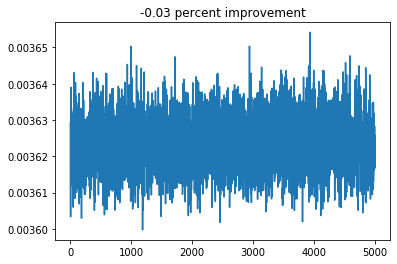

In [66]:
plt.plot(history)
plt.title('%.2f percent improvement' % (((history[-1]-history[0])/history[0])*100))
#plt.savefig('traininghist.png')

In [20]:
((history[-1]-history[0])/history[0])*100

0.27258527604145766

### Evaluate TeFF Sensitivity

Text(0.5, 1.0, 'H-Beta Line')

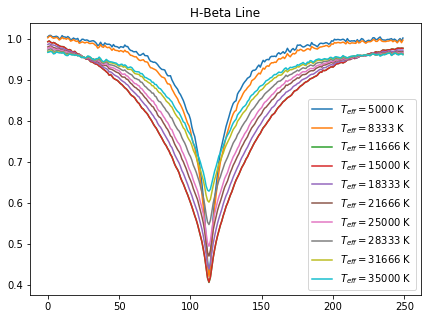

In [67]:
plt.figure(figsize=(7,5))
ts = np.linspace(5000,35000,10)
ls = np.linspace(8,8,10)
samples = sc.transform(np.stack((ts,ls)).transpose())
gens = model.predict(samples)
tscores = (ts - np.min(ts))/(np.max(ts) - np.min(ts))
for i in range(len(gens)):
    plt.plot(gens[i][750:1000],label='$T_{eff} = %i$ K'%ts[i])
plt.legend(fontsize=10)
plt.title('H-Beta Line')

### Evaluate logg Sensitivity

Text(0.5, 0.98, 'H-Delta')

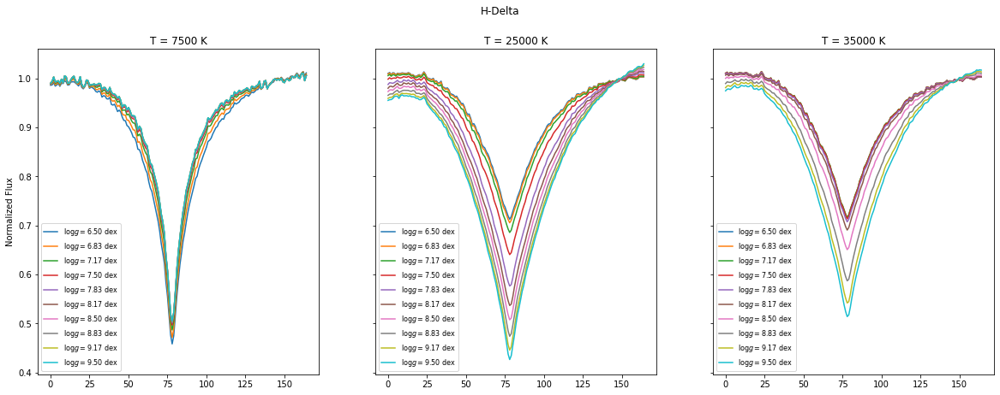

In [68]:
f,axs = plt.subplots(1,3,sharey = True,figsize=(20,7))

ts = np.linspace(7500,7500,10)
ls = np.linspace(6.5,9.5,10)
samples = sc.transform(np.stack((ts,ls)).transpose())
gens = model.predict(samples)
for i in range(len(gens)):
    axs[0].plot(gens[i][25:190],label='$\log{g} = %.2f$ dex'%ls[i])

axs[0].legend(fontsize=8)
axs[0].set_title('T = 7500 K')
axs[0].set_ylabel('Normalized Flux')

ts = np.linspace(25000,25000,10)
ls = np.linspace(6.5,9.5,10)
samples = sc.transform(np.stack((ts,ls)).transpose())
gens = model.predict(samples)
for i in range(len(gens)):
    axs[1].plot(gens[i][25:190],label='$\log{g} = %.2f$ dex'%ls[i])

axs[1].legend(fontsize=8)
axs[1].set_title('T = 25000 K')

ts = np.linspace(35000,35000,10)
ls = np.linspace(6.5,9.5,10)
samples = sc.transform(np.stack((ts,ls)).transpose())
gens = model.predict(samples)
for i in range(len(gens)):
    axs[2].plot(gens[i][25:190],label='$\log{g} = %.2f$ dex'%ls[i])

axs[2].legend(fontsize=8)
axs[2].set_title('T = 35000 K')

# plt.subplot(132)
# ts = np.linspace(25000,25000,10)
# ls = np.linspace(6.5,9.5,10)
# samples = sc.transform(np.stack((ts,ls)).transpose())
# gens = model.predict(samples)
# for i in range(len(gens)):
#     plt.plot(gens[i][25:190],label='$\log{g} = %.2f$ dex'%ls[i])

# plt.legend(fontsize=8)
# plt.title('T = 25000 K')

# plt.subplot(133)
# ts = np.linspace(35000,35000,10)
# ls = np.linspace(6.5,9.5,10)
# samples = sc.transform(np.stack((ts,ls)).transpose())
# gens = model.predict(samples)
# for i in range(len(gens)):
#     plt.plot(gens[i][25:190],label='$\log{g} = %.2f$ dex'%ls[i])

# plt.legend(fontsize=8)
# plt.title('T = 35000 K')

plt.suptitle('H-Delta')

### Evaluate Residuals of Random Control Spectra

Text(0.5, 1.0, 'Sample of Model Residuals')

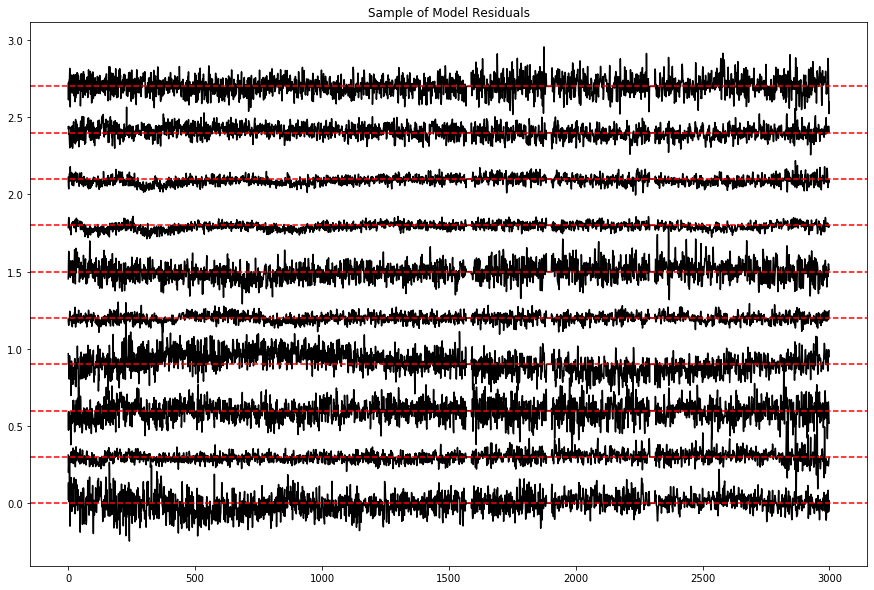

In [69]:
resids = y_test - model.predict(X_test)
plt.figure(figsize=(15,10))
ct=0
for i in np.random.randint(0,len(resids),10):
    plt.plot(resids[i] + 0.3*ct,'k')
    plt.axhline(0.3*ct,color='r',linestyle='--')
    ct += 1
plt.title('Sample of Model Residuals')

In [31]:
modelscaling = 1
from astropy.convolution import Gaussian1DKernel
from scipy.signal import convolve as scipy_convolve
def spectrum_sampler(wl,teff,logg,trans):
    label = sc.transform(np.asarray(np.stack((teff,logg)).reshape(1,-1)))
    synth = (interpolation.shift(model.predict(label)[0],trans,cval=np.nan)*modelscaling)
    newsynth = scipy_convolve(synth,Gaussian1DKernel(5),'same')
    return synth[lines].astype('float32')

def chisquare(residual):
    return sum(residual**2)

In [32]:
lamgrid = np.arange(4000,7000)
fitter = lmfit.Model(spectrum_sampler)
params = fitter.make_params(teff = 20000.,logg=8.,trans=0.)


params['teff'].set(min=5000,max=80000,brute_step=2500);
params['logg'].set(min=6.5,max=9.5,brute_step=0.5);
params['trans'].set(min=-3,max=3,vary=True,brute_step=1)

bayesparams = fitter.make_params(teff = 20000.,logg=8.,trans=0.)
bayesparams['teff'].set(min=5000,max=80000)
bayesparams['logg'].set(min=6.5,max=9.5)

In [33]:
lam = lamgrid
lines = lines = ((lam > hbeta-200) & (lam < hbeta + 200)) | ((lam > halpha-200) & (lam < halpha + 200))\
        | ((lam > hgamma-320) & (lam < hgamma + 100))













  0%|          | 0/217 [00:00<?, ?it/s]

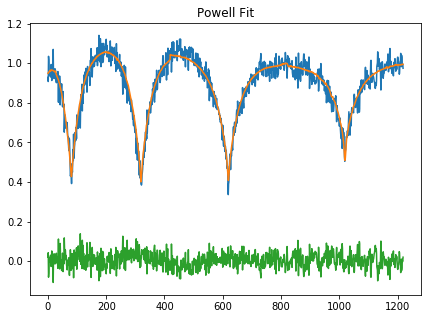

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 92
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.64275721
    reduced chi-square = 0.00134984
    Akaike info crit   = -8058.48070
    Bayesian info crit = -8043.16088
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   17803.8748 +/-        nan (nan%) (init = 20000)
    logg:   8.91452961 +/-        nan (nan%) (init = 8)
    trans: -0.57368805 +/- 0.16271450 (28.36%) (init = 0)

 Starting Bayesian Sampling................
...Done.


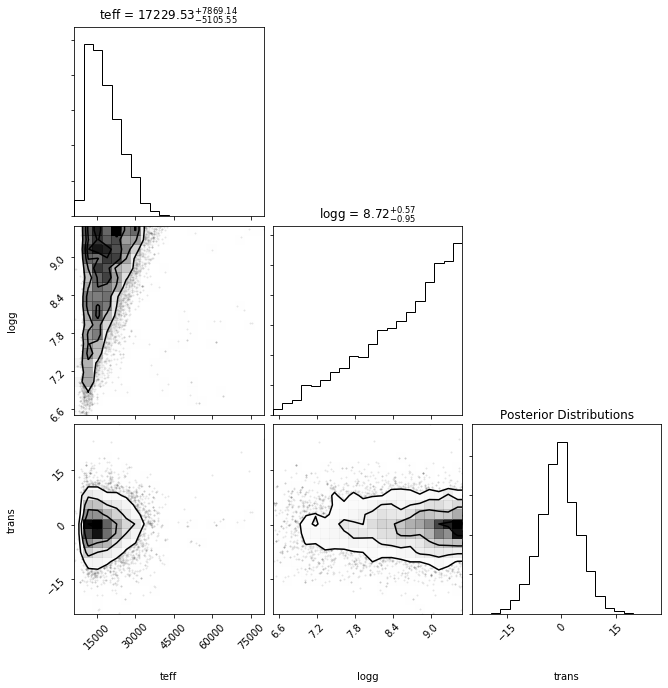

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.64284421
    reduced chi-square = 0.00134991
    Akaike info crit   = -8058.41609
    Bayesian info crit = -8043.09627
[[Variables]]
    teff:   17229.5270 +/- 6509.94441 (37.78%) (init = 17803.87)
    logg:   8.71929022 +/- 0.76469174 (8.77%) (init = 8.91453)
    trans: -0.59326078 +/- 5.24299702 (883.76%) (init = -0.5736881)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.419


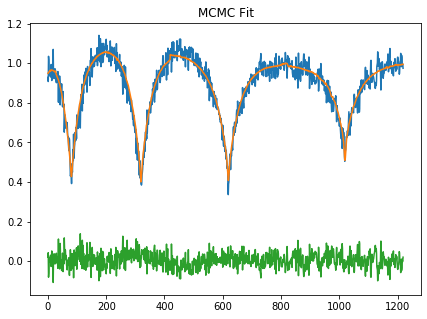













  0%|          | 1/217 [00:38<2:18:12, 38.39s/it]

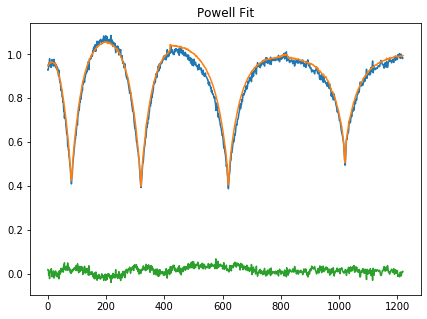

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 148
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.63397076
    reduced chi-square = 5.2093e-04
    Akaike info crit   = -9220.07747
    Bayesian info crit = -9204.75765
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   17757.6416 +/-        nan (nan%) (init = 20000)
    logg:   8.90348729 +/-        nan (nan%) (init = 8)
    trans: -0.24023252 +/- 0.10957416 (45.61%) (init = 0)

 Starting Bayesian Sampling................
...Done.


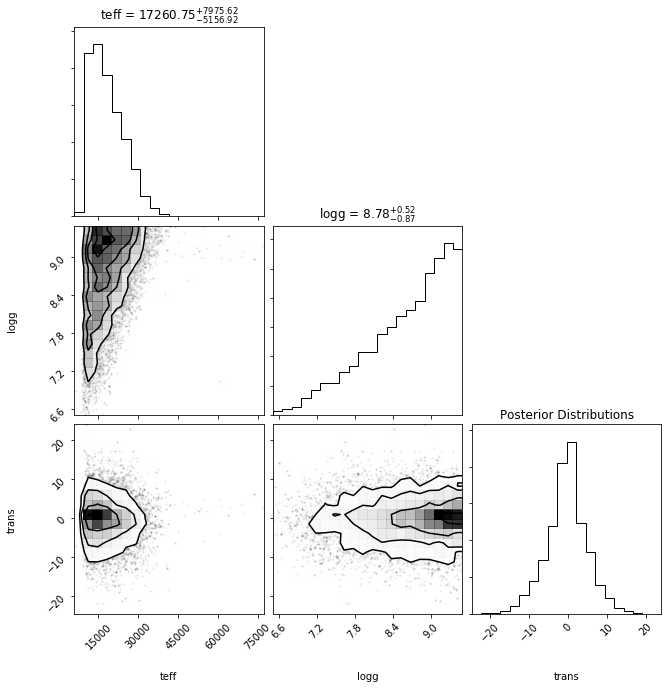

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.63398566
    reduced chi-square = 5.2094e-04
    Akaike info crit   = -9220.04879
    Bayesian info crit = -9204.72897
[[Variables]]
    teff:   17260.7493 +/- 6606.83951 (38.28%) (init = 17757.64)
    logg:   8.77758072 +/- 0.69710680 (7.94%) (init = 8.903487)
    trans: -0.21400672 +/- 4.89051240 (2285.21%) (init = -0.2402325)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.409


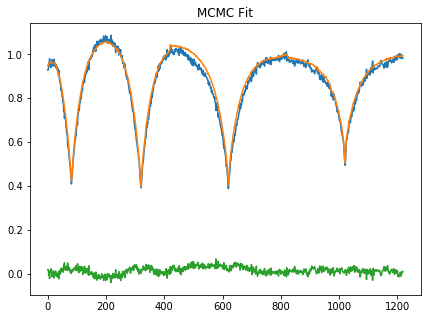













  1%|          | 2/217 [01:17<2:18:05, 38.54s/it]

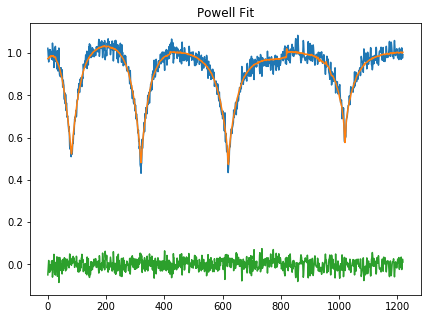

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 160
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.77578109
    reduced chi-square = 6.3745e-04
    Akaike info crit   = -8973.79906
    Bayesian info crit = -8958.47924
[[Variables]]
    teff:   22019.1760 +/- 8177.61376 (37.14%) (init = 20000)
    logg:   8.00046712 +/- 0.89468708 (11.18%) (init = 8)
    trans: -0.16868183 +/- 0.11808110 (70.00%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


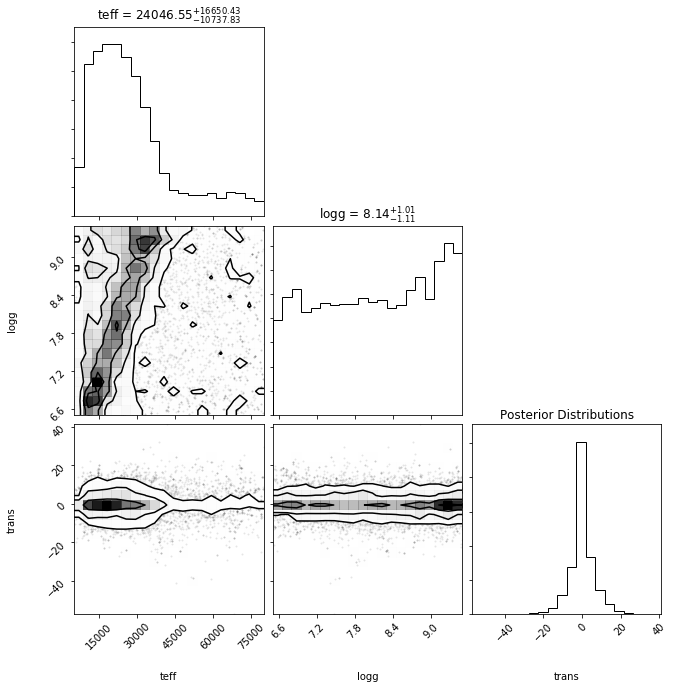

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.78598429
    reduced chi-square = 6.4584e-04
    Akaike info crit   = -8957.85803
    Bayesian info crit = -8942.53821
[[Variables]]
    teff:   24046.5543 +/- 13805.6004 (57.41%) (init = 22019.18)
    logg:   8.13505349 +/- 1.06289835 (13.07%) (init = 8.000467)
    trans: -0.15635216 +/- 4.80460338 (3072.94%) (init = -0.1686818)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.167


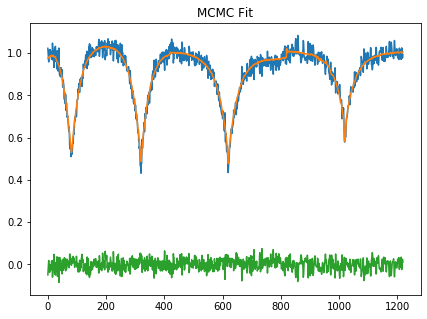













  1%|▏         | 3/217 [01:52<2:13:47, 37.51s/it]

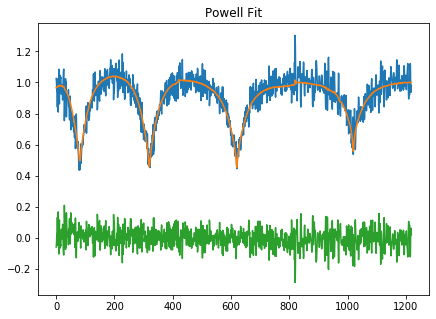

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 151
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.37169235
    reduced chi-square = 0.00359219
    Akaike info crit   = -6864.37624
    Bayesian info crit = -6849.05643
[[Variables]]
    teff:   19638.9529 +/- 10794.2904 (54.96%) (init = 20000)
    logg:   8.00071976 +/- 1.29228898 (16.15%) (init = 8)
    trans: -0.16422251 +/- 0.28700008 (174.76%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


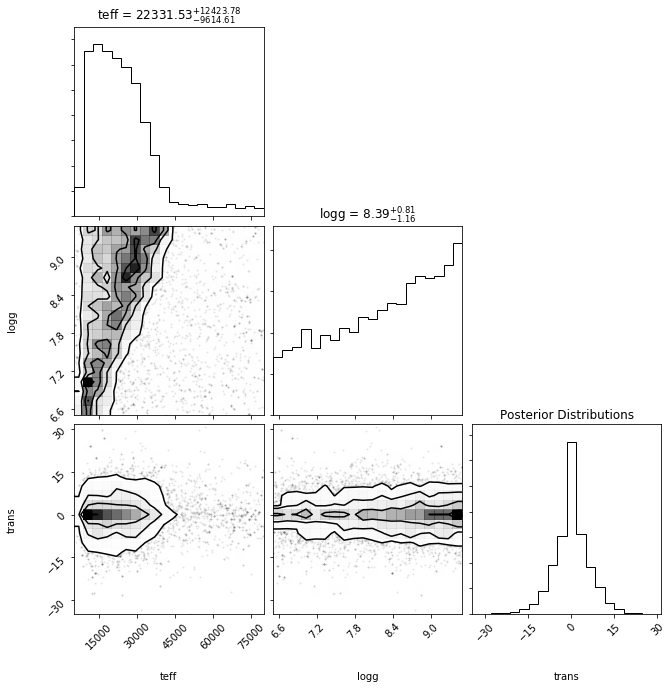

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.38296666
    reduced chi-square = 0.00360145
    Akaike info crit   = -6861.23399
    Bayesian info crit = -6845.91417
[[Variables]]
    teff:   22331.5256 +/- 11084.5214 (49.64%) (init = 19638.95)
    logg:   8.38529869 +/- 0.98853359 (11.79%) (init = 8.00072)
    trans: -0.09121451 +/- 5.51839544 (6049.91%) (init = -0.1642225)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.192


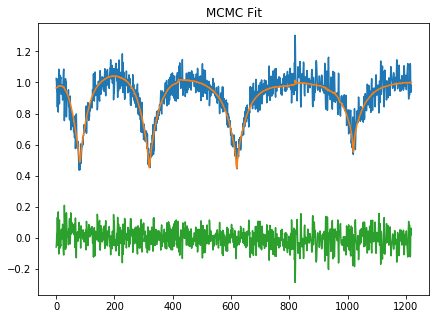













  2%|▏         | 4/217 [02:28<2:11:57, 37.17s/it]

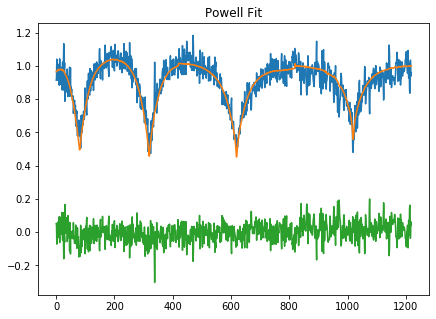

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 93
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.95980528
    reduced chi-square = 0.00325374
    Akaike info crit   = -6985.10177
    Bayesian info crit = -6969.78195
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   19506.4116 +/-        nan (nan%) (init = 20000)
    logg:   7.99681745 +/-        nan (nan%) (init = 8)
    trans: -0.69437206 +/- 0.29771219 (42.88%) (init = 0)

 Starting Bayesian Sampling................
...Done.


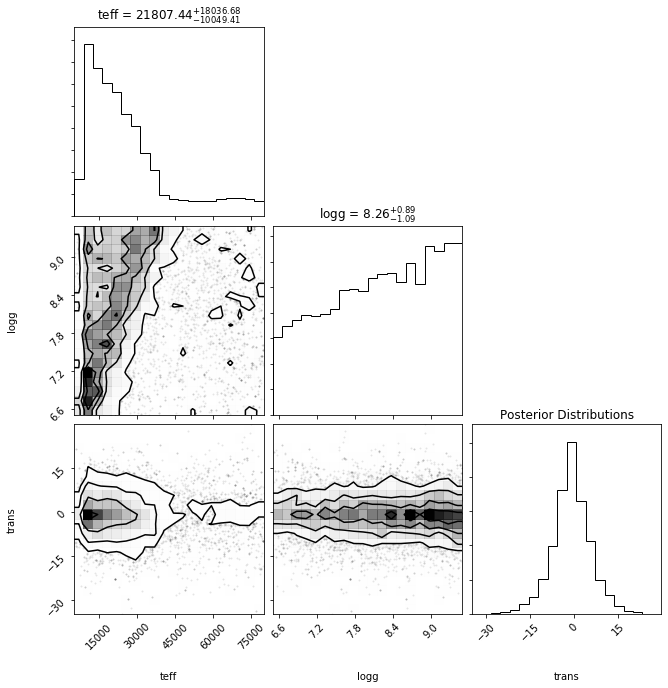

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.96280713
    reduced chi-square = 0.00325621
    Akaike info crit   = -6984.17726
    Bayesian info crit = -6968.85744
[[Variables]]
    teff:   21807.4446 +/- 14156.2577 (64.91%) (init = 19506.41)
    logg:   8.25532684 +/- 0.99171716 (12.01%) (init = 7.996817)
    trans: -0.84754798 +/- 5.90092143 (696.23%) (init = -0.6943721)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.164


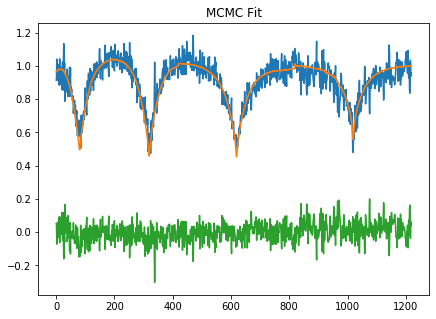













  2%|▏         | 5/217 [03:04<2:10:13, 36.85s/it]

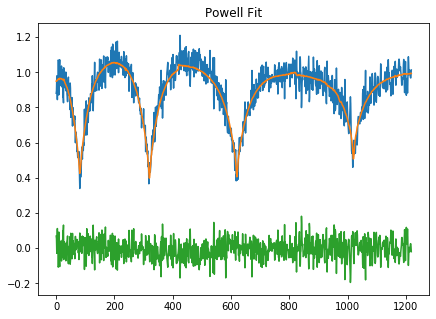

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 134
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.55897630
    reduced chi-square = 0.00292438
    Akaike info crit   = -7115.30249
    Bayesian info crit = -7099.98267
[[Variables]]
    teff:   11365.9366 +/- 1071.17348 (9.42%) (init = 20000)
    logg:   7.92472759 +/- 1.65858957 (20.93%) (init = 8)
    trans:  0.18020388 +/- 0.25090014 (139.23%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) = -0.740

 Starting Bayesian Sampling................
...Done.


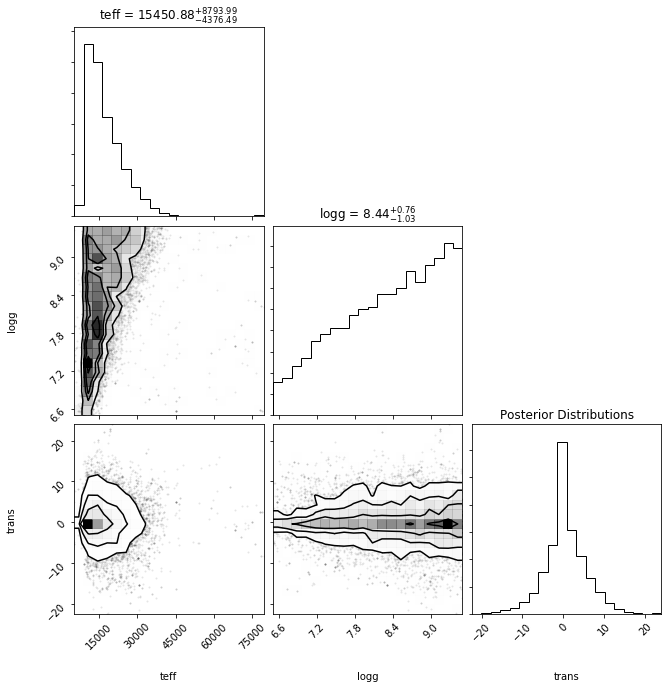

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.56056469
    reduced chi-square = 0.00292569
    Akaike info crit   = -7114.75812
    Bayesian info crit = -7099.43830
[[Variables]]
    teff:   15450.8793 +/- 6617.25916 (42.83%) (init = 11365.94)
    logg:   8.44190259 +/- 0.89751028 (10.63%) (init = 7.924728)
    trans:  0.21274876 +/- 4.35623461 (2047.60%) (init = 0.1802039)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.384


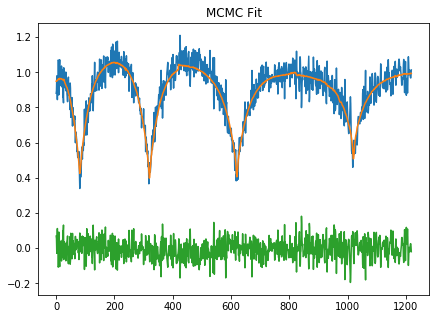













  3%|▎         | 6/217 [03:42<2:10:42, 37.17s/it]

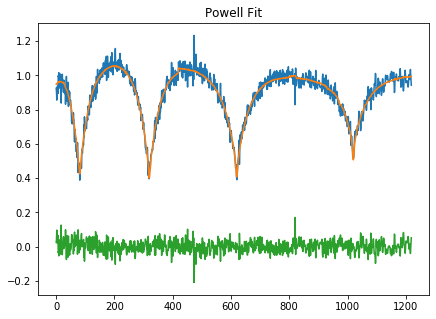

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 94
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.35611204
    reduced chi-square = 0.00111431
    Akaike info crit   = -8292.42087
    Bayesian info crit = -8277.10106
[[Variables]]
    teff:   17129.6311 +/- 32000.3455 (186.81%) (init = 20000)
    logg:   8.79300832 +/- 4.10102381 (46.64%) (init = 8)
    trans: -0.26291875 +/- 0.14756793 (56.13%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.907

 Starting Bayesian Sampling................
...Done.


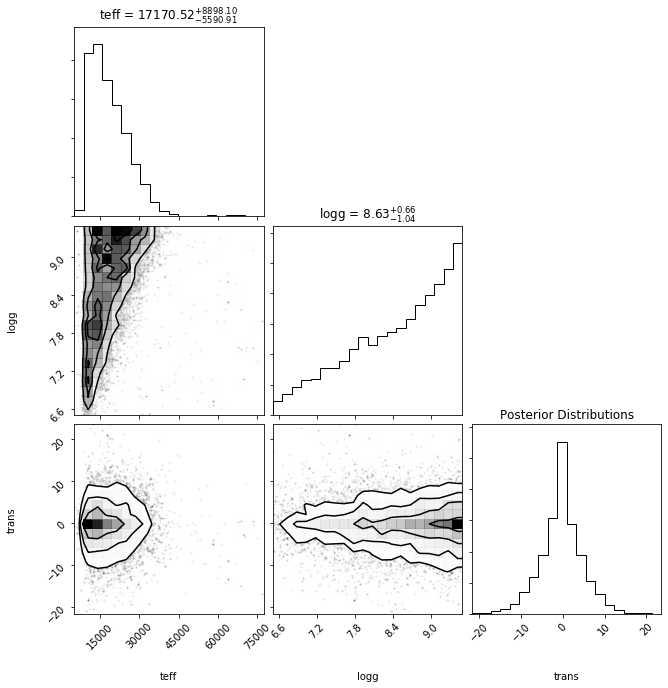

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.35621290
    reduced chi-square = 0.00111439
    Akaike info crit   = -8292.33014
    Bayesian info crit = -8277.01032
[[Variables]]
    teff:   17170.5154 +/- 7277.72732 (42.39%) (init = 17129.63)
    logg:   8.62641806 +/- 0.84969277 (9.85%) (init = 8.793008)
    trans: -0.28384070 +/- 4.54107313 (1599.87%) (init = -0.2629187)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.402


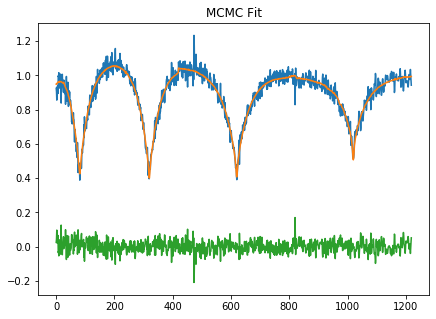













  3%|▎         | 7/217 [04:21<2:11:17, 37.51s/it]

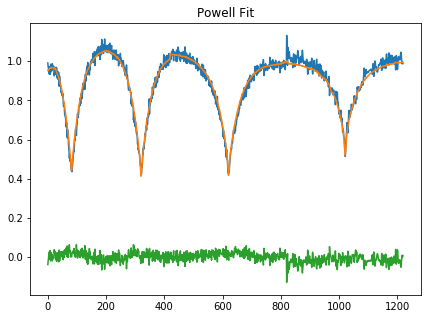

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 121
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.68814868
    reduced chi-square = 5.6545e-04
    Akaike info crit   = -9120.03493
    Bayesian info crit = -9104.71511
[[Variables]]
    teff:   16482.6667 +/- 5329.94556 (32.34%) (init = 20000)
    logg:   8.00455918 +/- 0.77098316 (9.63%) (init = 8)
    trans:  0.41294746 +/- 0.11519106 (27.89%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


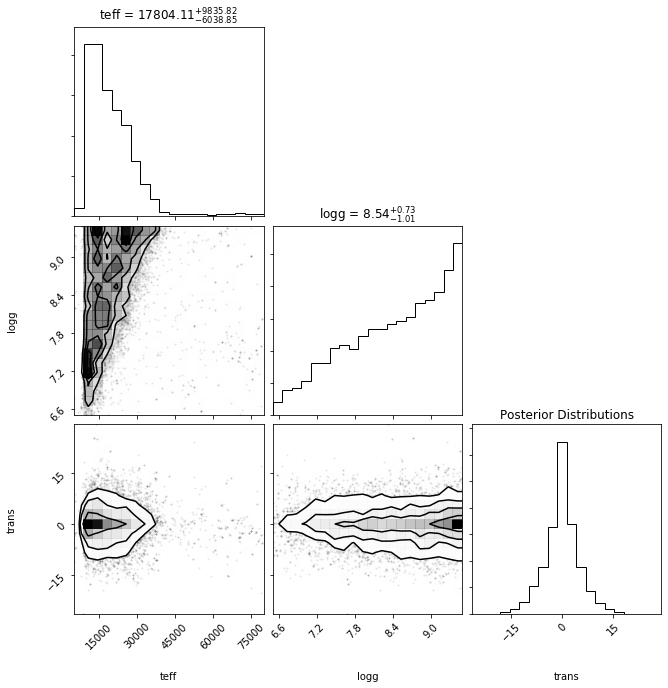

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.73073078
    reduced chi-square = 6.0044e-04
    Akaike info crit   = -9046.78590
    Bayesian info crit = -9031.46608
[[Variables]]
    teff:   17804.1089 +/- 7970.57745 (44.77%) (init = 16482.67)
    logg:   8.53636707 +/- 0.87333280 (10.23%) (init = 8.004559)
    trans:  0.25240109 +/- 4.49063370 (1779.17%) (init = 0.4129475)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.287


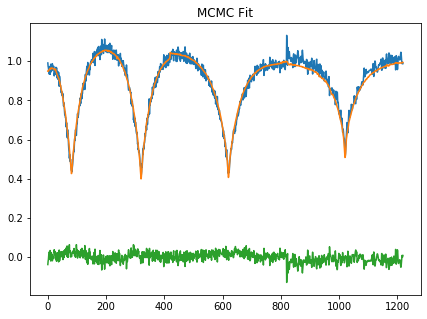













  4%|▎         | 8/217 [04:59<2:11:13, 37.67s/it]

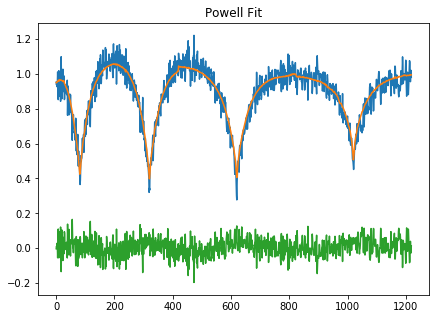

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 109
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.97751914
    reduced chi-square = 0.00244661
    Akaike info crit   = -7332.92914
    Bayesian info crit = -7317.60932
[[Variables]]
    teff:   17765.3186 +/- 11878.0025 (66.86%) (init = 20000)
    logg:   8.91618084 +/- 1.57012292 (17.61%) (init = 8)
    trans:  0.01501198 +/- 0.19835420 (1321.31%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.403

 Starting Bayesian Sampling................
...Done.


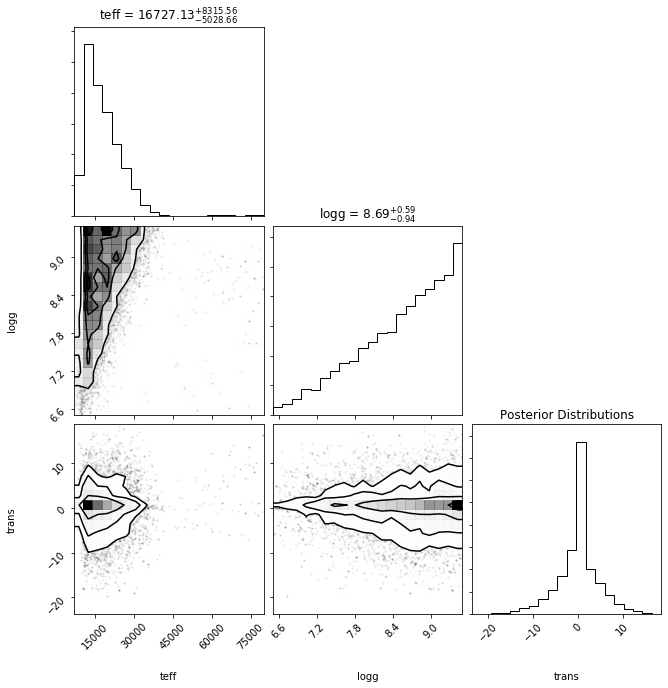

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.97755873
    reduced chi-square = 0.00244664
    Akaike info crit   = -7332.91292
    Bayesian info crit = -7317.59310
[[Variables]]
    teff:   16727.1342 +/- 6690.79996 (40.00%) (init = 17765.32)
    logg:   8.69404954 +/- 0.76853897 (8.84%) (init = 8.916181)
    trans:  0.01337410 +/- 3.78616567 (28309.69%) (init = 0.01501198)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.360


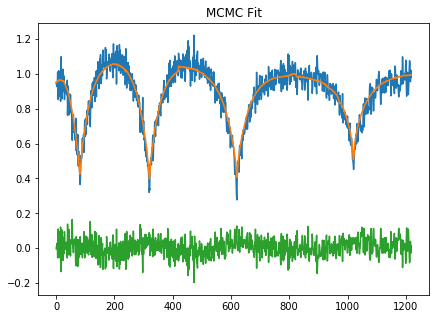













  4%|▍         | 9/217 [05:37<2:11:17, 37.87s/it]

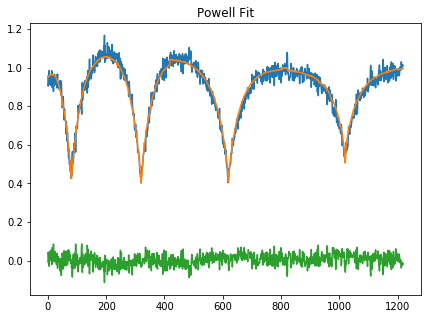

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 98
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.06257880
    reduced chi-square = 8.7311e-04
    Akaike info crit   = -8590.00698
    Bayesian info crit = -8574.68716
[[Variables]]
    teff:   17490.6246 +/- 13534.7922 (77.38%) (init = 20000)
    logg:   8.87738217 +/- 1.84711690 (20.81%) (init = 8)
    trans: -0.37863371 +/- 0.14683328 (38.78%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.819

 Starting Bayesian Sampling................
...Done.


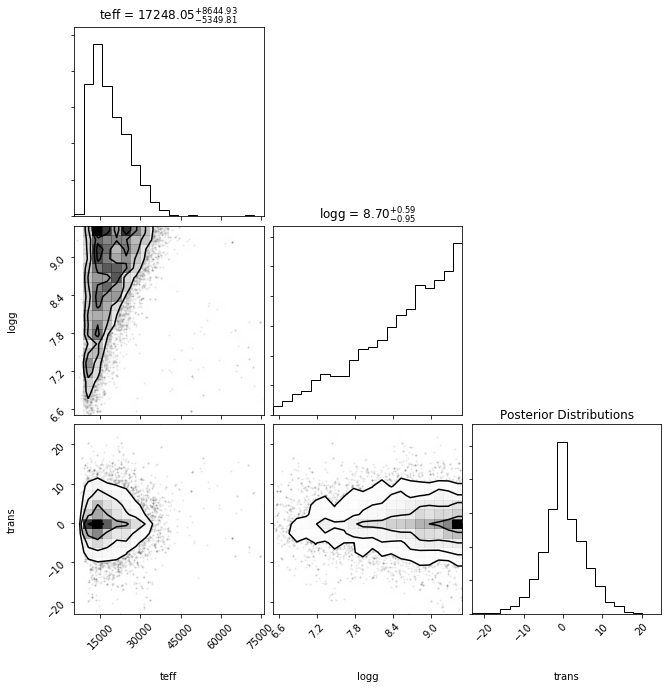

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.06421955
    reduced chi-square = 8.7446e-04
    Akaike info crit   = -8588.12459
    Bayesian info crit = -8572.80477
[[Variables]]
    teff:   17248.0507 +/- 7036.40314 (40.80%) (init = 17490.62)
    logg:   8.69796369 +/- 0.77074644 (8.86%) (init = 8.877382)
    trans: -0.16013358 +/- 5.00635886 (3126.36%) (init = -0.3786337)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.390


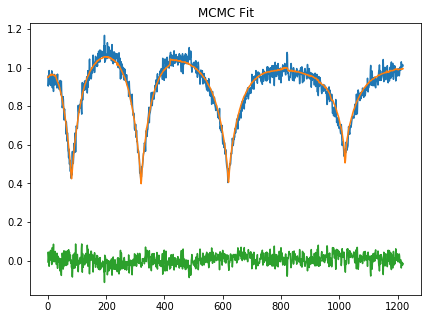













  5%|▍         | 10/217 [06:15<2:11:01, 37.98s/it]

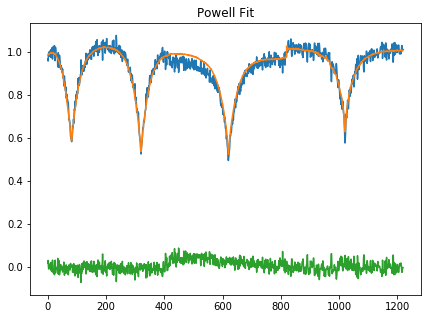

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 124
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.79921263
    reduced chi-square = 6.5671e-04
    Akaike info crit   = -8937.49595
    Bayesian info crit = -8922.17613
[[Variables]]
    teff:   27063.1464 +/- 14964.3282 (55.29%) (init = 20000)
    logg:   7.99800178 +/- 1.58505850 (19.82%) (init = 8)
    trans:  0.22854343 +/- 0.13726461 (60.06%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


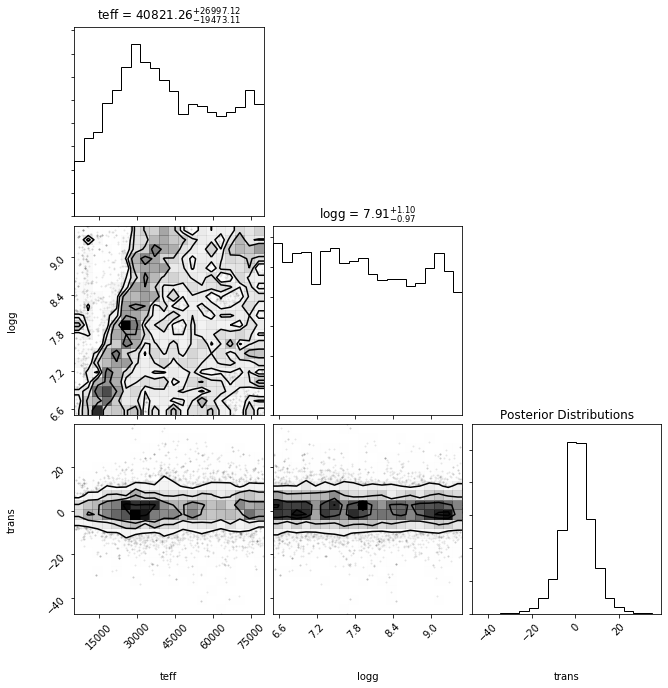

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.78965899
    reduced chi-square = 0.00229224
    Akaike info crit   = -7412.43786
    Bayesian info crit = -7397.11805
[[Variables]]
    teff:   40821.2640 +/- 23375.4984 (57.26%) (init = 27063.15)
    logg:   7.90578740 +/- 1.03972505 (13.15%) (init = 7.998002)
    trans:  0.72881666 +/- 6.59589128 (905.01%) (init = 0.2285434)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.177


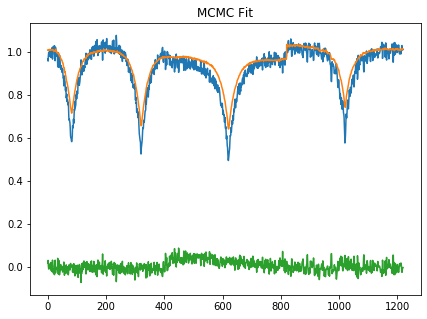













  5%|▌         | 11/217 [06:50<2:07:12, 37.05s/it]

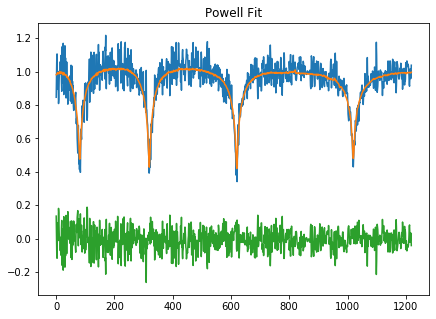

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 166
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.55649815
    reduced chi-square = 0.00374404
    Akaike info crit   = -6813.86315
    Bayesian info crit = -6798.54333
[[Variables]]
    teff:   8554.17651 +/- 1792.48731 (20.95%) (init = 20000)
    logg:   8.02346796 +/- 2.17757000 (27.14%) (init = 8)
    trans: -0.28650911 +/- 0.23180647 (80.91%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.999

 Starting Bayesian Sampling................
...Done.


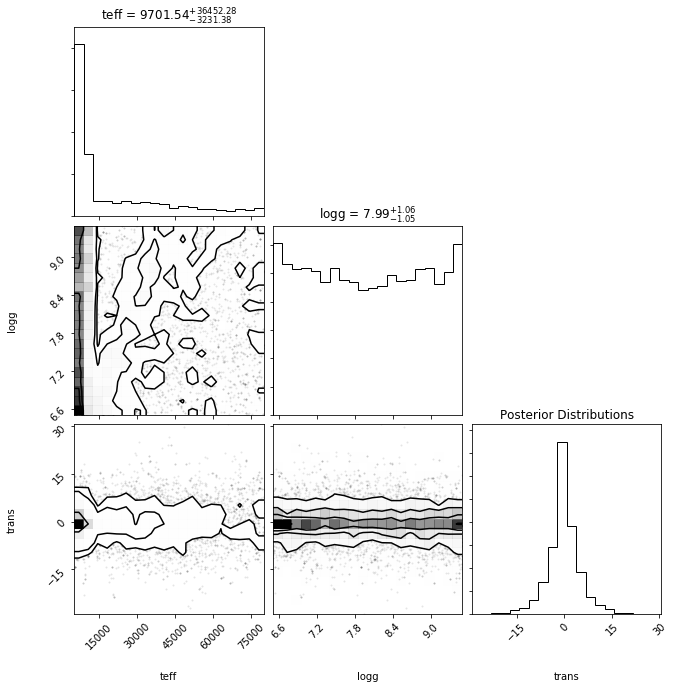

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 6.94452114
    reduced chi-square = 0.00570626
    Akaike info crit   = -6299.75680
    Bayesian info crit = -6284.43698
[[Variables]]
    teff:   9701.54026 +/- 19928.3675 (205.41%) (init = 8554.177)
    logg:   7.98605656 +/- 1.05772929 (13.24%) (init = 8.023468)
    trans: -0.25513748 +/- 4.11501381 (1612.86%) (init = -0.2865091)


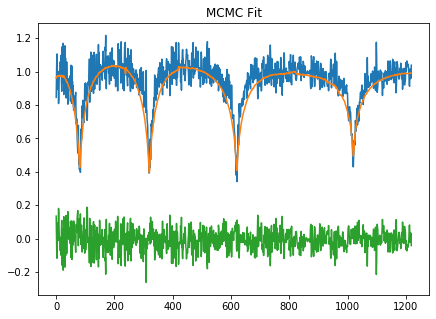













  6%|▌         | 12/217 [07:24<2:03:07, 36.04s/it]

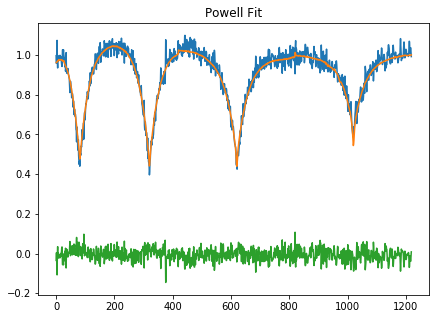

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 122
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.10075687
    reduced chi-square = 9.0448e-04
    Akaike info crit   = -8546.94193
    Bayesian info crit = -8531.62211
[[Variables]]
    teff:   18402.4133 +/- 5580.18583 (30.32%) (init = 20000)
    logg:   7.99995019 +/- 0.72451041 (9.06%) (init = 8)
    trans:  0.08295332 +/- 0.14369242 (173.22%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


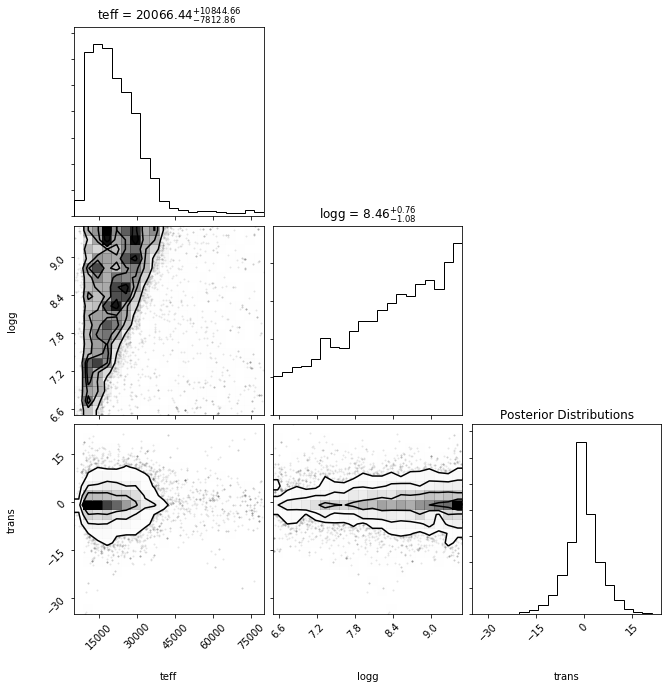

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.26517389
    reduced chi-square = 0.00103958
    Akaike info crit   = -8377.10381
    Bayesian info crit = -8361.78399
[[Variables]]
    teff:   20066.4422 +/- 9351.48202 (46.60%) (init = 18402.41)
    logg:   8.46281076 +/- 0.92446654 (10.92%) (init = 7.99995)
    trans:  0.00975812 +/- 4.63469591 (47495.78%) (init = 0.08295332)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.207


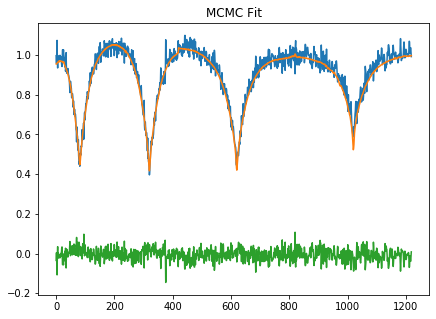













  6%|▌         | 13/217 [08:01<2:03:51, 36.43s/it]

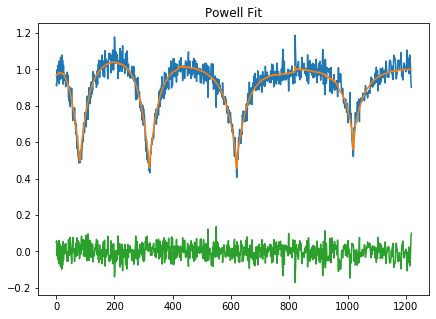

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 106
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.91183948
    reduced chi-square = 0.00157094
    Akaike info crit   = -7873.41914
    Bayesian info crit = -7858.09933
[[Variables]]
    teff:   19738.9290 +/- 7309.42499 (37.03%) (init = 20000)
    logg:   8.00052282 +/- 0.86969013 (10.87%) (init = 8)
    trans: -0.27940884 +/- 0.17579671 (62.92%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


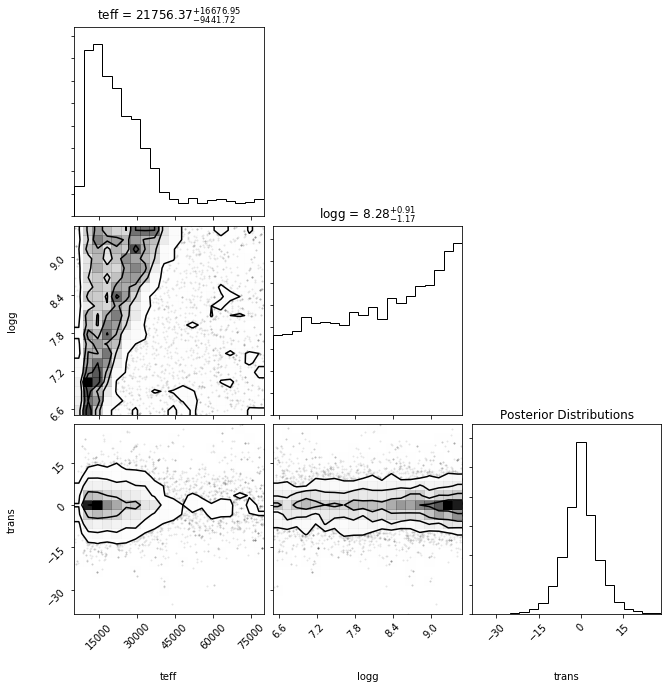

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.91716448
    reduced chi-square = 0.00157532
    Akaike info crit   = -7870.02583
    Bayesian info crit = -7854.70601
[[Variables]]
    teff:   21756.3680 +/- 13115.2193 (60.28%) (init = 19738.93)
    logg:   8.28142951 +/- 1.03850665 (12.54%) (init = 8.000523)
    trans: -0.16171907 +/- 5.58647097 (3454.43%) (init = -0.2794088)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.118


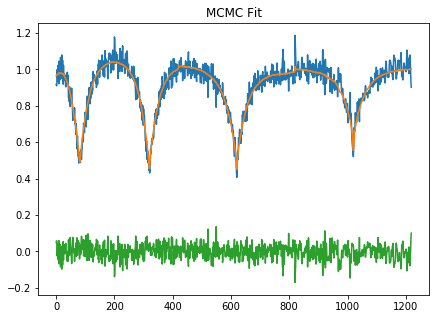













  6%|▋         | 14/217 [08:37<2:02:40, 36.26s/it]

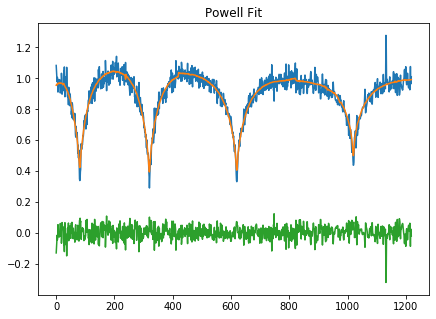

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 106
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.00027884
    reduced chi-square = 0.00164361
    Akaike info crit   = -7818.24984
    Bayesian info crit = -7802.93003
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   10212.3112 +/-        nan (nan%) (init = 20000)
    logg:   8.03115126 +/-        nan (nan%) (init = 8)
    trans: -0.19825815 +/- 0.16226875 (81.85%) (init = 0)

 Starting Bayesian Sampling................
...Done.


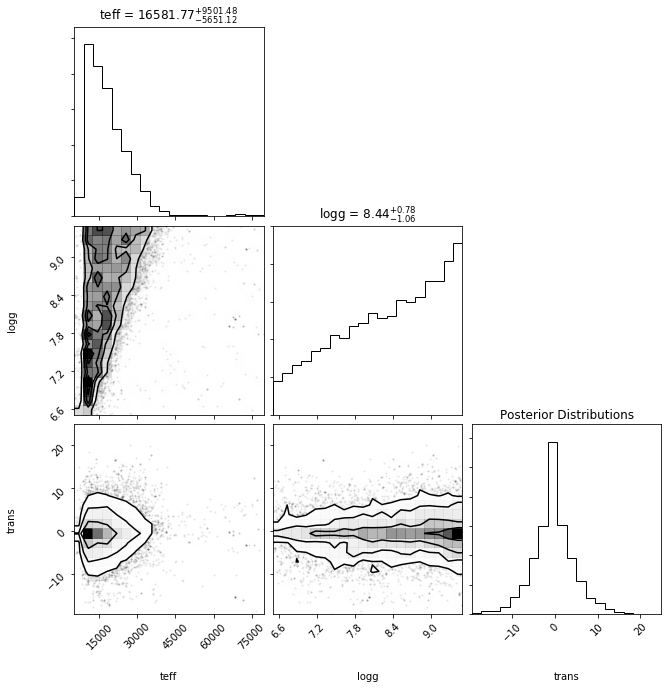

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.23540233
    reduced chi-square = 0.00183681
    Akaike info crit   = -7682.66559
    Bayesian info crit = -7667.34577
[[Variables]]
    teff:   16581.7678 +/- 7603.19038 (45.85%) (init = 10212.31)
    logg:   8.44471126 +/- 0.92305437 (10.93%) (init = 8.031151)
    trans: -0.28975776 +/- 4.19502850 (1447.77%) (init = -0.1982582)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.381


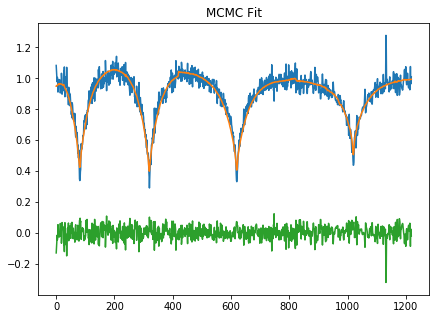













  7%|▋         | 15/217 [09:15<2:03:44, 36.75s/it]

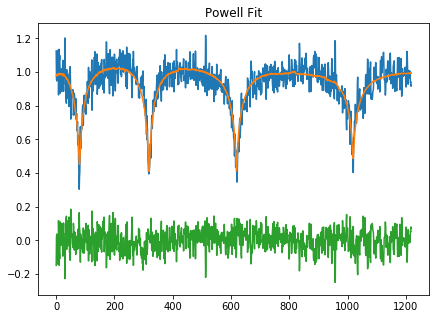

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 119
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.98490447
    reduced chi-square = 0.00409606
    Akaike info crit   = -6704.23412
    Bayesian info crit = -6688.91430
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   9004.30167 +/-        nan (nan%) (init = 20000)
    logg:   7.98199962 +/-        nan (nan%) (init = 8)
    trans: -1.03791413 +/- 0.24388099 (23.50%) (init = 0)

 Starting Bayesian Sampling................
...Done.


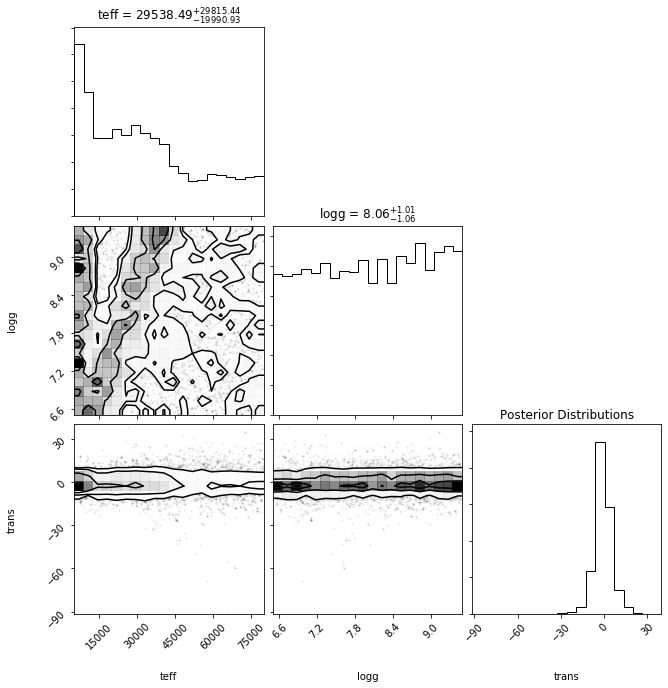

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 6.45591803
    reduced chi-square = 0.00530478
    Akaike info crit   = -6388.76286
    Bayesian info crit = -6373.44304
[[Variables]]
    teff:   29538.4895 +/- 24982.5494 (84.58%) (init = 9004.302)
    logg:   8.05808318 +/- 1.04203181 (12.93%) (init = 7.982)
    trans: -0.85961427 +/- 5.06307256 (588.99%) (init = -1.037914)


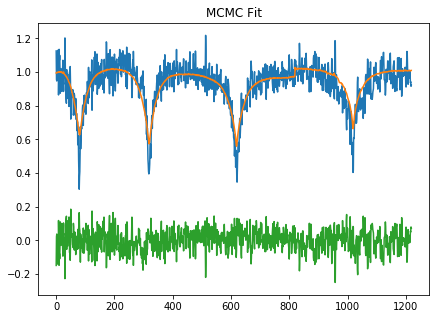













  7%|▋         | 16/217 [09:49<2:00:28, 35.96s/it]

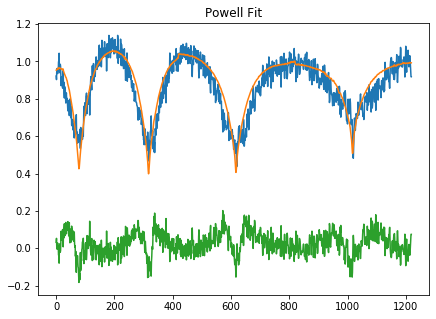

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 96
    # data points      = 1220
    # variables        = 3
    chi-square         = 5.05170195
    reduced chi-square = 0.00415095
    Akaike info crit   = -6687.99474
    Bayesian info crit = -6672.67492
[[Variables]]
    teff:   17442.5547 +/- 22295.5463 (127.82%) (init = 20000)
    logg:   8.83119109 +/- 2.85424773 (32.32%) (init = 8)
    trans: -2.73633370 +/- 0.40054328 (14.64%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.919

 Starting Bayesian Sampling................
...Done.


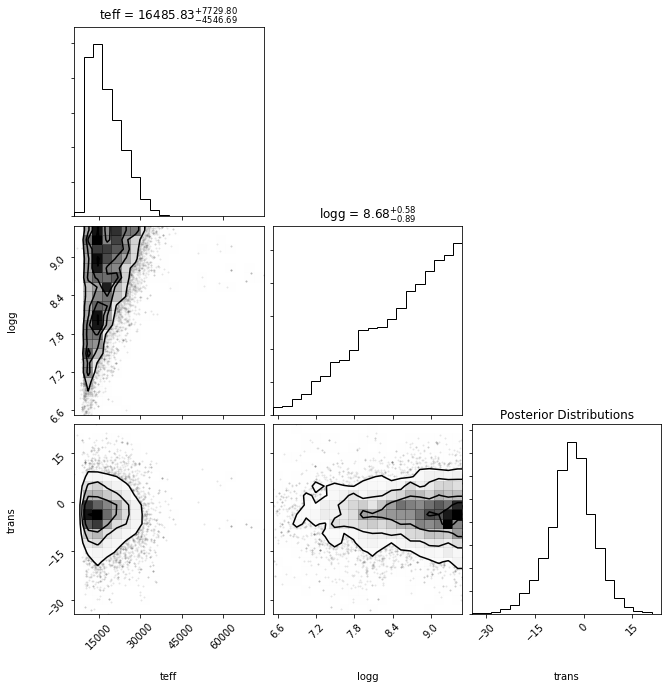

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 5.06902849
    reduced chi-square = 0.00416518
    Akaike info crit   = -6683.81749
    Bayesian info crit = -6668.49767
[[Variables]]
    teff:   16485.8317 +/- 6170.08640 (37.43%) (init = 17442.55)
    logg:   8.68004813 +/- 0.74182899 (8.55%) (init = 8.831191)
    trans: -3.54735506 +/- 6.70456246 (189.00%) (init = -2.736334)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.433


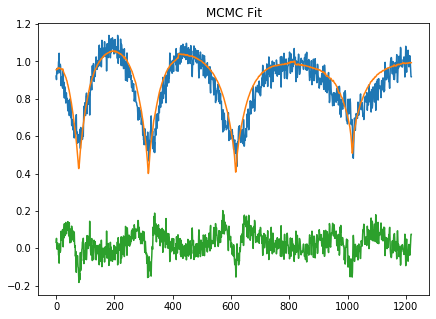













  8%|▊         | 17/217 [10:28<2:03:04, 36.92s/it]

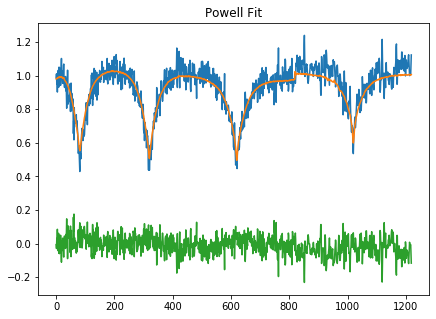

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 127
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.82485752
    reduced chi-square = 0.00314286
    Akaike info crit   = -7027.40360
    Bayesian info crit = -7012.08379
[[Variables]]
    teff:   25025.9752 +/- 11563.6649 (46.21%) (init = 20000)
    logg:   7.99967019 +/- 1.22850427 (15.36%) (init = 8)
    trans: -0.16691240 +/- 0.24803034 (148.60%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


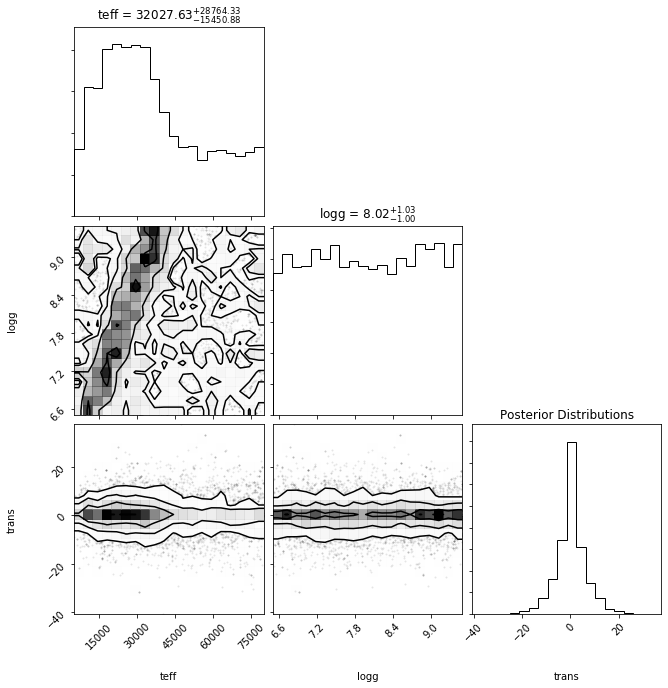

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 5.78042023
    reduced chi-square = 0.00474973
    Akaike info crit   = -6523.59830
    Bayesian info crit = -6508.27848
[[Variables]]
    teff:   32027.6321 +/- 22195.5166 (69.30%) (init = 25025.98)
    logg:   8.01564564 +/- 1.01943463 (12.72%) (init = 7.99967)
    trans: -0.07588931 +/- 5.25447423 (6923.87%) (init = -0.1669124)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.115


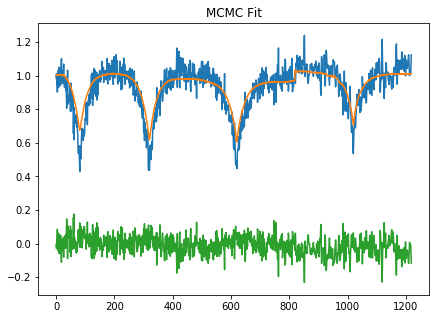













  8%|▊         | 18/217 [11:03<2:00:22, 36.29s/it]

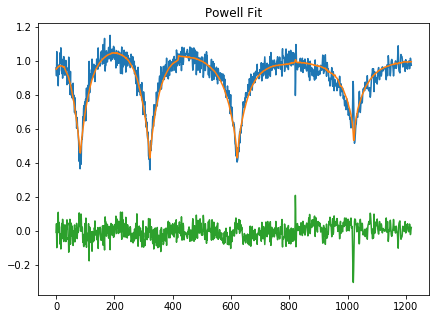

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 108
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.47780171
    reduced chi-square = 0.00203599
    Akaike info crit   = -7557.06594
    Bayesian info crit = -7541.74612
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   17438.4871 +/-        nan (nan%) (init = 20000)
    logg:   7.99528703 +/-        nan (nan%) (init = 8)
    trans:  1.51834382 +/- 0.22544903 (14.85%) (init = 0)

 Starting Bayesian Sampling................
...Done.


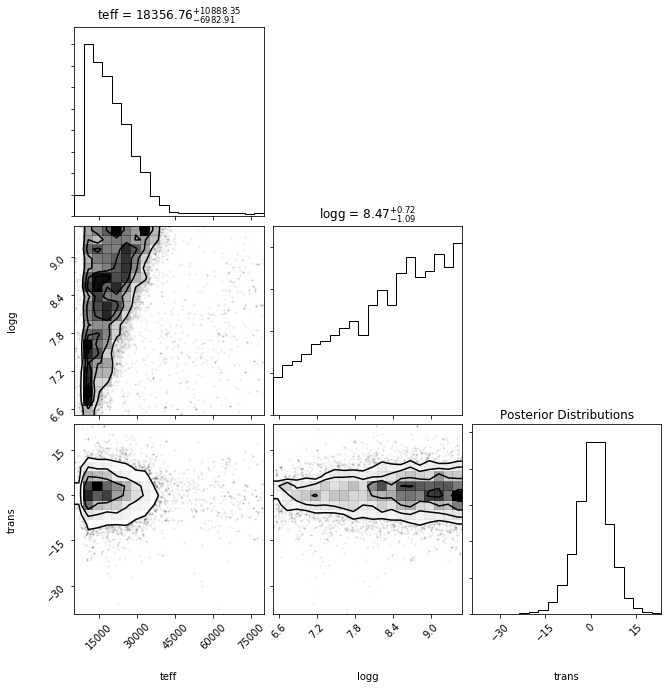

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.65128607
    reduced chi-square = 0.00217854
    Akaike info crit   = -7474.50479
    Bayesian info crit = -7459.18497
[[Variables]]
    teff:   18356.7646 +/- 8973.59100 (48.88%) (init = 17438.49)
    logg:   8.46720876 +/- 0.90754132 (10.72%) (init = 7.995287)
    trans:  0.89822683 +/- 5.22718010 (581.94%) (init = 1.518344)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.251


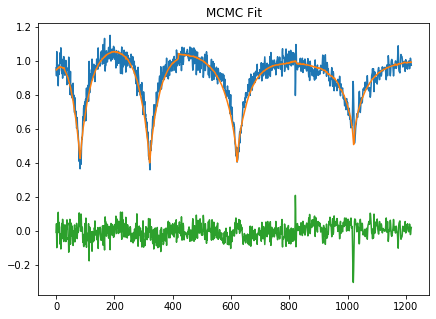













  9%|▉         | 19/217 [11:40<2:00:47, 36.60s/it]

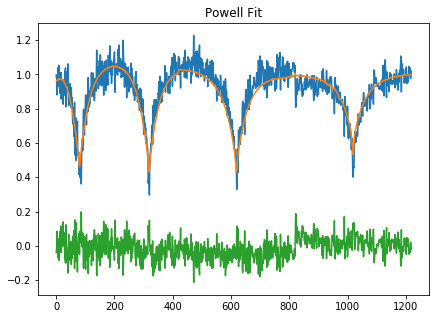

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 103
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.70858889
    reduced chi-square = 0.00386901
    Akaike info crit   = -6773.80580
    Bayesian info crit = -6758.48599
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   17604.3885 +/-        nan (nan%) (init = 20000)
    logg:   7.99079433 +/-        nan (nan%) (init = 8)
    trans: -1.09925504 +/- 0.28563303 (25.98%) (init = 0)

 Starting Bayesian Sampling................
...Done.


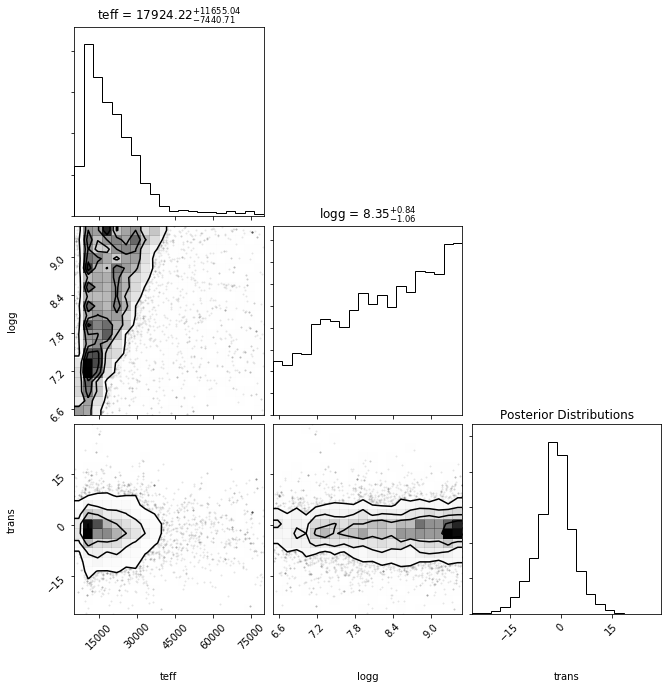

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.88192540
    reduced chi-square = 0.00401144
    Akaike info crit   = -6729.70107
    Bayesian info crit = -6714.38125
[[Variables]]
    teff:   17924.2239 +/- 9613.84254 (53.64%) (init = 17604.39)
    logg:   8.35148177 +/- 0.95330679 (11.41%) (init = 7.990794)
    trans: -1.40930767 +/- 4.95035063 (351.26%) (init = -1.099255)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.251


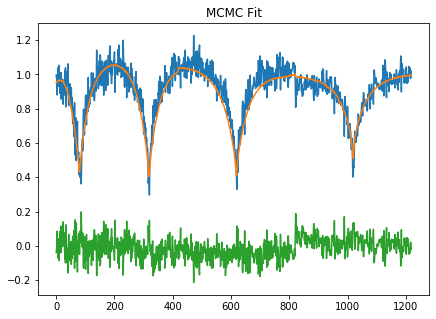













  9%|▉         | 20/217 [12:17<2:00:28, 36.69s/it]

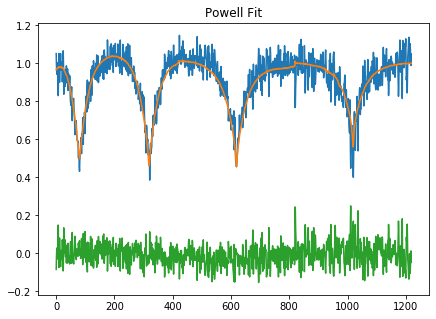

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 138
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.06778214
    reduced chi-square = 0.00334247
    Akaike info crit   = -6952.28002
    Bayesian info crit = -6936.96020
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   19920.4429 +/-        nan (nan%) (init = 20000)
    logg:   7.99739400 +/-        nan (nan%) (init = 8)
    trans: -1.09555139 +/- 0.24904055 (22.73%) (init = 0)

 Starting Bayesian Sampling................
...Done.


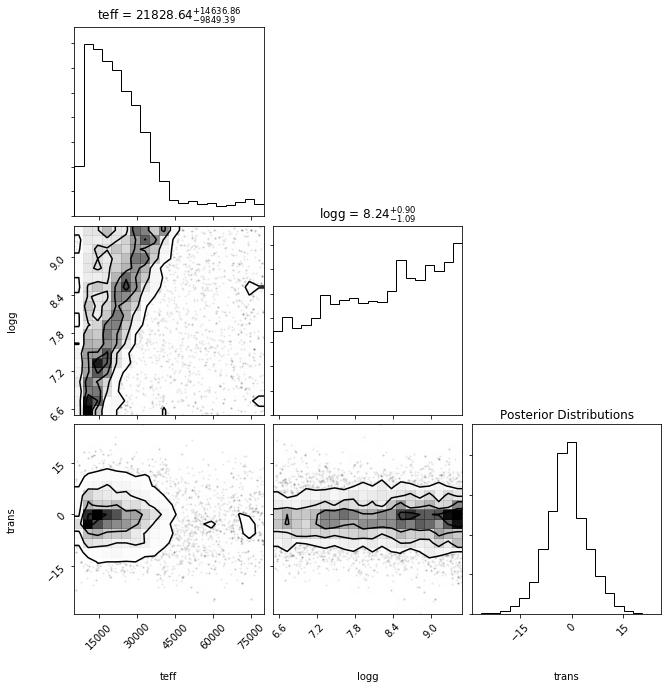

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.07357548
    reduced chi-square = 0.00334723
    Akaike info crit   = -6950.54373
    Bayesian info crit = -6935.22391
[[Variables]]
    teff:   21828.6350 +/- 12314.4064 (56.41%) (init = 19920.44)
    logg:   8.24316833 +/- 1.00045446 (12.14%) (init = 7.997394)
    trans: -1.31341831 +/- 5.68123330 (432.55%) (init = -1.095551)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.229


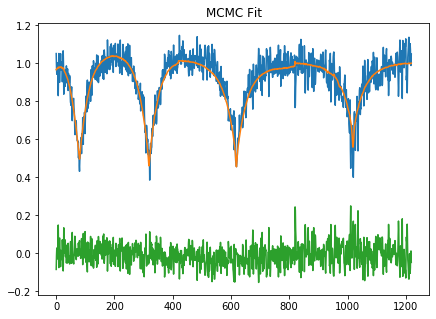













 10%|▉         | 21/217 [12:53<1:59:22, 36.54s/it]

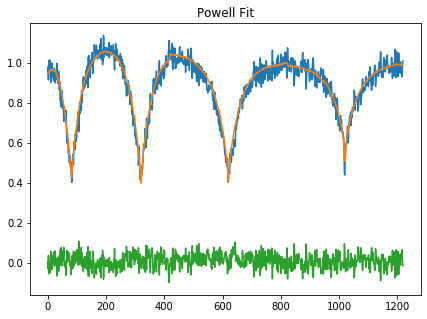

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 113
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.56719180
    reduced chi-square = 0.00128775
    Akaike info crit   = -8115.93135
    Bayesian info crit = -8100.61154
[[Variables]]
    teff:   17299.1670 +/- 15723.5491 (90.89%) (init = 20000)
    logg:   8.81188539 +/- 2.13121060 (24.19%) (init = 8)
    trans: -0.02378482 +/- 0.16762015 (704.74%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.897

 Starting Bayesian Sampling................
...Done.


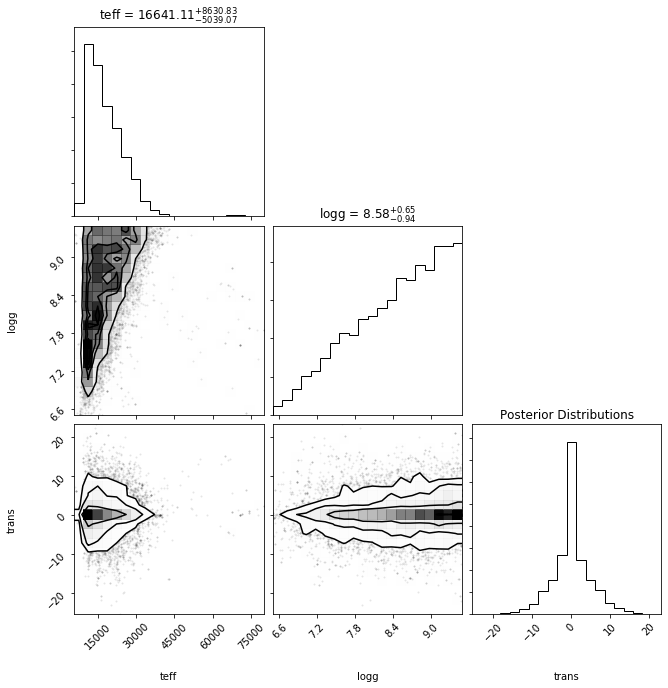

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.56726278
    reduced chi-square = 0.00128781
    Akaike info crit   = -8115.87610
    Bayesian info crit = -8100.55628
[[Variables]]
    teff:   16641.1068 +/- 6867.75878 (41.27%) (init = 17299.17)
    logg:   8.57643016 +/- 0.80054318 (9.33%) (init = 8.811885)
    trans: -0.01603155 +/- 4.11487753 (25667.37%) (init = -0.02378482)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.403


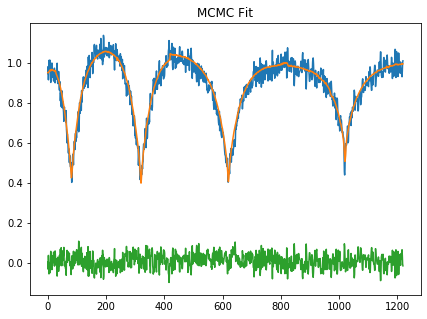













 10%|█         | 22/217 [13:32<2:01:07, 37.27s/it]

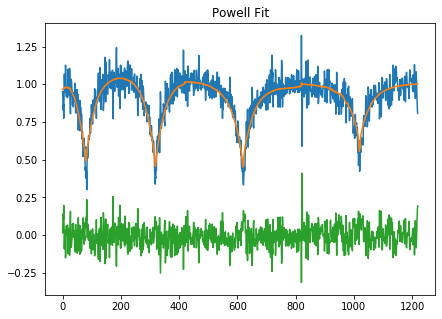

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 85
    # data points      = 1220
    # variables        = 3
    chi-square         = 6.06120138
    reduced chi-square = 0.00498044
    Akaike info crit   = -6465.73169
    Bayesian info crit = -6450.41188
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   19405.6261 +/-        nan (nan%) (init = 20000)
    logg:   7.99549609 +/-        nan (nan%) (init = 8)
    trans: -1.18073942 +/- 0.30977953 (26.24%) (init = 0)

 Starting Bayesian Sampling................
...Done.


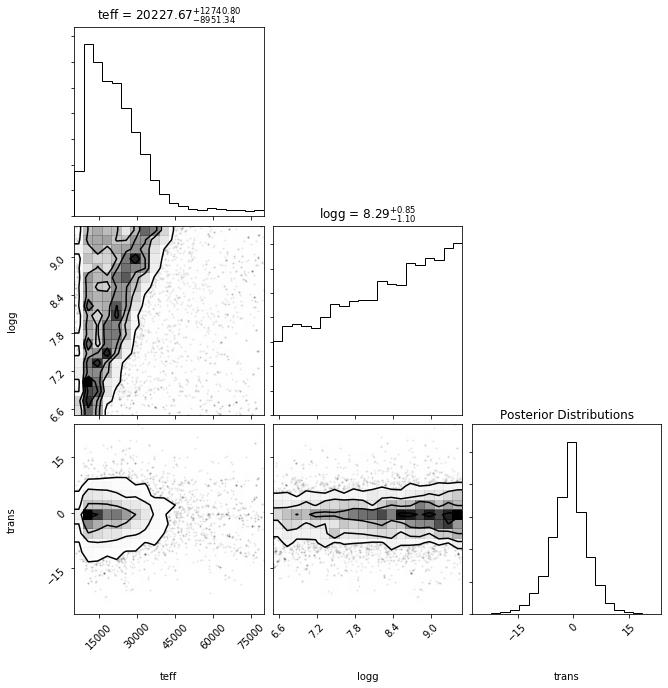

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 6.17255952
    reduced chi-square = 0.00507195
    Akaike info crit   = -6443.52091
    Bayesian info crit = -6428.20110
[[Variables]]
    teff:   20227.6653 +/- 10912.8912 (53.95%) (init = 19405.63)
    logg:   8.29482199 +/- 0.98195981 (11.84%) (init = 7.995496)
    trans: -1.03277245 +/- 4.59380615 (444.80%) (init = -1.180739)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.227


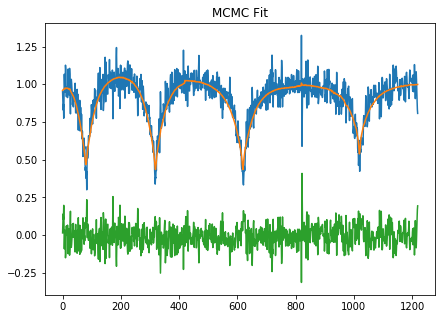













 11%|█         | 23/217 [14:09<1:59:33, 36.98s/it]

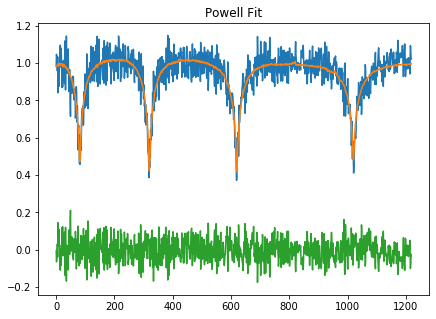

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 144
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.18686020
    reduced chi-square = 0.00344031
    Akaike info crit   = -6917.07915
    Bayesian info crit = -6901.75933
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   8631.02032 +/-        nan (nan%) (init = 20000)
    logg:   8.03641736 +/-        nan (nan%) (init = 8)
    trans: -0.09446094 +/- 0.16383342 (173.44%) (init = 0)

 Starting Bayesian Sampling................
...Done.


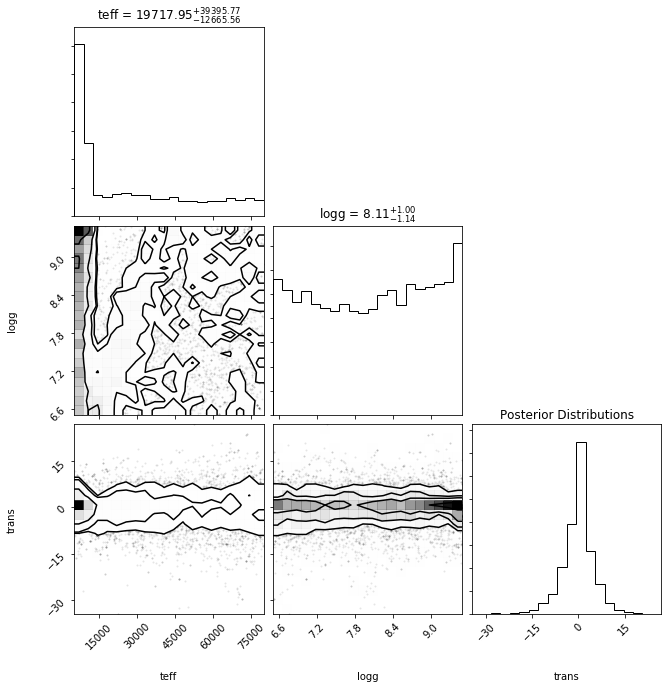

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 7.76156913
    reduced chi-square = 0.00637762
    Akaike info crit   = -6164.05437
    Bayesian info crit = -6148.73455
[[Variables]]
    teff:   19717.9460 +/- 26123.9072 (132.49%) (init = 8631.02)
    logg:   8.10789551 +/- 1.07861858 (13.30%) (init = 8.036417)
    trans: -0.10113598 +/- 4.14503816 (4098.48%) (init = -0.09446094)


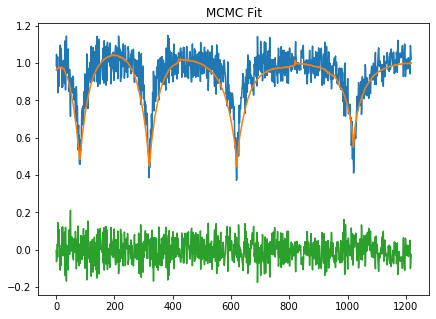













 11%|█         | 24/217 [14:42<1:55:29, 35.91s/it]

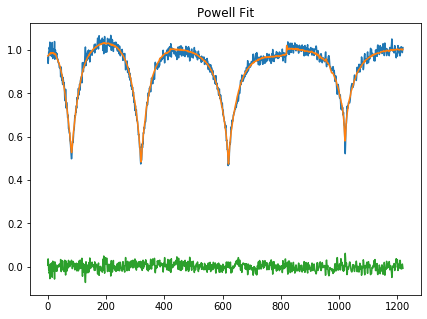

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 143
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.35648225
    reduced chi-square = 2.9292e-04
    Akaike info crit   = -9922.45389
    Bayesian info crit = -9907.13407
[[Variables]]
    teff:   22252.8851 +/- 4670.21941 (20.99%) (init = 20000)
    logg:   8.00017458 +/- 0.50873495 (6.36%) (init = 8)
    trans:  0.24401792 +/- 0.08568173 (35.11%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


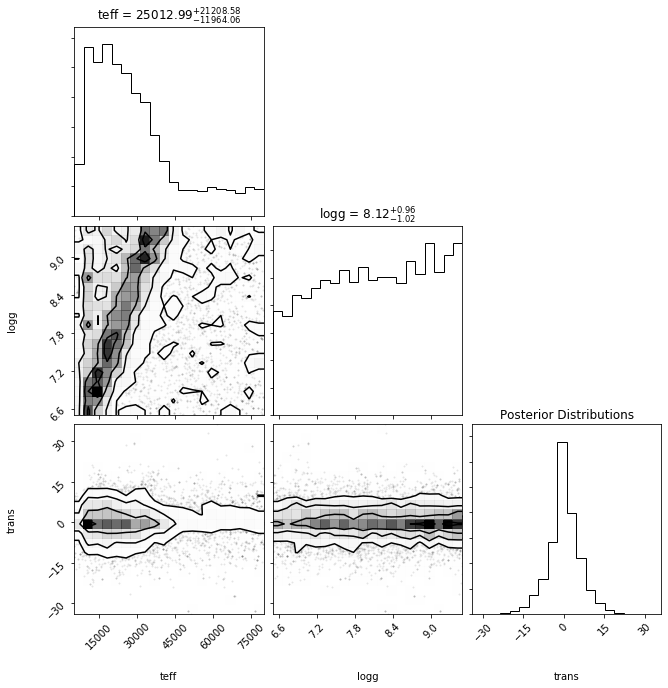

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.39652634
    reduced chi-square = 3.2582e-04
    Akaike info crit   = -9792.57512
    Bayesian info crit = -9777.25530
[[Variables]]
    teff:   25012.9871 +/- 16793.7734 (67.14%) (init = 22252.89)
    logg:   8.12297158 +/- 0.99741742 (12.28%) (init = 8.000175)
    trans:  0.23431577 +/- 5.19276359 (2216.14%) (init = 0.2440179)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.181


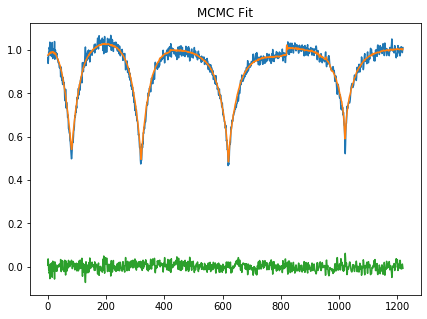













 12%|█▏        | 25/217 [15:18<1:54:48, 35.88s/it]

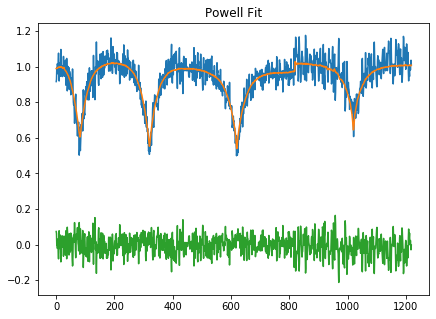

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 125
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.59568692
    reduced chi-square = 0.00295455
    Akaike info crit   = -7102.78273
    Bayesian info crit = -7087.46291
[[Variables]]
    teff:   27986.2655 +/- 7311.42662 (26.13%) (init = 20000)
    logg:   8.00324634 +/- 0.77384674 (9.67%) (init = 8)
    trans:  0.23026851 +/- 0.25986424 (112.85%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


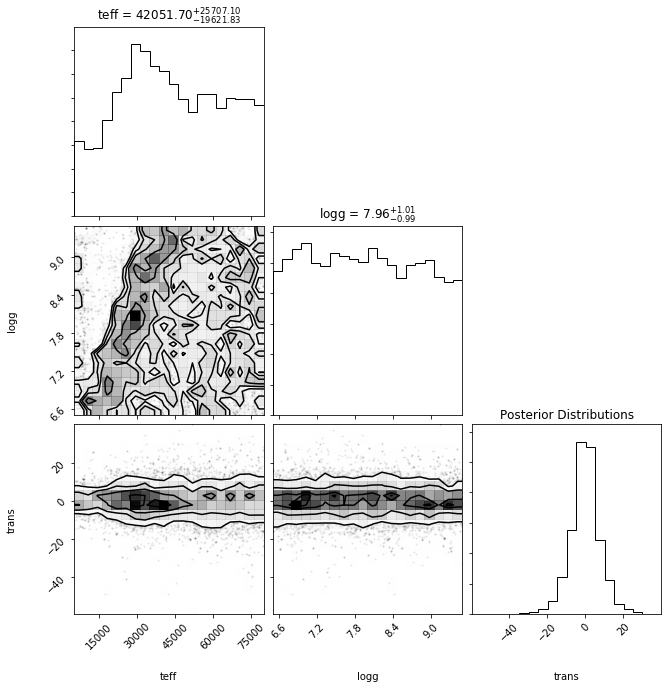

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 5.07122672
    reduced chi-square = 0.00416699
    Akaike info crit   = -6683.28854
    Bayesian info crit = -6667.96872
[[Variables]]
    teff:   42051.6952 +/- 22740.5789 (54.08%) (init = 27986.27)
    logg:   7.95892045 +/- 1.00415573 (12.62%) (init = 8.003246)
    trans:  0.02438744 +/- 6.81423686 (27941.59%) (init = 0.2302685)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.138


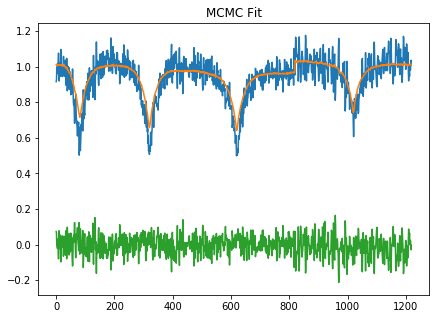













 12%|█▏        | 26/217 [15:53<1:53:41, 35.71s/it]

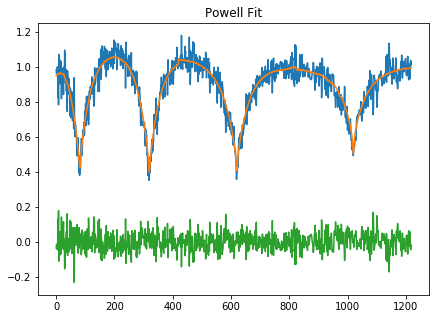

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 95
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.00272517
    reduced chi-square = 0.00246732
    Akaike info crit   = -7322.64477
    Bayesian info crit = -7307.32495
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   17519.5999 +/-        nan (nan%) (init = 20000)
    logg:   8.87958800 +/-        nan (nan%) (init = 8)
    trans: -0.10240570 +/- 0.21948714 (214.33%) (init = 0)

 Starting Bayesian Sampling................
...Done.


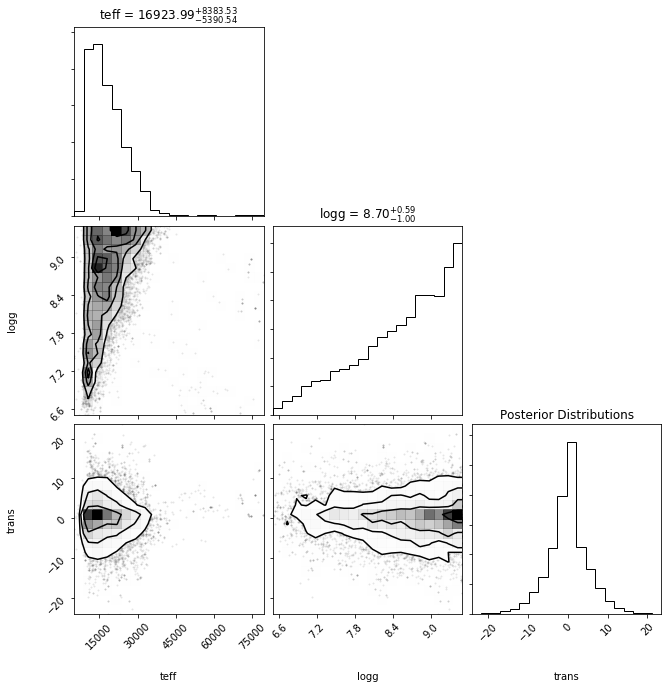

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.00274924
    reduced chi-square = 0.00246734
    Akaike info crit   = -7322.63498
    Bayesian info crit = -7307.31517
[[Variables]]
    teff:   16923.9912 +/- 6917.43508 (40.87%) (init = 17519.6)
    logg:   8.69833045 +/- 0.80167004 (9.22%) (init = 8.879588)
    trans: -0.07138542 +/- 4.40854179 (6175.69%) (init = -0.1024057)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.342


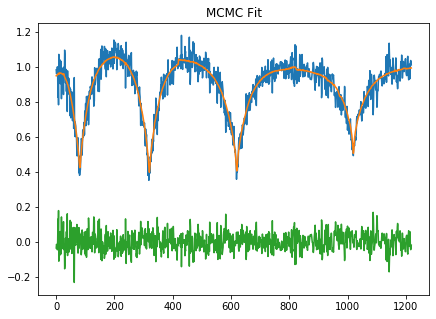













 12%|█▏        | 27/217 [16:32<1:55:45, 36.55s/it]

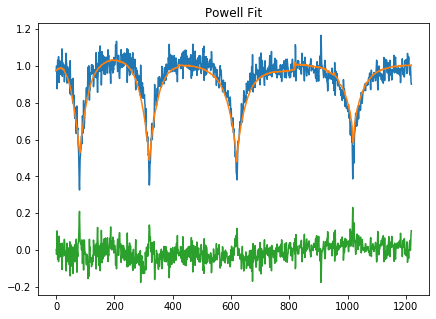

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 108
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.10152563
    reduced chi-square = 0.00254850
    Akaike info crit   = -7283.14865
    Bayesian info crit = -7267.82883
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   22553.4734 +/-        nan (nan%) (init = 20000)
    logg:   7.99765423 +/-        nan (nan%) (init = 8)
    trans: -0.33539934 +/- 0.21811872 (65.03%) (init = 0)

 Starting Bayesian Sampling................
...Done.


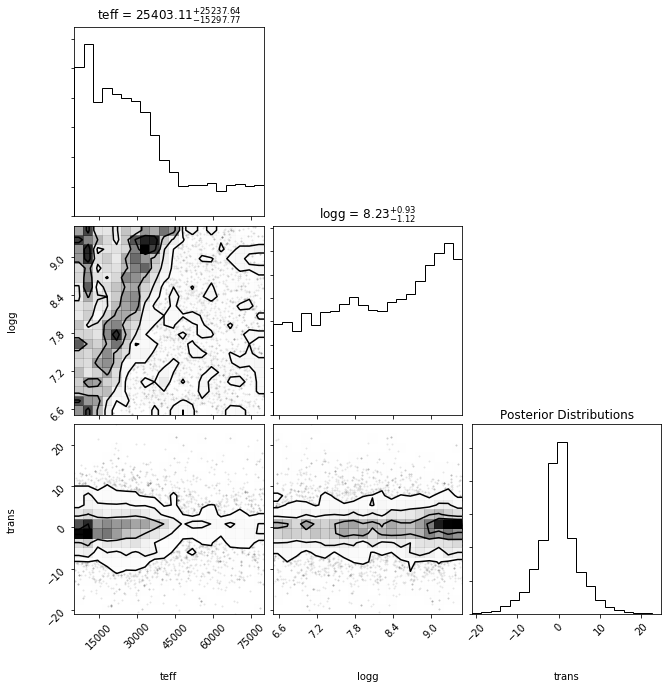

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.10907774
    reduced chi-square = 0.00255471
    Akaike info crit   = -7280.18160
    Bayesian info crit = -7264.86178
[[Variables]]
    teff:   25403.1128 +/- 20419.9269 (80.38%) (init = 22553.47)
    logg:   8.22644149 +/- 1.03091762 (12.53%) (init = 7.997654)
    trans: -0.25470128 +/- 4.23349996 (1662.14%) (init = -0.3353993)


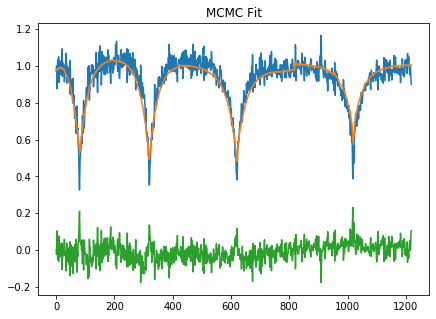













 13%|█▎        | 28/217 [17:06<1:53:25, 36.01s/it]

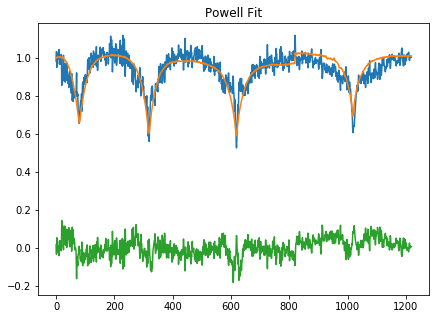

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 165
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.73380142
    reduced chi-square = 0.00224634
    Akaike info crit   = -7437.11390
    Bayesian info crit = -7421.79408
[[Variables]]
    teff:   30722.2497 +/- 10877.4612 (35.41%) (init = 20000)
    logg:   8.00168066 +/- 1.15169609 (14.39%) (init = 8)
    trans: -1.59365436 +/- 0.28472123 (17.87%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


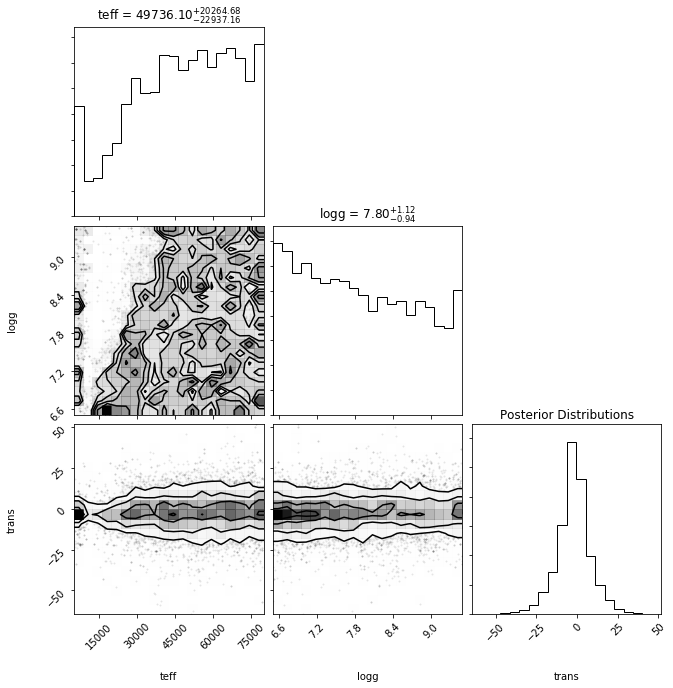

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.13252279
    reduced chi-square = 0.00257397
    Akaike info crit   = -7271.01630
    Bayesian info crit = -7255.69648
[[Variables]]
    teff:   49736.0980 +/- 21648.4361 (43.53%) (init = 30722.25)
    logg:   7.79782763 +/- 1.03237186 (13.24%) (init = 8.001681)
    trans: -1.90962696 +/- 8.73728733 (457.54%) (init = -1.593654)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.174


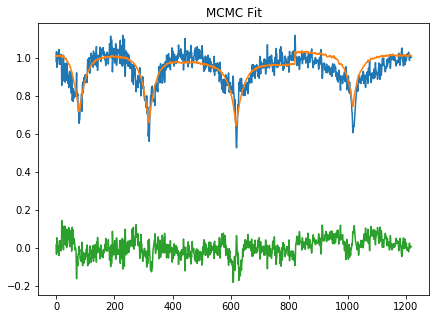













 13%|█▎        | 29/217 [17:42<1:52:13, 35.82s/it]

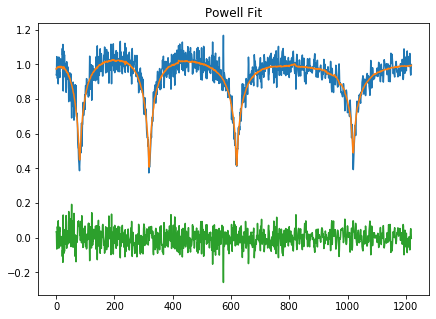

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 192
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.85336709
    reduced chi-square = 0.00234459
    Akaike info crit   = -7384.88982
    Bayesian info crit = -7369.57000
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   9171.89231 +/-        nan (nan%) (init = 20000)
    logg:   8.01754602 +/-        nan (nan%) (init = 8)
    trans: -0.52377536 +/- 0.15837075 (30.24%) (init = 0)

 Starting Bayesian Sampling................
...Done.


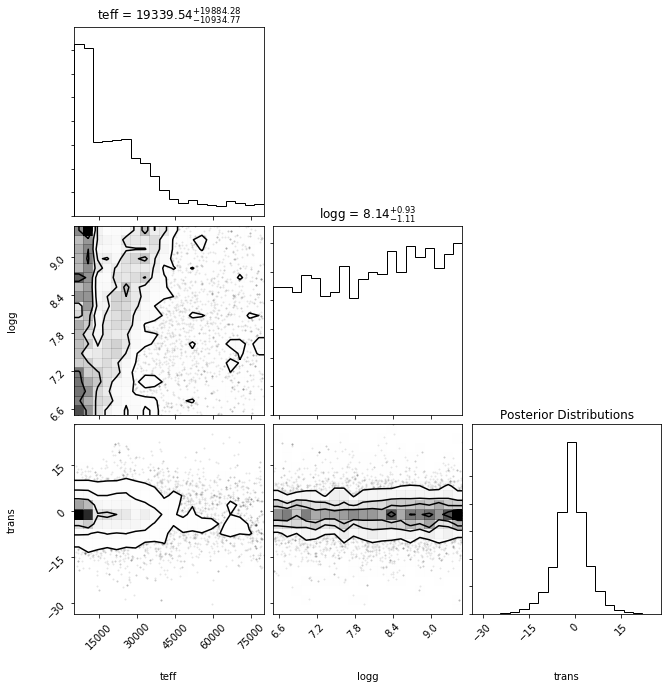

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.92876115
    reduced chi-square = 0.00404993
    Akaike info crit   = -6718.05253
    Bayesian info crit = -6702.73271
[[Variables]]
    teff:   19339.5412 +/- 15470.0329 (79.99%) (init = 9171.892)
    logg:   8.14194930 +/- 1.01982967 (12.53%) (init = 8.017546)
    trans: -1.00927366 +/- 4.62031672 (457.79%) (init = -0.5237754)


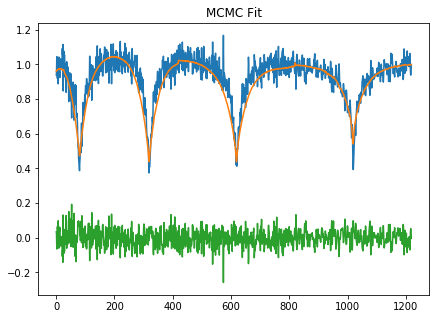













 14%|█▍        | 30/217 [18:16<1:50:30, 35.45s/it]

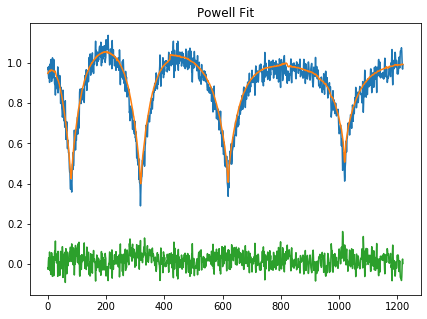

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 107
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.16024131
    reduced chi-square = 0.00177505
    Akaike info crit   = -7724.39117
    Bayesian info crit = -7709.07135
[[Variables]]
    teff:   17108.3975 +/- 11984.8219 (70.05%) (init = 20000)
    logg:   8.82516517 +/- 1.59862154 (18.11%) (init = 8)
    trans: -1.22286933 +/- 0.18477319 (15.11%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.728

 Starting Bayesian Sampling................
...Done.


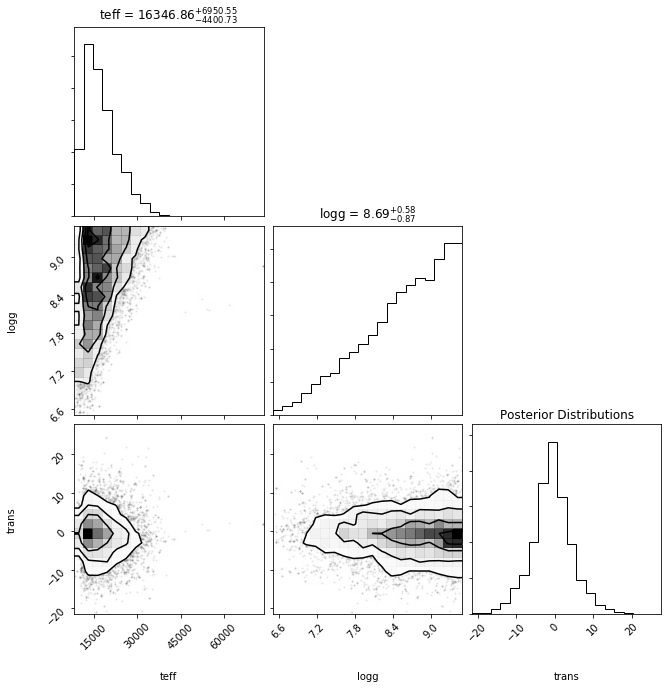

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.17097867
    reduced chi-square = 0.00178388
    Akaike info crit   = -7718.34225
    Bayesian info crit = -7703.02243
[[Variables]]
    teff:   16346.8562 +/- 5706.82302 (34.91%) (init = 17108.4)
    logg:   8.68751557 +/- 0.72712227 (8.37%) (init = 8.825165)
    trans: -0.75092356 +/- 4.74309120 (631.63%) (init = -1.222869)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.420


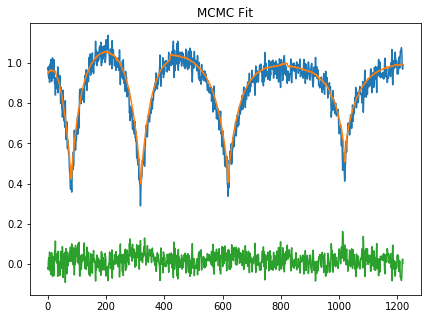













 14%|█▍        | 31/217 [18:56<1:53:37, 36.65s/it]

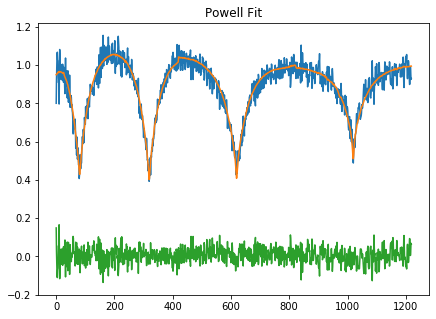

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 161
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.97636959
    reduced chi-square = 0.00162397
    Akaike info crit   = -7832.92031
    Bayesian info crit = -7817.60049
[[Variables]]
    teff:   14703.0125 +/- 9373.93405 (63.76%) (init = 20000)
    logg:   7.92645689 +/- 1.33662011 (16.86%) (init = 8)
    trans: -0.62716564 +/- 0.18793805 (29.97%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.997

 Starting Bayesian Sampling................
...Done.


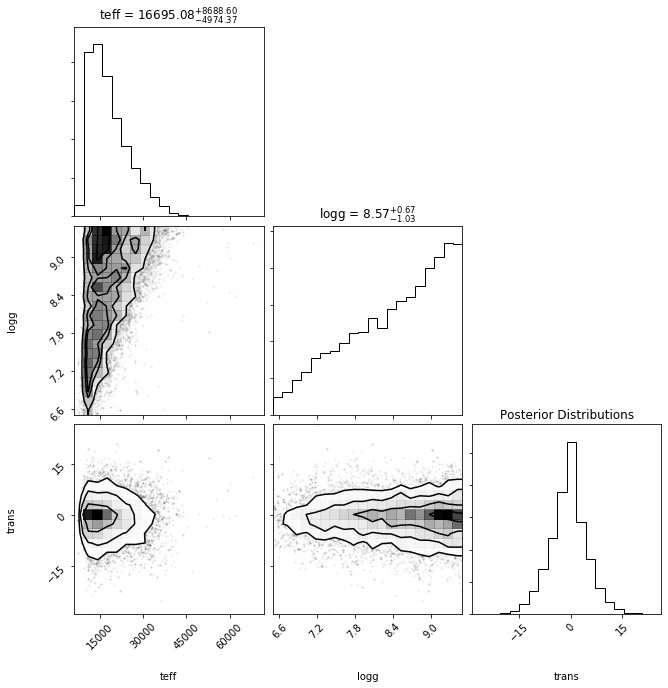

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.97725856
    reduced chi-square = 0.00162470
    Akaike info crit   = -7832.37168
    Bayesian info crit = -7817.05186
[[Variables]]
    teff:   16695.0752 +/- 6856.73753 (41.07%) (init = 14703.01)
    logg:   8.56837031 +/- 0.85817798 (10.02%) (init = 7.926457)
    trans: -0.70424450 +/- 5.06746594 (719.56%) (init = -0.6271656)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.437


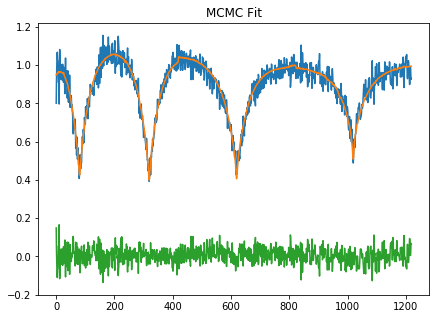













 15%|█▍        | 32/217 [19:34<1:54:19, 37.08s/it]

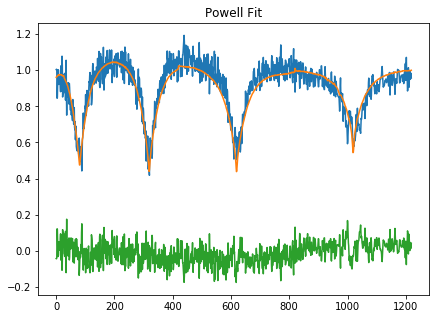

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 90
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.10551831
    reduced chi-square = 0.00337347
    Akaike info crit   = -6941.01445
    Bayesian info crit = -6925.69463
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   18268.3379 +/-        nan (nan%) (init = 20000)
    logg:   7.99348817 +/-        nan (nan%) (init = 8)
    trans: -0.72121157 +/- 0.29602168 (41.05%) (init = 0)

 Starting Bayesian Sampling................
...Done.


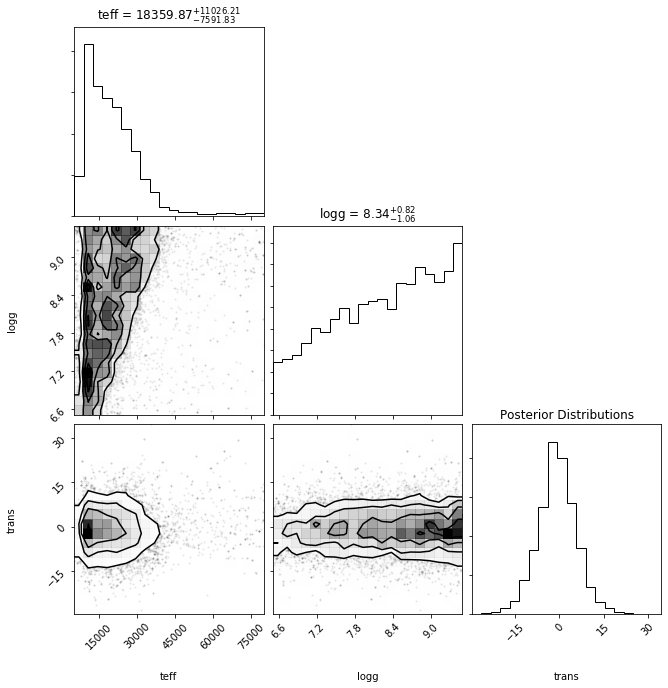

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.37206658
    reduced chi-square = 0.00359250
    Akaike info crit   = -6864.27181
    Bayesian info crit = -6848.95199
[[Variables]]
    teff:   18359.8720 +/- 9342.47800 (50.89%) (init = 18268.34)
    logg:   8.34349893 +/- 0.94656158 (11.34%) (init = 7.993488)
    trans: -0.85788746 +/- 6.14882285 (716.74%) (init = -0.7212116)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.325


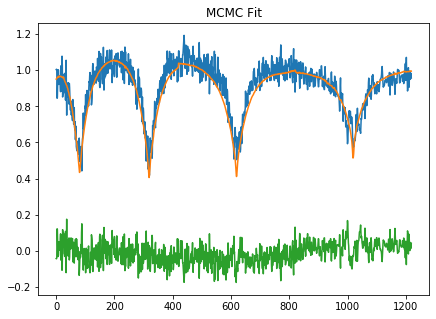













 15%|█▌        | 33/217 [20:11<1:53:44, 37.09s/it]

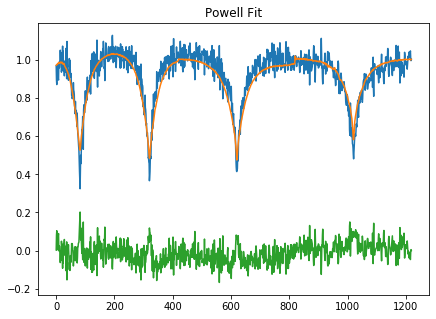

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 111
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.32914218
    reduced chi-square = 0.00273553
    Akaike info crit   = -7196.74759
    Bayesian info crit = -7181.42777
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   22282.5306 +/-        nan (nan%) (init = 20000)
    logg:   7.99633046 +/-        nan (nan%) (init = 8)
    trans:  0.41523991 +/- 0.21752337 (52.38%) (init = 0)

 Starting Bayesian Sampling................
...Done.


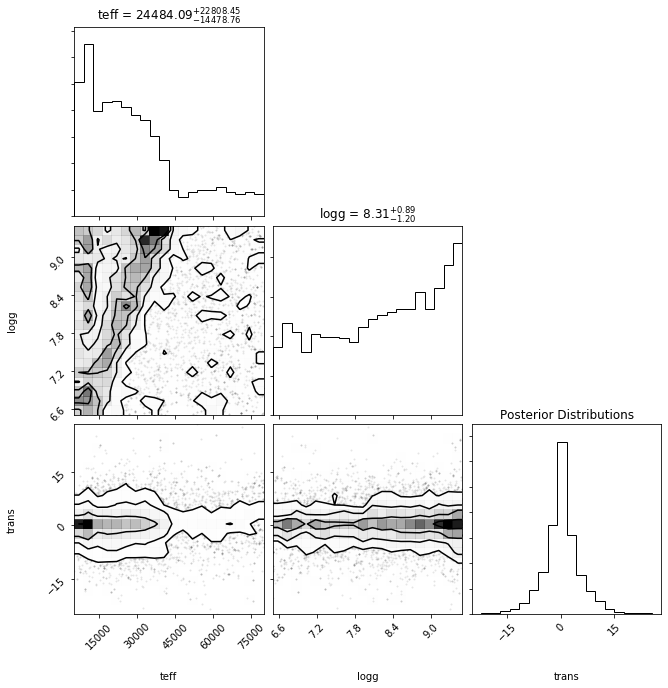

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.34031092
    reduced chi-square = 0.00274471
    Akaike info crit   = -7192.66154
    Bayesian info crit = -7177.34172
[[Variables]]
    teff:   24484.0940 +/- 18776.2752 (76.69%) (init = 22282.53)
    logg:   8.31435577 +/- 1.05067285 (12.64%) (init = 7.99633)
    trans:  0.31504564 +/- 4.15940202 (1320.25%) (init = 0.4152399)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.106


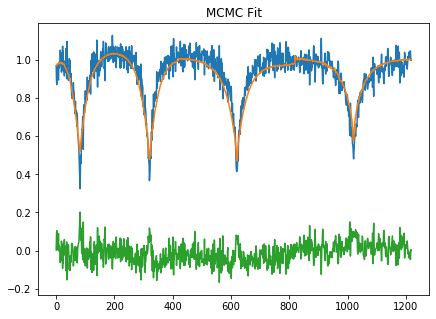













 16%|█▌        | 34/217 [20:46<1:50:42, 36.30s/it]

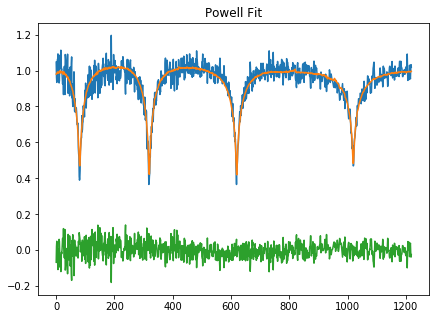

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 133
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.07507393
    reduced chi-square = 0.00170507
    Akaike info crit   = -7773.46342
    Bayesian info crit = -7758.14360
[[Variables]]
    teff:   8659.07354 +/- 814.902258 (9.41%) (init = 20000)
    logg:   7.95649230 +/- 0.98197822 (12.34%) (init = 8)
    trans: -0.40948159 +/- 0.12525918 (30.59%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.999

 Starting Bayesian Sampling................
...Done.


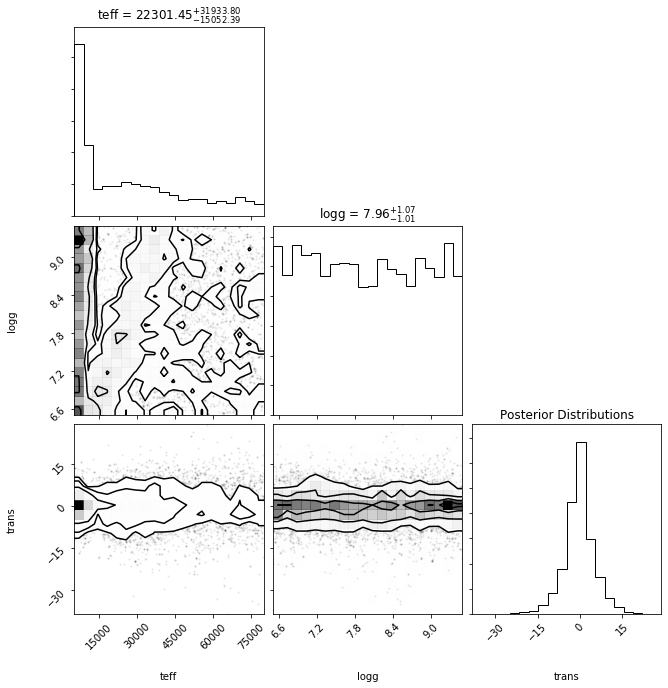

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 4.38070188
    reduced chi-square = 0.00359959
    Akaike info crit   = -6861.86456
    Bayesian info crit = -6846.54474
[[Variables]]
    teff:   22301.4505 +/- 23555.0523 (105.62%) (init = 8659.074)
    logg:   7.95900513 +/- 1.04331632 (13.11%) (init = 7.956492)
    trans: -0.35985694 +/- 4.58443995 (1273.96%) (init = -0.4094816)


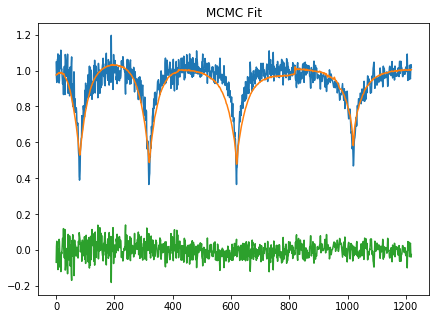













 16%|█▌        | 35/217 [21:19<1:47:45, 35.53s/it]

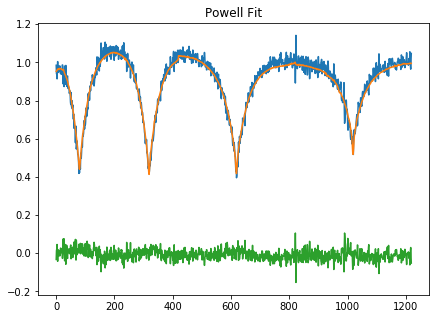

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 288
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.98241896
    reduced chi-square = 8.0725e-04
    Akaike info crit   = -8685.69914
    Bayesian info crit = -8670.37932
[[Variables]]
    teff:   13826.3768 +/- 2926.85820 (21.17%) (init = 20000)
    logg:   7.60947208 +/- 0.42765012 (5.62%) (init = 8)
    trans: -1.29821203 +/- 0.13557941 (10.44%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.999

 Starting Bayesian Sampling................
...Done.


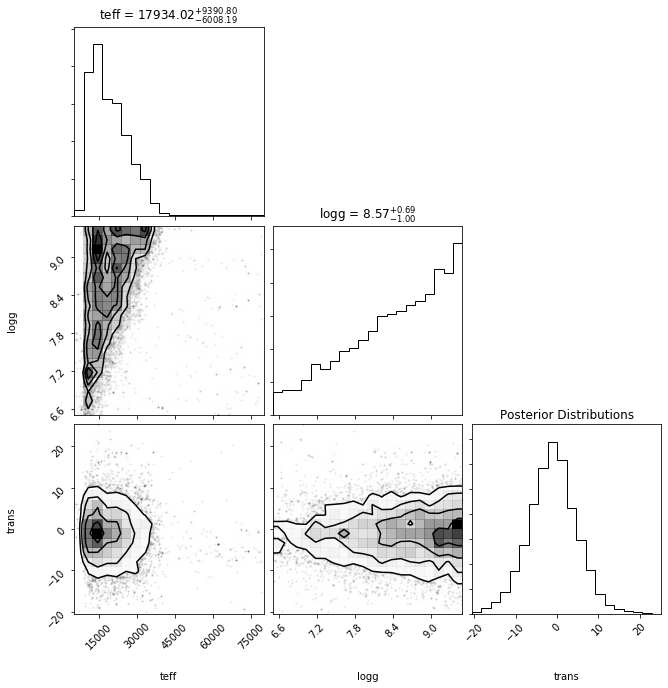

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.03398939
    reduced chi-square = 8.4962e-04
    Akaike info crit   = -8623.28158
    Bayesian info crit = -8607.96176
[[Variables]]
    teff:   17934.0157 +/- 7726.94000 (43.09%) (init = 13826.38)
    logg:   8.56622810 +/- 0.84397807 (9.85%) (init = 7.609472)
    trans: -1.01432249 +/- 5.63547114 (555.59%) (init = -1.298212)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.306


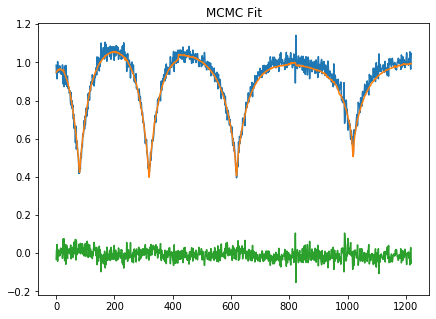













 17%|█▋        | 36/217 [21:58<1:50:00, 36.47s/it]

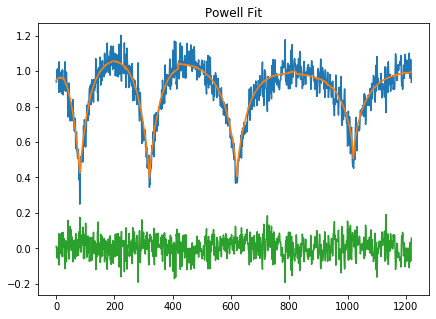

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 94
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.81207709
    reduced chi-square = 0.00313236
    Akaike info crit   = -7031.48695
    Bayesian info crit = -7016.16714
[[Variables]]
    teff:   17668.2214 +/- 23804.0705 (134.73%) (init = 20000)
    logg:   8.89152887 +/- 3.12730509 (35.17%) (init = 8)
    trans: -0.00212472 +/- 0.26968009 (12692.52%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.865

 Starting Bayesian Sampling................
...Done.


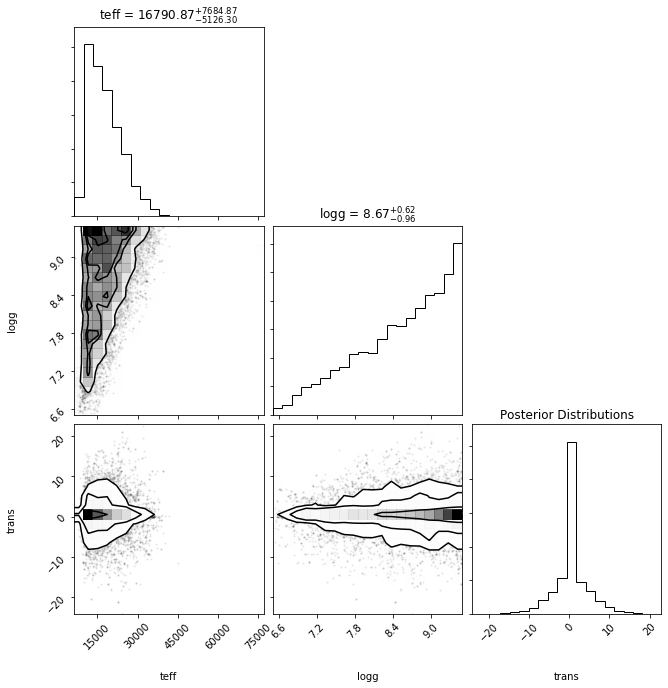

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.81211406
    reduced chi-square = 0.00313239
    Akaike info crit   = -7031.47512
    Bayesian info crit = -7016.15530
[[Variables]]
    teff:   16790.8731 +/- 6427.10280 (38.28%) (init = 17668.22)
    logg:   8.67303564 +/- 0.79241651 (9.14%) (init = 8.891529)
    trans: -9.5119e-04 +/- 3.02248374 (317759.22%) (init = -0.002124717)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.451


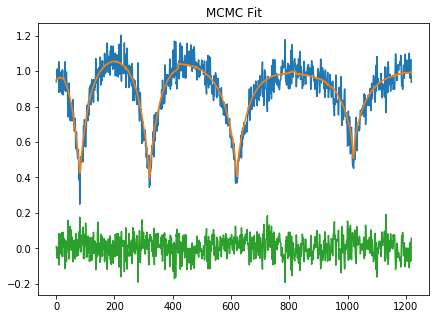













 17%|█▋        | 37/217 [22:37<1:51:19, 37.11s/it]

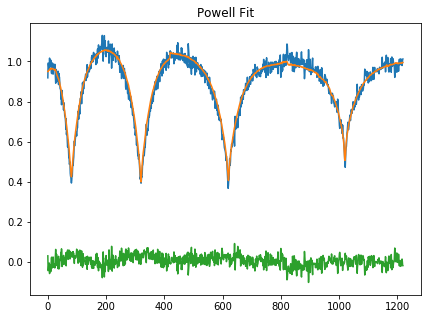

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 98
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.97440479
    reduced chi-square = 8.0066e-04
    Akaike info crit   = -8695.69222
    Bayesian info crit = -8680.37240
[[Variables]]
    teff:   17023.5764 +/- 18215.6984 (107.00%) (init = 20000)
    logg:   8.77266240 +/- 2.35387075 (26.83%) (init = 8)
    trans: -0.21915403 +/- 0.12447856 (56.80%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.941

 Starting Bayesian Sampling................
...Done.


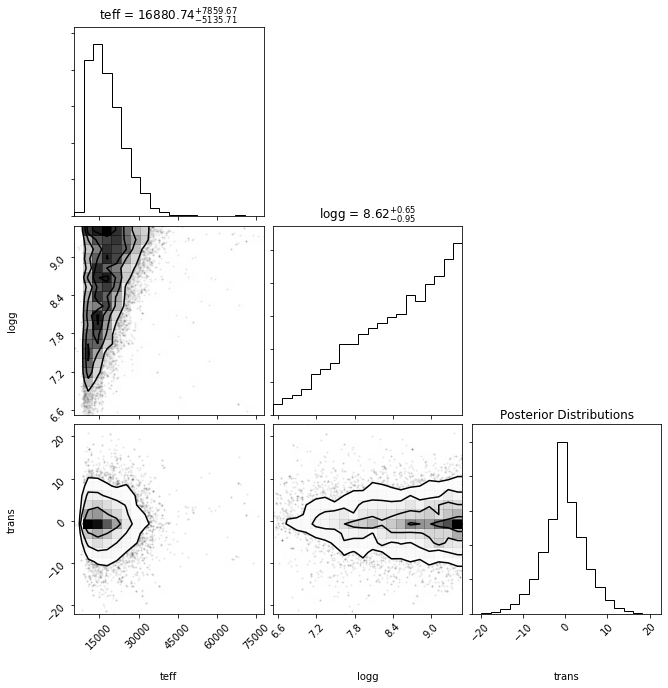

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.97551187
    reduced chi-square = 8.0157e-04
    Akaike info crit   = -8694.30689
    Bayesian info crit = -8678.98707
[[Variables]]
    teff:   16880.7356 +/- 6530.21947 (38.68%) (init = 17023.58)
    logg:   8.61636253 +/- 0.80693400 (9.37%) (init = 8.772662)
    trans: -0.34508332 +/- 4.72071495 (1367.99%) (init = -0.219154)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.411


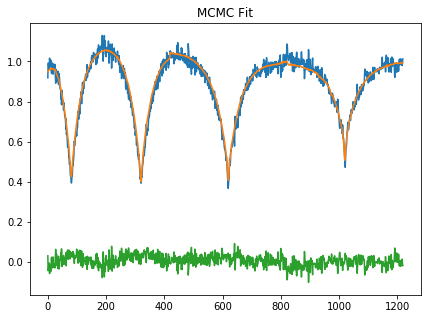













 18%|█▊        | 38/217 [23:15<1:52:04, 37.57s/it]

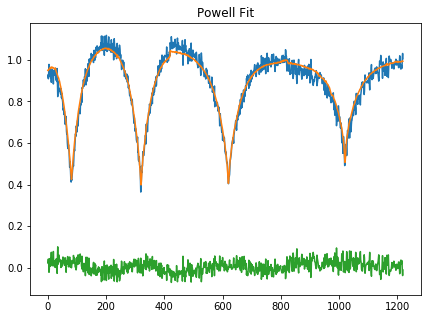

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 125
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.98398144
    reduced chi-square = 8.0853e-04
    Akaike info crit   = -8683.76035
    Bayesian info crit = -8668.44053
[[Variables]]
    teff:   17356.0083 +/- 9753.47216 (56.20%) (init = 20000)
    logg:   8.86157871 +/- 1.34310667 (15.16%) (init = 8)
    trans: -0.00161612 +/- 0.13091217 (8100.41%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.736

 Starting Bayesian Sampling................
...Done.


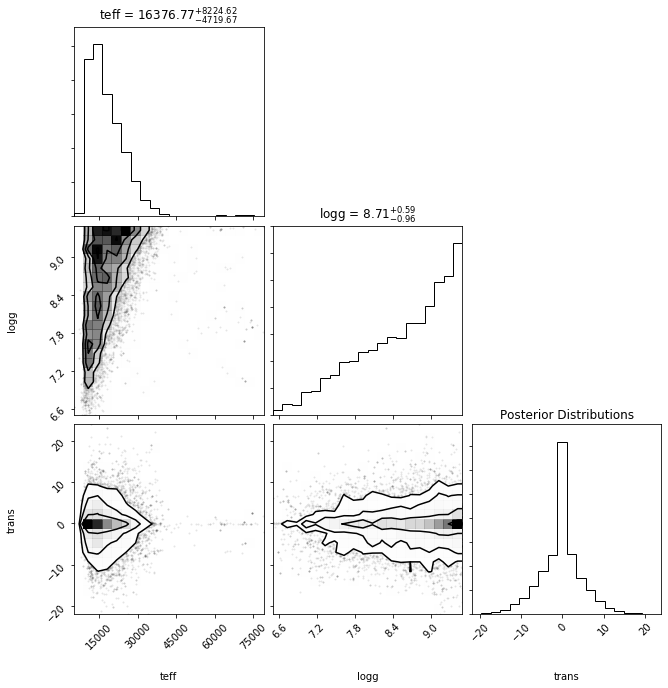

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.98401625
    reduced chi-square = 8.0856e-04
    Akaike info crit   = -8683.71719
    Bayesian info crit = -8668.39737
[[Variables]]
    teff:   16376.7716 +/- 6502.27564 (39.70%) (init = 17356.01)
    logg:   8.70710815 +/- 0.78071933 (8.97%) (init = 8.861579)
    trans: -0.00854309 +/- 4.39737132 (51472.82%) (init = -0.001616118)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.382


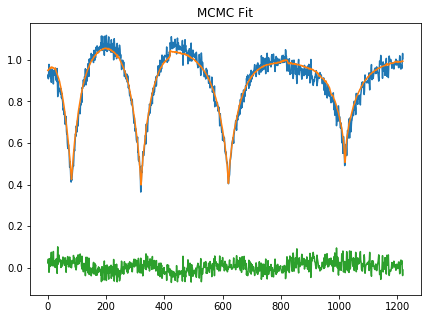













 18%|█▊        | 39/217 [23:54<1:52:14, 37.84s/it]

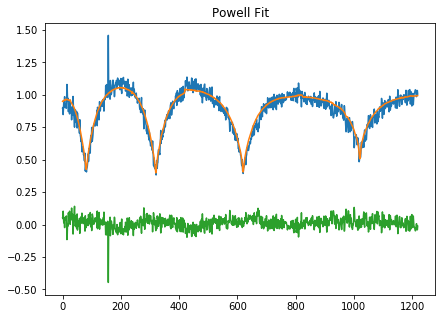

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 86
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.34068136
    reduced chi-square = 0.00192332
    Akaike info crit   = -7626.52017
    Bayesian info crit = -7611.20035
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   17666.3580 +/-        nan (nan%) (init = 20000)
    logg:   8.88364198 +/-        nan (nan%) (init = 8)
    trans:  0.03828834 +/- 0.21696968 (566.67%) (init = 0)

 Starting Bayesian Sampling................
...Done.


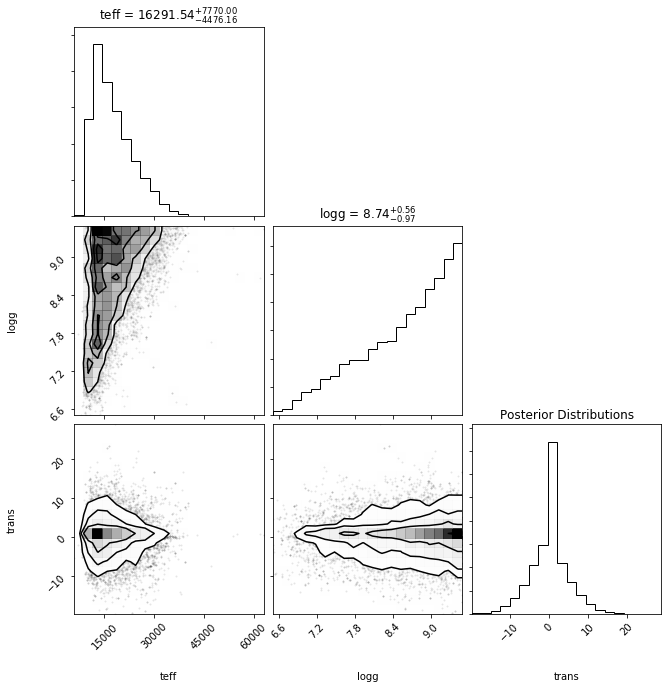

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 2.34070514
    reduced chi-square = 0.00192334
    Akaike info crit   = -7626.50777
    Bayesian info crit = -7611.18795
[[Variables]]
    teff:   16291.5435 +/- 6170.07096 (37.87%) (init = 17666.36)
    logg:   8.74096233 +/- 0.76854581 (8.79%) (init = 8.883642)
    trans:  0.04278558 +/- 4.18895112 (9790.57%) (init = 0.03828834)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.445


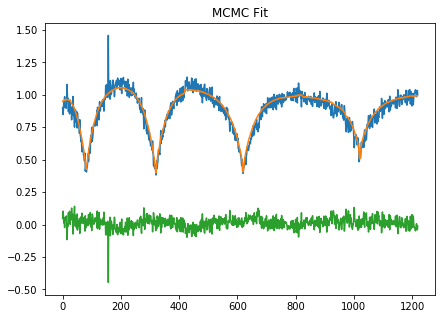













 18%|█▊        | 40/217 [24:33<1:52:37, 38.18s/it]

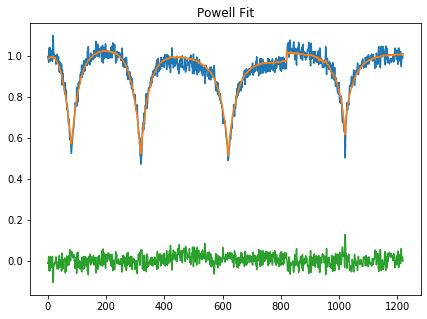

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 123
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.86093664
    reduced chi-square = 7.0743e-04
    Akaike info crit   = -8846.73542
    Bayesian info crit = -8831.41560
[[Variables]]
    teff:   26252.4552 +/- 18046.3663 (68.74%) (init = 20000)
    logg:   7.99998010 +/- 1.91259445 (23.91%) (init = 8)
    trans: -0.45748283 +/- 0.13536943 (29.59%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  1.000

 Starting Bayesian Sampling................
...Done.


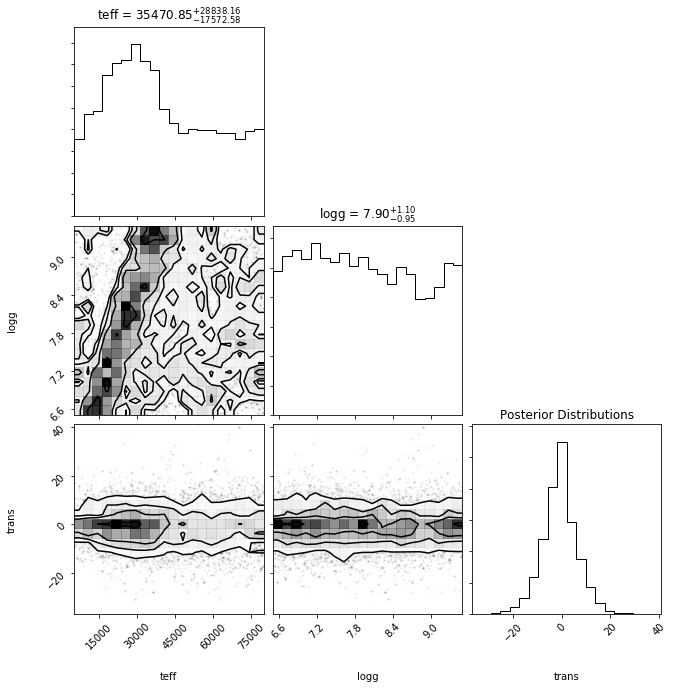

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.11555125
    reduced chi-square = 0.00256003
    Akaike info crit   = -7277.64404
    Bayesian info crit = -7262.32422
[[Variables]]
    teff:   35470.8540 +/- 23296.6805 (65.68%) (init = 26252.46)
    logg:   7.90266646 +/- 1.02699370 (13.00%) (init = 7.99998)
    trans: -0.79876586 +/- 6.69540018 (838.22%) (init = -0.4574828)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.114


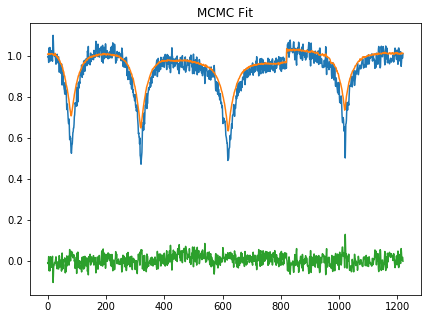













 19%|█▉        | 41/217 [25:08<1:49:07, 37.20s/it]

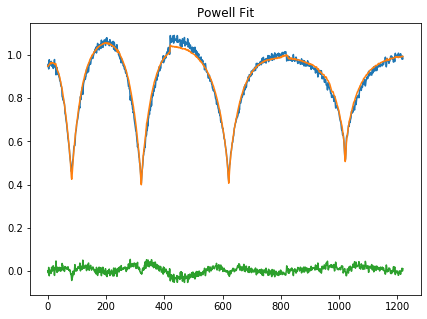

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 211
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.38670706
    reduced chi-square = 3.1775e-04
    Akaike info crit   = -9823.16664
    Bayesian info crit = -9807.84682
[[Variables]]
    teff:   17574.9705 +/- 5903.06714 (33.59%) (init = 20000)
    logg:   8.86258771 +/- 0.72838248 (8.22%) (init = 8)
    trans:  0.79062924 +/- 0.08788343 (11.12%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.792

 Starting Bayesian Sampling................
...Done.


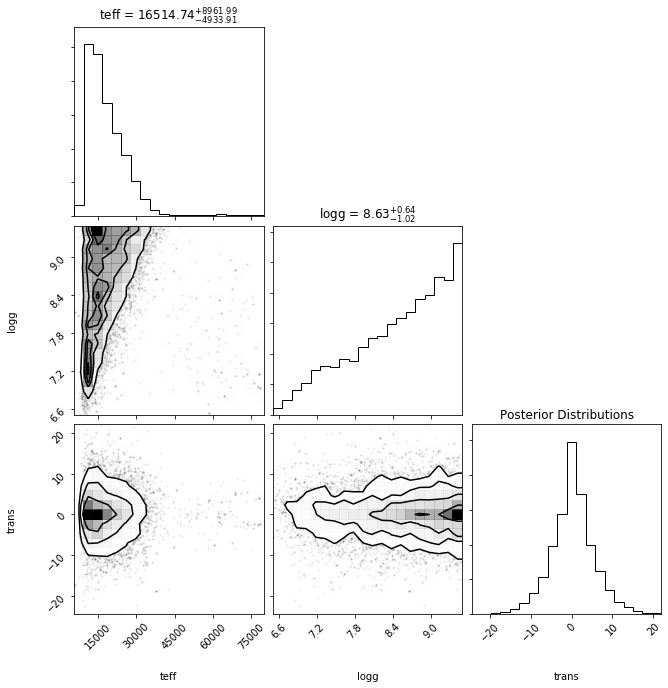

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 25000
    # data points      = 1220
    # variables        = 3
    chi-square         = 0.39326513
    reduced chi-square = 3.2314e-04
    Akaike info crit   = -9802.65044
    Bayesian info crit = -9787.33063
[[Variables]]
    teff:   16514.7410 +/- 6976.44243 (42.24%) (init = 17574.97)
    logg:   8.63433110 +/- 0.83451173 (9.67%) (init = 8.862588)
    trans:  0.41324232 +/- 4.71081128 (1139.96%) (init = 0.7906292)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.257


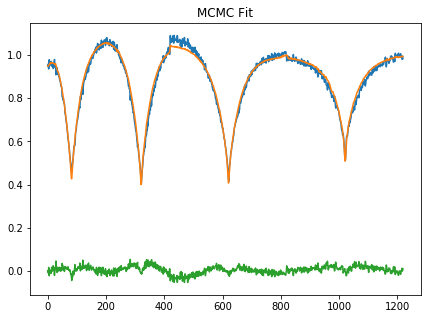













 19%|█▉        | 42/217 [25:46<1:49:37, 37.59s/it]

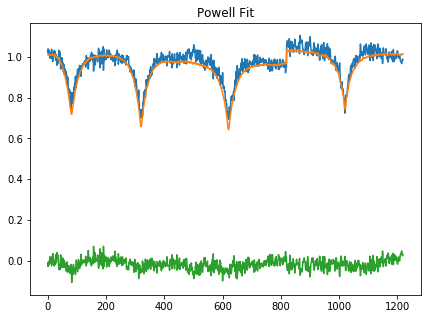

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 114
    # data points      = 1220
    # variables        = 3
    chi-square         = 1.16912372
    reduced chi-square = 9.6066e-04
    Akaike info crit   = -8473.42898
    Bayesian info crit = -8458.10917
##  Warning: uncertainties could not be estimated:
[[Variables]]
    teff:   79309.9068 (init = 20000)
    logg:   8.93313337 (init = 8)
    trans:  0.39266087 (init = 0)

 Starting Bayesian Sampling................


TypeError: only size-1 arrays can be converted to Python scalars

In [70]:
fitoutput = np.zeros((len(y_test),5))
bayesoutput = np.zeros((len(y_test),5))
for i in tqdm(range(len(y_test))):
    spec = y_test[i][lines]
    fitoutput[i,0] = int(specnames[i][:-12])
    bayesoutput[i,0] = int(specnames[i][:-12])
    #params['teff'].set(value=sc.inverse_transform(X_test)[i,0],vary=True)
    result = fitter.fit(spec*modelscaling,params,wl=lamgrid[lines],method="powell",nan_policy='omit',calc_covar=True,
                       fit_kws={'reduce_fcn':chisquare})
    
    fitoutput[i,1] = result.params['teff'].value
    fitoutput[i,2] = result.params['teff'].stderr
    fitoutput[i,3] = result.params['logg'].value
    fitoutput[i,4] = result.params['logg'].stderr
    
    plt.figure(figsize=(7,5))
    plt.plot(spec*modelscaling)
    plt.plot(spectrum_sampler(None,result.params['teff'],result.params['logg'],result.params['trans']))
    plt.plot(result.residual)
    plt.title('Powell Fit')
    plt.show()
    print(lmfit.fit_report(result))
    
    # BAYESIAN FITTING ##
    
    bayesparams['teff'].set(value = result.params['teff'].value)
    bayesparams['logg'].set(value = result.params['logg'])
    print('\n Starting Bayesian Sampling................')
    bayesparams['trans'].set(value = result.params['trans'].value,vary=True)
    bayesresult = fitter.fit(spec*modelscaling,bayesparams,wl=lamgrid[lines],method="emcee",nan_policy='omit',\
                             calc_covar=True, fit_kws={'nwalkers':100,'steps':250,'burn':50,'thin':2})
    print('...Done.')
    fig,axs = plt.subplots(3,3,figsize=(10,10))
    f = corner.corner(bayesresult.flatchain[['teff','logg','trans']],show_titles = True,fig=fig)
    plt.title('Posterior Distributions')
    plt.show()
    print(lmfit.fit_report(bayesresult))
    plt.figure(figsize=(7,5))
    plt.plot(spec*modelscaling)
    plt.plot(spectrum_sampler(None,bayesresult.params['teff'],bayesresult.params['logg'],bayesresult.params['trans']))
    plt.plot(result.residual)
    plt.title('MCMC Fit')
    plt.show()
    bayesoutput[i,1] = bayesresult.params['teff'].value
    bayesoutput[i,2] = bayesresult.params['teff'].stderr
    bayesoutput[i,3] = bayesresult.params['logg'].value
    bayesoutput[i,4] = bayesresult.params['logg'].stderr

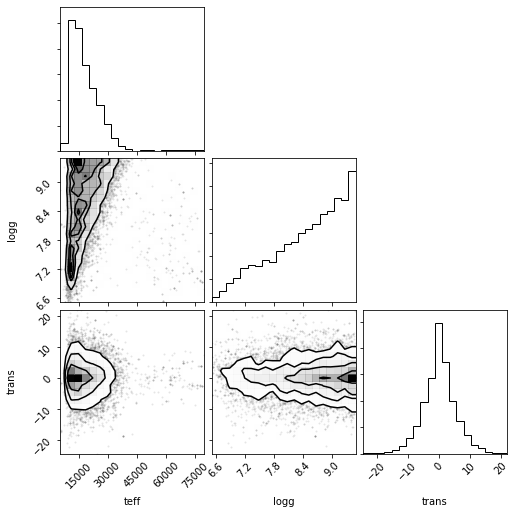

In [71]:
f = corner.corner(bayesresult.flatchain[['teff','logg','trans']],smooth=0)


In [60]:
true_labels = sc.inverse_transform(X_test)

Text(0.5, 0.1, 'rms: 16693 K, bias: 14030 K')

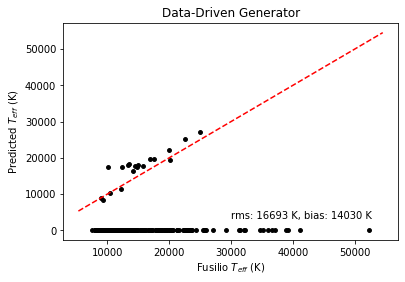

In [61]:
true = true_labels[:,0]
pred = fitoutput[:,1]
bpred = bayesoutput[:,1]
f=plt.scatter(true,pred,s=15,color='k')
x = np.linspace(f.axes.get_xlim()[0],f.axes.get_xlim()[1],1000)
y = x
plt.plot(x,y,'r--')

plt.xlabel('Fusilio $T_{eff}$ (K)')
plt.ylabel('Predicted $T_{eff}$ (K)')
plt.title('Data-Driven Generator')

rms = np.sqrt((np.sum((true-pred)**2) / len(true)))
bias = np.mean(true-bpred)
plt.text(0.5,0.1,'rms: %i K, bias: %i K'%(rms,bias),transform=f.axes.transAxes)

Text(0.5, 0.1, 'rms: 7.61 dex, bias: 7.26 dex')

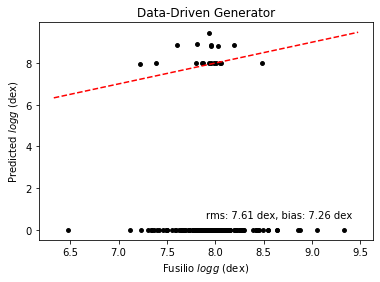

In [62]:
true = true_labels[:,1]
pred = fitoutput[:,3]
bpred = bayesoutput[:,3]
f=plt.scatter(true,pred,s=15,color='k')
x = np.linspace(f.axes.get_xlim()[0],f.axes.get_xlim()[1],1000)
y = x
plt.plot(x,y,'r--')

plt.xlabel('Fusilio $logg$ (dex)')
plt.ylabel('Predicted $logg$ (dex)')
plt.title('Data-Driven Generator')
rms = np.sqrt((np.sum((true-pred)**2) / len(true)))
bias = np.mean(true-bpred)
plt.text(0.5,0.1,'rms: %.2f dex, bias: %.2f dex'%(rms,bias),transform=f.axes.transAxes)

Text(0.5, 0.1, 'rms: 16774 K, bias: 14030 K')

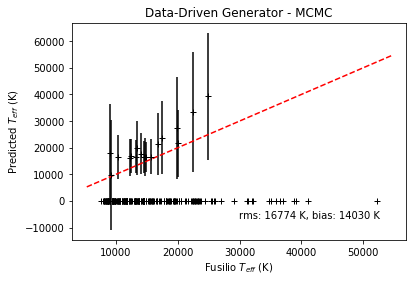

In [63]:
true = true_labels[:,0]
pred = fitoutput[:,1]
bpred = bayesoutput[:,1]
f = plt.subplot(111)
plt.errorbar(true,bpred,yerr=bayesoutput[:,2],linestyle='None',color='k',marker='+')
x = np.linspace(f.axes.get_xlim()[0],f.axes.get_xlim()[1],1000)
y = x
plt.plot(x,y,'r--')

plt.xlabel('Fusilio $T_{eff}$ (K)')
plt.ylabel('Predicted $T_{eff}$ (K)')
plt.title('Data-Driven Generator - MCMC')

rms = np.sqrt((np.sum((true-bpred)**2) / len(true)))
bias = np.mean(true-bpred)
plt.text(0.5,0.1,'rms: %i K, bias: %i K'%(rms,bias),transform=f.axes.transAxes)

Text(0.5, 0.1, 'rms: 0.61 dex, bias: -0.49 dex')

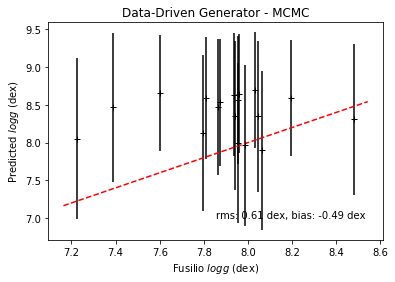

In [64]:
mask = bayesoutput[:,3] != 0

true = true_labels[:,1][mask]
pred = fitoutput[:,3]
bpred = bayesoutput[:,3][mask]
f = plt.subplot(111)
plt.errorbar(true,bpred,yerr=bayesoutput[:,4][mask],linestyle='None',color='k',marker='+')
x = np.linspace(f.axes.get_xlim()[0],f.axes.get_xlim()[1],1000)
y = x
plt.plot(x,y,'r--')

plt.xlabel('Fusilio $logg$ (dex)')
plt.ylabel('Predicted $logg$ (dex)')
plt.title('Data-Driven Generator - MCMC')
rms = np.sqrt((np.sum((true-bpred)**2) / len(true)))
bias = np.mean(true-bpred)
plt.text(0.5,0.1,'rms: %.2f dex, bias: %.2f dex'%(rms,bias),transform=f.axes.transAxes)

In [140]:
filename = ['4487216358658978560_spec_0.fits']

In [145]:

spectra = []
TeffHs = []
loggHs = []
specnames = []
for specname in tqdm(filename):
    f = fits.open(inputPath+specname)
    loglam = f[1].data['loglam']
    flux = f[1].data['flux']
    lam = 10**loglam
    lam = lam.astype(np.float64)
    flux = flux.astype(np.float64)
    lamgrid = np.arange(4000,8000)
    func = interp1d(lam,flux,kind='cubic',assume_sorted = False,fill_value='extrapolate')
    flux = func(lamgrid)
    spectra.append(flux)
    specnames.append(specname)
spectra = np.asarray(spectra)
TeffHs = np.asarray(TeffHs)
loggHs = np.asarray(loggHs)
bprps = np.asarray(bprps)
gs = np.asarray(gs)

lam = np.arange(4000,8000)
lamgrid = lam
lines = ((lam > hbeta-300) & (lam < hbeta + 300)) | ((lam > halpha-400) & (lam < halpha + 400))\
        | ((lam > hgamma-400) & (lam < hgamma + 200))

mask = ~lines | ((lam > 4010) & (lam < 4050)) | ((lam > 4190) & (lam < 4230))
def quadratic(array,c1,c2,c3,c4):
    return c1 + c2*array + c3*array**2 + c4*array**3

normspec = [];

for i in tqdm(range(len(spectra))):
    p,cov = curve_fit(quadratic,lamgrid[mask],spectra[i][mask],p0=[-25,1e-2,1e-5,1e-10])
    contcorr = (spectra[i]/quadratic(lam,p[0],p[1],p[2],p[3]))
    skylinemask = (lamgrid > 5578.5 - 10)*(lamgrid < 5578.5 + 10) + (lamgrid > 5894.6 - 10)*(lamgrid < 5894.6 + 10)\
        + (lamgrid > 6301.7 - 10)*(lamgrid < 6301.7 + 10) + (lamgrid > 7246.0 - 10)*(lamgrid < 7246.0 + 10)
    contcorr[skylinemask] = 1
    #contcorr = rvcorr(contcorr)
    #contcorr = np.log(contcorr)
    where = np.isnan(contcorr)
    contcorr[where] = 0
    normspec.append(contcorr[0:3000])
normspec = np.asarray(normspec)
len(normspec)





  0%|          | 0/1 [00:00<?, ?it/s]



100%|██████████| 1/1 [00:00<00:00, 118.59it/s]



  0%|          | 0/1 [00:00<?, ?it/s]



100%|██████████| 1/1 [00:00<00:00, 292.57it/s]

1

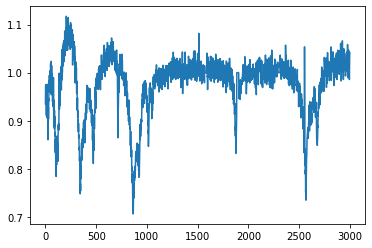

In [146]:
plt.plot(normspec[0])









  0%|          | 0/1 [00:00<?, ?it/s]

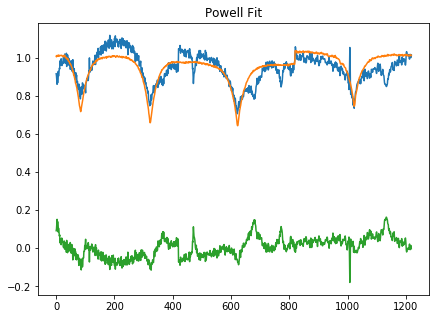

[[Fit Statistics]]
    # fitting method   = Powell
    # function evals   = 153
    # data points      = 1220
    # variables        = 3
    chi-square         = 3.31914236
    reduced chi-square = 0.00272732
    Akaike info crit   = -7200.41765
    Bayesian info crit = -7185.09783
[[Variables]]
    teff:   77734.6161 +/- 236639.342 (304.42%) (init = 15735.49)
    logg:   9.49955607 +/- 0.29791772 (3.14%) (init = 8)
    trans:  2.99995542 +/- 6.4456e-05 (0.00%) (init = 0)

 Starting Bayesian Sampling................
...Done.


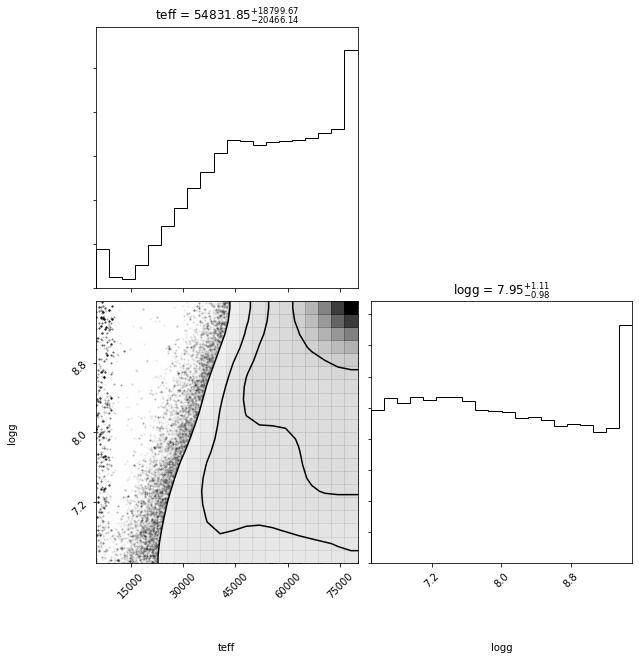

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 100000
    # data points      = 1220
    # variables        = 2
    chi-square         = 3.31913500
    reduced chi-square = 0.00272507
    Akaike info crit   = -7202.42035
    Bayesian info crit = -7192.20714
[[Variables]]
    teff:   54831.8453 +/- 19719.4572 (35.96%) (init = 77734.62)
    logg:   7.94787437 +/- 1.04841946 (13.19%) (init = 9.499556)
    trans:  2.999955 (fixed)
[[Correlations]] (unreported correlations are < 0.100)
    C(teff, logg) =  0.275


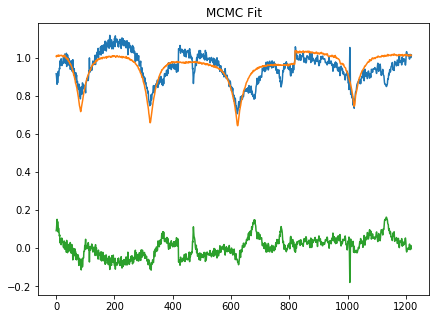









100%|██████████| 1/1 [02:21<00:00, 141.14s/it]

In [157]:
fitoutput = np.zeros((len(y_test),5))
bayesoutput = np.zeros((len(y_test),5))
for i in tqdm(range(len(normspec))):
    spec = normspec[i][lines]
    fitoutput[i,0] = int(specnames[i][:-12])
    bayesoutput[i,0] = int(specnames[i][:-12])
    result = fitter.fit(spec*modelscaling,params,wl=lamgrid[lines],method="powell",nan_policy='omit',calc_covar=True,
                       fit_kws={'reduce_fcn':chisquare})
    
    fitoutput[i,1] = result.params['teff'].value
    fitoutput[i,2] = result.params['teff'].stderr
    fitoutput[i,3] = result.params['logg'].value
    fitoutput[i,4] = result.params['logg'].stderr
    
    plt.figure(figsize=(7,5))
    plt.plot(spec*modelscaling)
    plt.plot(spectrum_sampler(None,result.params['teff'],result.params['logg'],result.params['trans']))
    plt.plot(result.residual)
    plt.title('Powell Fit')
    plt.show()
    print(lmfit.fit_report(result))
    
    # BAYESIAN FITTING ##
    
    bayesparams['teff'].set(value = result.params['teff'].value)
    bayesparams['logg'].set(value = result.params['logg'])
    print('\n Starting Bayesian Sampling................')
    bayesparams['trans'].set(value = result.params['trans'].value,vary=False)
    bayesresult = fitter.fit(spec*modelscaling,bayesparams,wl=lamgrid[lines],method="emcee",nan_policy='omit',\
                             calc_covar=True, fit_kws={'nwalkers':100,'steps':1000})
    print('...Done.')
    fig,axs = plt.subplots(2,2,figsize=(10,10))
    f = corner.corner(bayesresult.flatchain[['teff','logg']],smooth=2,fig=fig,show_titles = True)
    plt.show()
    print(lmfit.fit_report(bayesresult))
    plt.figure(figsize=(7,5))
    plt.plot(spec*modelscaling)
    plt.plot(spectrum_sampler(None,bayesresult.params['teff'],bayesresult.params['logg'],bayesresult.params['trans']))
    plt.plot(result.residual)
    plt.title('MCMC Fit')
    plt.show()
    bayesoutput[i,1] = bayesresult.params['teff'].value
    bayesoutput[i,2] = bayesresult.params['teff'].stderr
    bayesoutput[i,3] = bayesresult.params['logg'].value
    bayesoutput[i,4] = bayesresult.params['logg'].stderr

In [ ]:
fig = plt.subplots(2,2,figsize=(10,10))
    f = corner.corner(bayesresult.flatchain[['teff','logg']],smooth=2,fig=fig,show_titles = True)
    plt.show()